<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Wed Feb 21 19:20:44 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   27C    P0              47W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 8s, sys: 6.68 ms, total: 9min 8s
Wall time: 9min 10s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

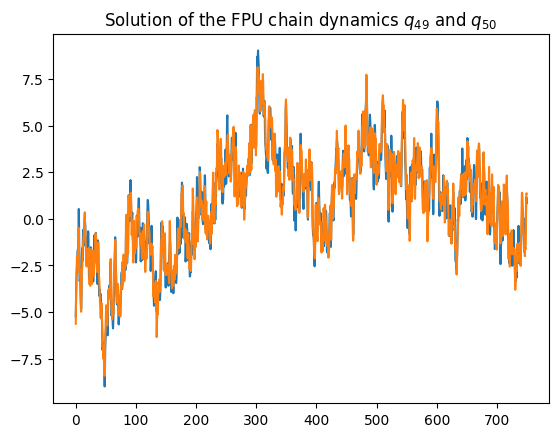

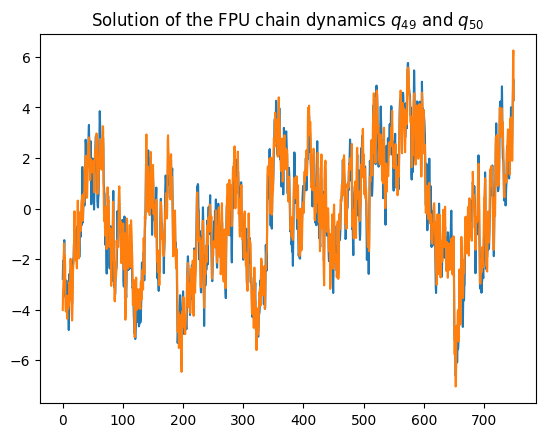

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


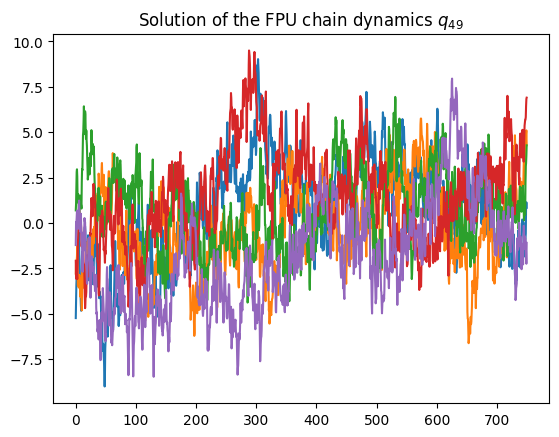

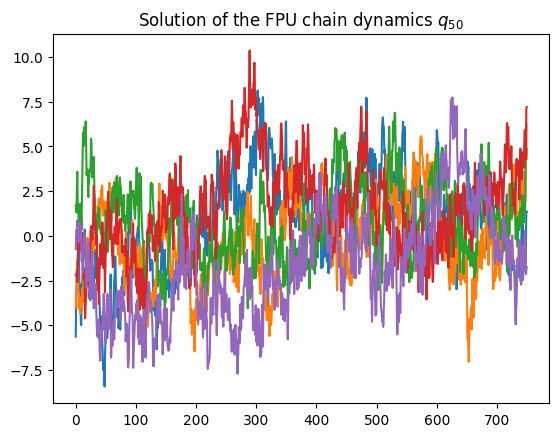

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


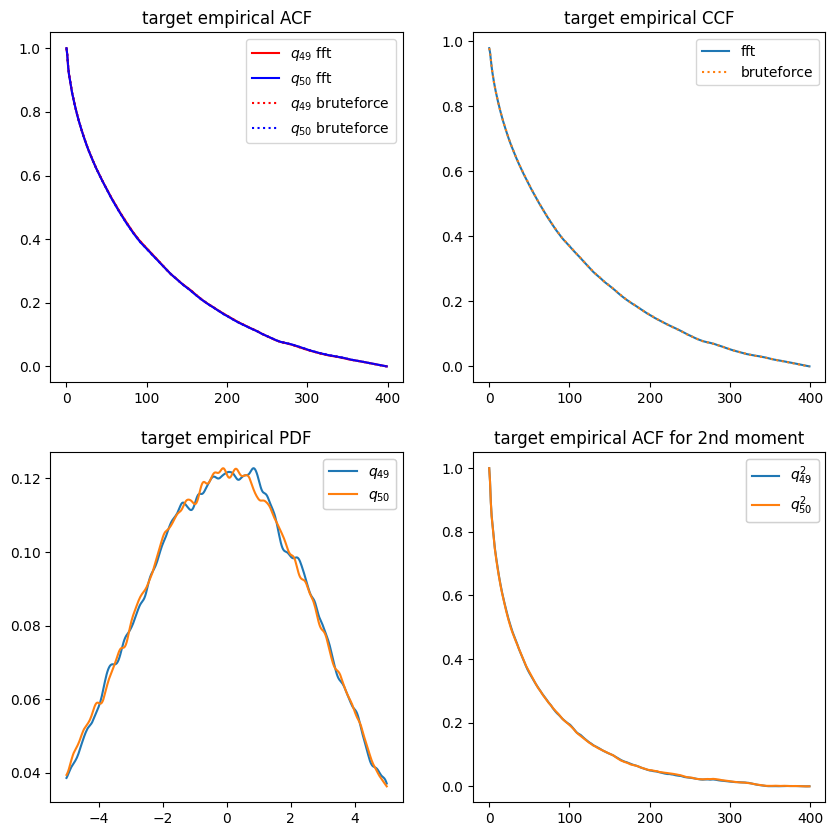

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

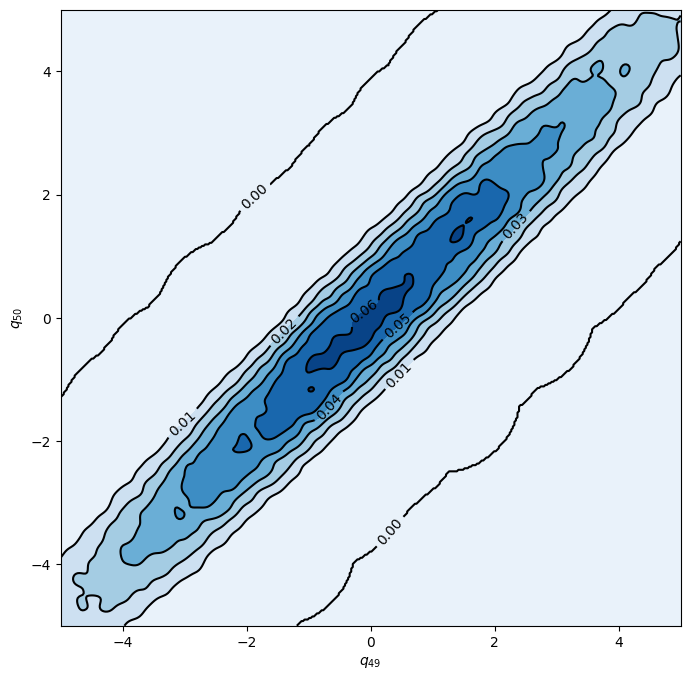

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

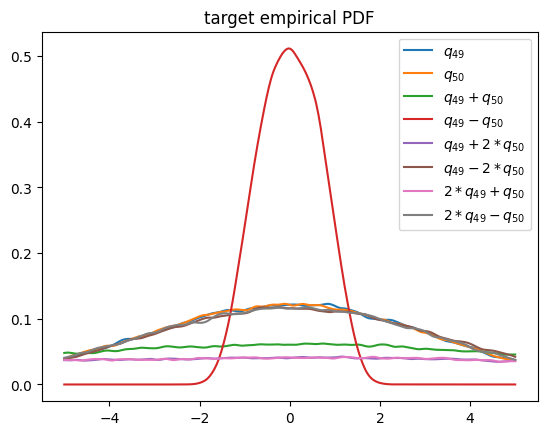

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(1.).float()
        self.x_pdf2_s = torch.tensor(1.).float()
        self.x_acf2_s = torch.tensor(1.).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8352, 0.8279, acf: 0.10118, ccf: 0.10205, pdf: 0.29261, pdf2: 0.28777, acf2: 0.04426
[50]-th step loss: 0.0891, 0.0900, acf: 0.01715, ccf: 0.01715, pdf: 0.03086, pdf2: 0.02288, acf2: 0.00199
[100]-th step loss: 0.0530, 0.0483, acf: 0.01271, ccf: 0.01268, pdf: 0.01150, pdf2: 0.00813, acf2: 0.00326
[150]-th step loss: 0.0296, 0.0217, acf: 0.00375, ccf: 0.00375, pdf: 0.00636, pdf2: 0.00595, acf2: 0.00185
[200]-th step loss: 0.2261, 0.2268, acf: 0.08288, ccf: 0.08270, pdf: 0.01700, pdf2: 0.01398, acf2: 0.03028
[250]-th step loss: 0.1681, 0.1730, acf: 0.06902, ccf: 0.06887, pdf: 0.00764, pdf2: 0.00522, acf2: 0.02228
[300]-th step loss: 0.0326, 0.0315, acf: 0.00216, ccf: 0.00219, pdf: 0.01385, pdf2: 0.01107, acf2: 0.00220
[350]-th step loss: 0.0154, 0.0153, acf: 0.00467, ccf: 0.00467, pdf: 0.00176, pdf2: 0.00253, acf2: 0.00168
[400]-th step loss: 0.0111, 0.0135, acf: 0.00495, ccf: 0.00495, pdf: 0.00076, pdf2: 0.00129, acf2: 0.00160
[450]-th step loss: 0.0050, 0.0081, acf:

[3850]-th step loss: 0.2053, 0.2107, acf: 0.08837, ccf: 0.08819, pdf: 0.00000, pdf2: 0.00000, acf2: 0.03416
[3900]-th step loss: 0.2043, 0.2052, acf: 0.08683, ccf: 0.08665, pdf: 0.00001, pdf2: 0.00000, acf2: 0.03169
[3950]-th step loss: 0.1813, 0.1879, acf: 0.08173, ccf: 0.08157, pdf: 0.00001, pdf2: 0.00000, acf2: 0.02460
[4000]-th step loss: 0.1616, 0.1653, acf: 0.07450, ccf: 0.07435, pdf: 0.00001, pdf2: 0.00001, acf2: 0.01639
[4050]-th step loss: 0.1211, 0.1169, acf: 0.05639, ccf: 0.05627, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00422
[4100]-th step loss: 0.0577, 0.0476, acf: 0.02051, ccf: 0.02045, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00666
[4150]-th step loss: 0.0348, 0.0340, acf: 0.00596, ccf: 0.00593, pdf: 0.00003, pdf2: 0.00001, acf2: 0.02209
[4200]-th step loss: 0.0287, 0.0321, acf: 0.01481, ccf: 0.01477, pdf: 0.00039, pdf2: 0.00015, acf2: 0.00197
[4250]-th step loss: 0.0214, 0.0174, acf: 0.00768, ccf: 0.00762, pdf: 0.00018, pdf2: 0.00006, acf2: 0.00185
[4300]-th step loss: 0.0069,

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

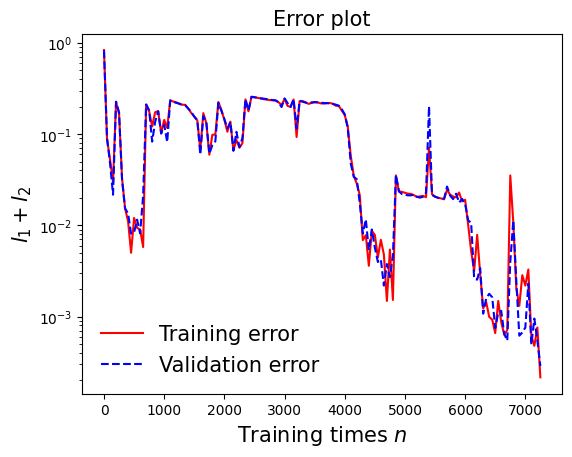

In [25]:
draw_loss(model)

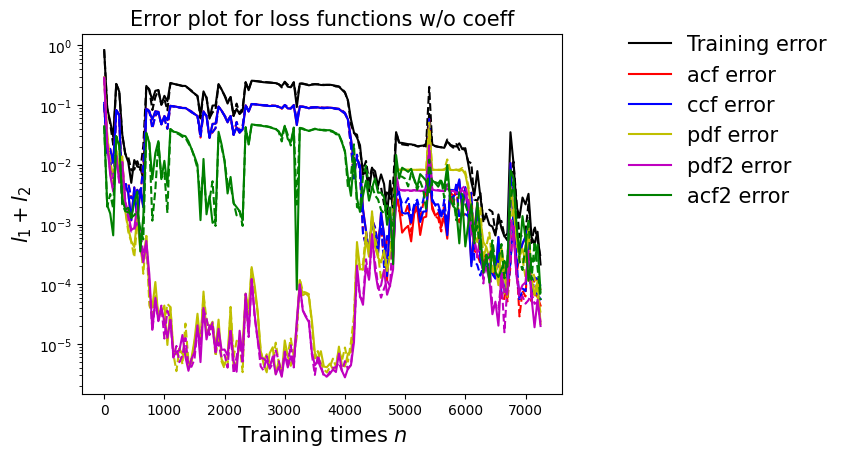

In [26]:
draw_errors(model)

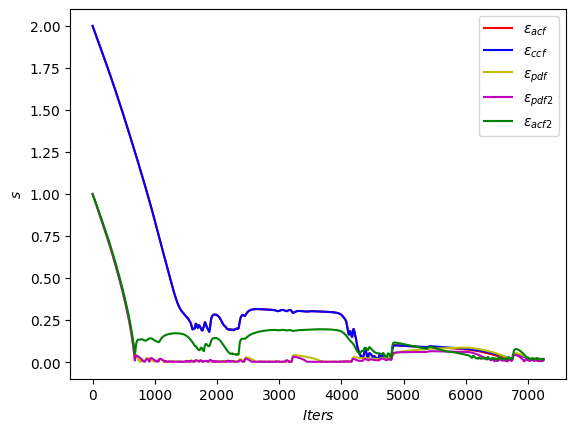

In [27]:
draw_adaptive_w(model)

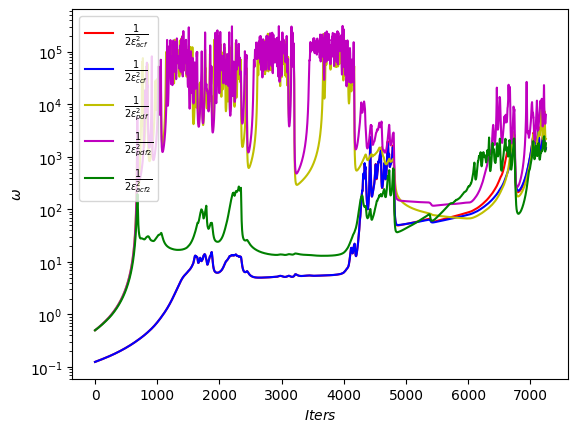

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

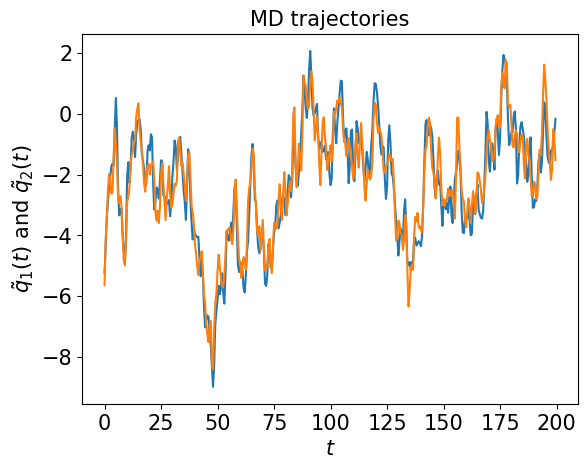

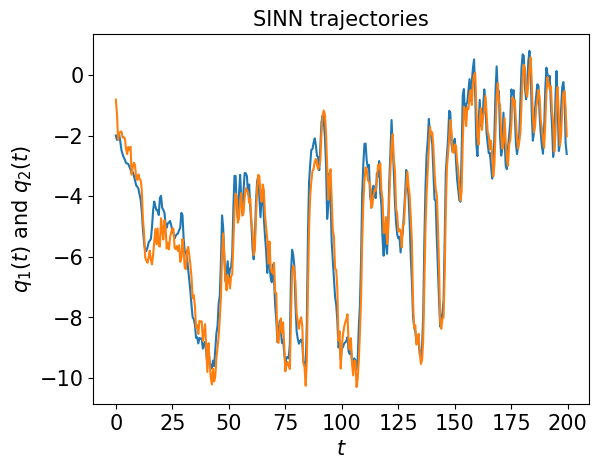

In [36]:
test1(model)

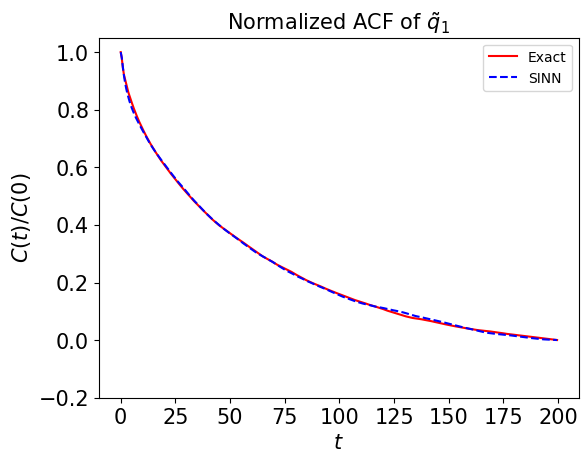

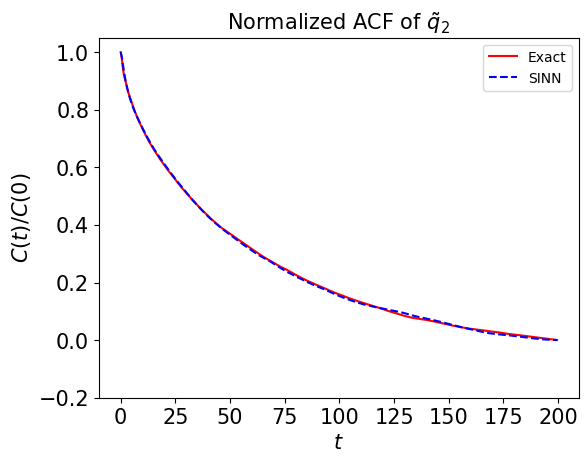

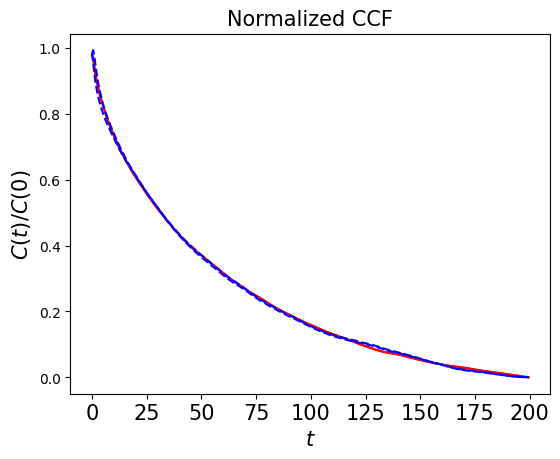

In [37]:
test2(model)

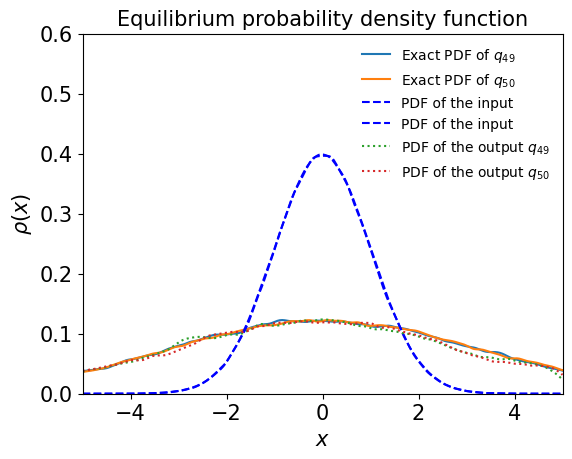

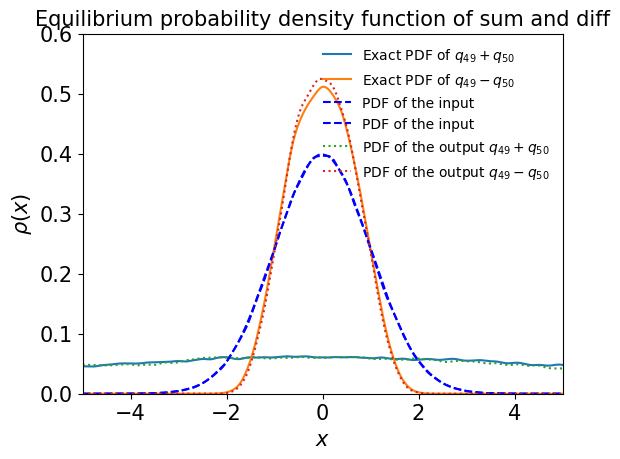

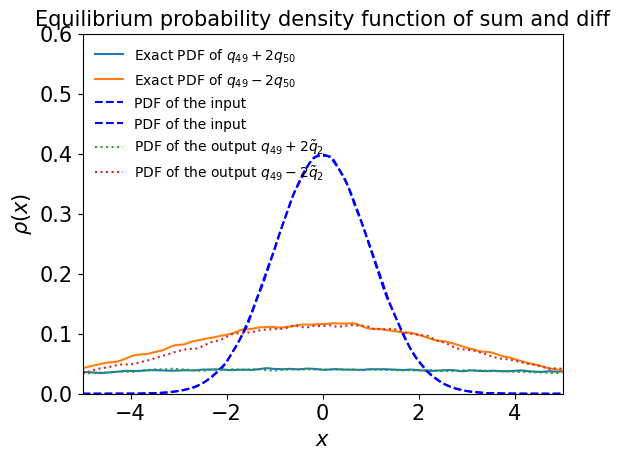

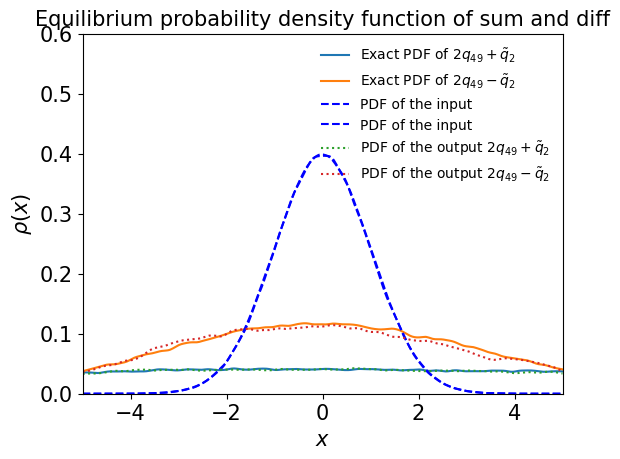

In [38]:
test3(model)

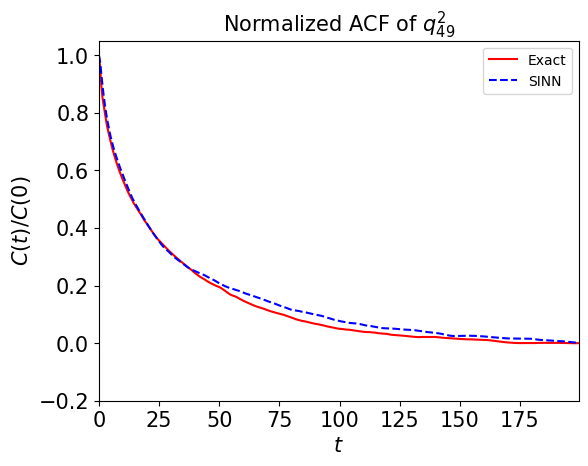

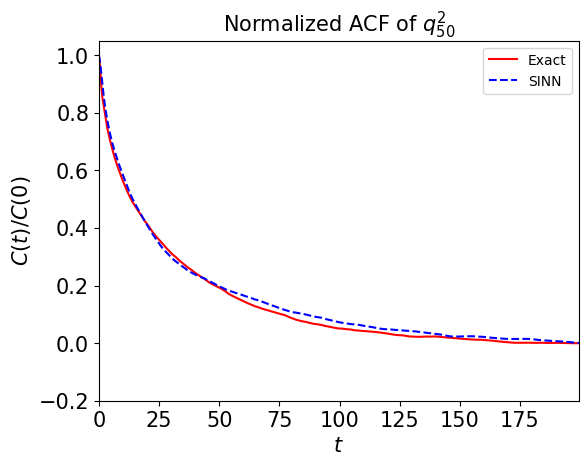

In [39]:
test4(model)

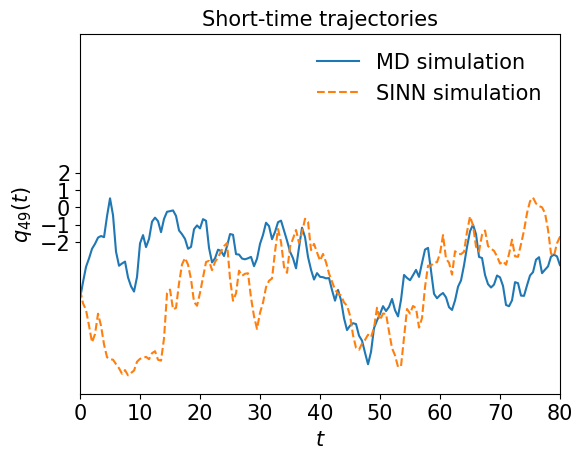

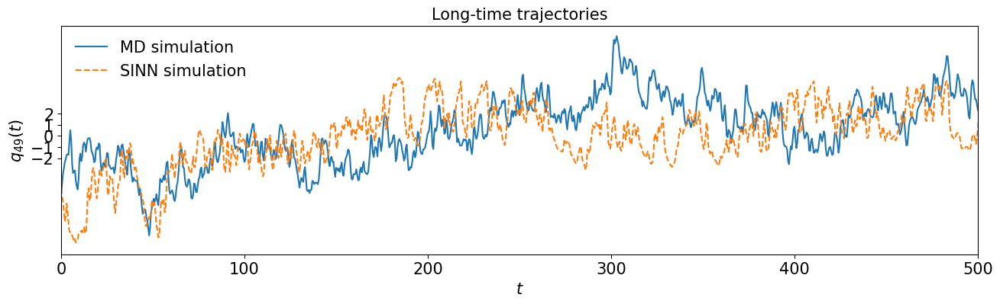

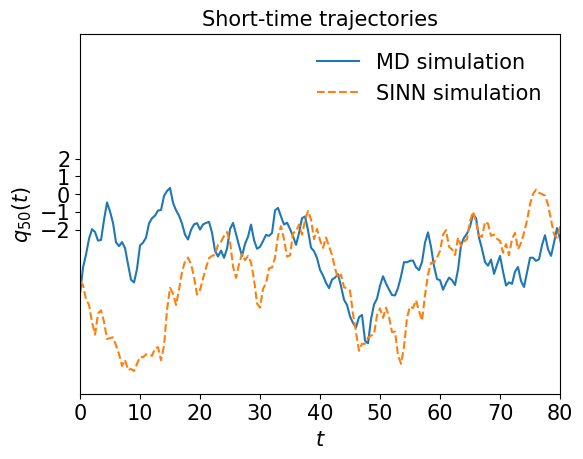

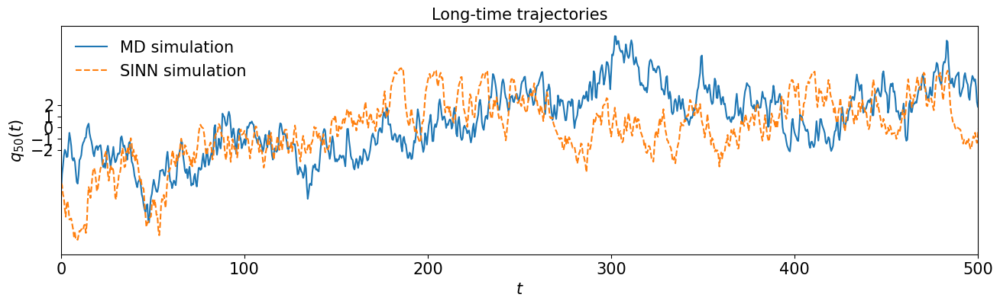

In [40]:
test5(model)

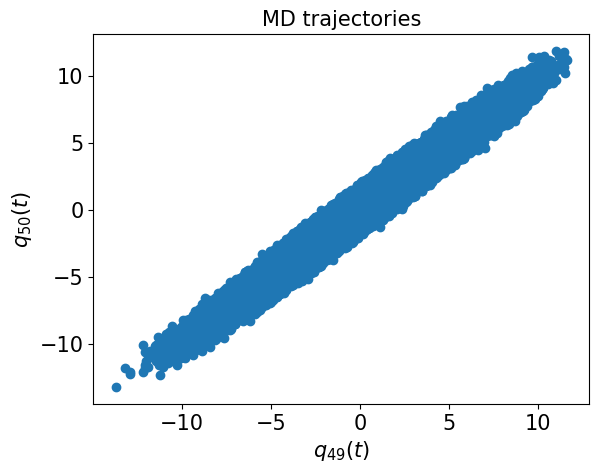

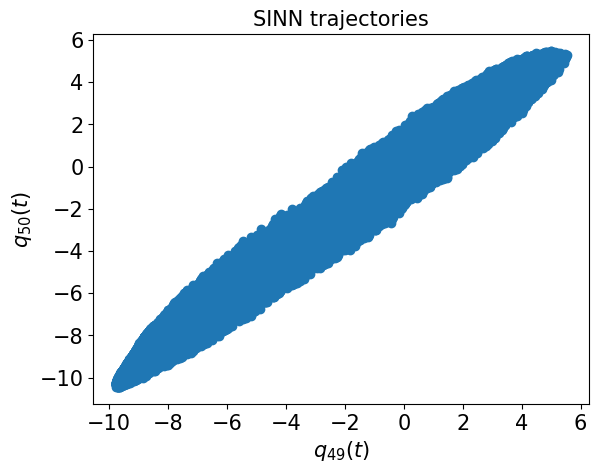

In [41]:
test6(model)

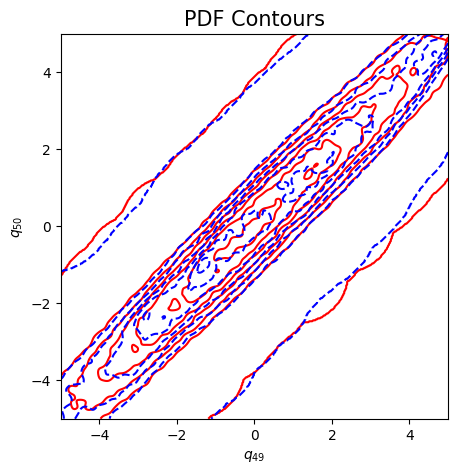

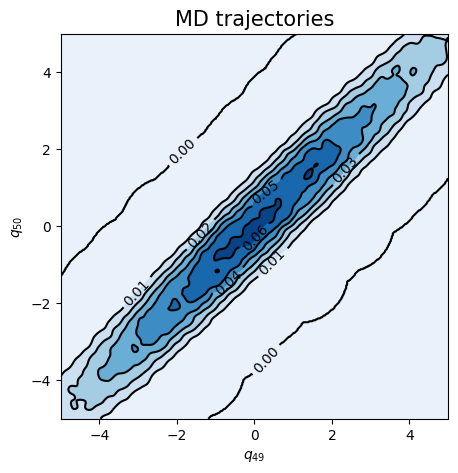

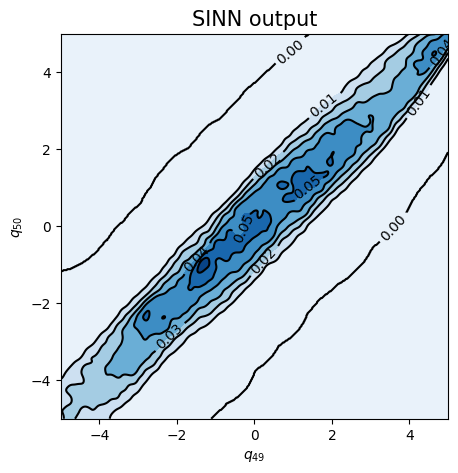

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8503, 0.8423, acf: 0.10263, ccf: 0.11759, pdf: 0.29172, pdf2: 0.28478, acf2: 0.04561
[50]-th step loss: 0.1038, 0.1063, acf: 0.03165, ccf: 0.03158, pdf: 0.02461, pdf2: 0.01615, acf2: 0.00236
[100]-th step loss: 0.0451, 0.0380, acf: 0.01301, ccf: 0.01304, pdf: 0.00715, pdf2: 0.00212, acf2: 0.00264
[150]-th step loss: 0.0078, 0.0128, acf: 0.00381, ccf: 0.00426, pdf: 0.00245, pdf2: 0.00127, acf2: 0.00098
[200]-th step loss: 0.0198, 0.0229, acf: 0.00224, ccf: 0.00185, pdf: 0.00797, pdf2: 0.00267, acf2: 0.00813
[250]-th step loss: 0.0142, 0.0123, acf: 0.00145, ccf: 0.00166, pdf: 0.00703, pdf2: 0.00151, acf2: 0.00062
[300]-th step loss: 0.0193, 0.0147, acf: 0.00090, ccf: 0.00232, pdf: 0.00567, pdf2: 0.00318, acf2: 0.00266
[350]-th step loss: 0.0115, 0.0107, acf: 0.00378, ccf: 0.00391, pdf: 0.00075, pdf2: 0.00070, acf2: 0.00155
[400]-th step loss: 0.0186, 0.0133, acf: 0.00206, ccf: 0.00173, pdf: 0.00269, pdf2: 0.00075, acf2: 0.00603
[450]-th step loss: 0.3587, 0.3567, acf:

[3850]-th step loss: 0.0274, 0.0231, acf: 0.00294, ccf: 0.00311, pdf: 0.00829, pdf2: 0.00433, acf2: 0.00444
[3900]-th step loss: 0.0233, 0.0237, acf: 0.00415, ccf: 0.00434, pdf: 0.00829, pdf2: 0.00395, acf2: 0.00302
[3950]-th step loss: 0.0303, 0.0296, acf: 0.00826, ccf: 0.00848, pdf: 0.00829, pdf2: 0.00376, acf2: 0.00078
[4000]-th step loss: 0.0275, 0.0246, acf: 0.00500, ccf: 0.00524, pdf: 0.00828, pdf2: 0.00387, acf2: 0.00221
[4050]-th step loss: 0.0361, 0.0344, acf: 0.01096, ccf: 0.01118, pdf: 0.00828, pdf2: 0.00379, acf2: 0.00019
[4100]-th step loss: 0.0279, 0.0320, acf: 0.00972, ccf: 0.00989, pdf: 0.00828, pdf2: 0.00374, acf2: 0.00035
[4150]-th step loss: 0.0472, 0.0452, acf: 0.01518, ccf: 0.01557, pdf: 0.00829, pdf2: 0.00596, acf2: 0.00020
[4200]-th step loss: 0.0393, 0.0312, acf: 0.00853, ccf: 0.00877, pdf: 0.00829, pdf2: 0.00396, acf2: 0.00161
[4250]-th step loss: 0.0365, 0.0324, acf: 0.00975, ccf: 0.00996, pdf: 0.00829, pdf2: 0.00375, acf2: 0.00060
[4300]-th step loss: 0.0934,

[7650]-th step loss: 0.0285, 0.0267, acf: 0.00702, ccf: 0.00706, pdf: 0.00832, pdf2: 0.00370, acf2: 0.00064
[7700]-th step loss: 0.0423, 0.0303, acf: 0.00903, ccf: 0.00904, pdf: 0.00829, pdf2: 0.00369, acf2: 0.00025
[7750]-th step loss: 0.0279, 0.0303, acf: 0.00863, ccf: 0.00868, pdf: 0.00829, pdf2: 0.00428, acf2: 0.00047
[7800]-th step loss: 0.0360, 0.0310, acf: 0.00947, ccf: 0.00948, pdf: 0.00828, pdf2: 0.00362, acf2: 0.00014
[7850]-th step loss: 0.0286, 0.0267, acf: 0.00706, ccf: 0.00708, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00058
[7900]-th step loss: 0.0309, 0.0269, acf: 0.00720, ccf: 0.00721, pdf: 0.00828, pdf2: 0.00368, acf2: 0.00051
[7950]-th step loss: 0.0384, 0.0332, acf: 0.01048, ccf: 0.01051, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00009
[8000]-th step loss: 0.0364, 0.0307, acf: 0.00931, ccf: 0.00931, pdf: 0.00831, pdf2: 0.00367, acf2: 0.00014
[8050]-th step loss: 0.0301, 0.0307, acf: 0.00911, ccf: 0.00911, pdf: 0.00828, pdf2: 0.00393, acf2: 0.00022
[8100]-th step loss: 0.0332,

[11450]-th step loss: 0.0140, 0.0142, acf: 0.00007, ccf: 0.00007, pdf: 0.00824, pdf2: 0.00353, acf2: 0.00228
[11500]-th step loss: 0.0149, 0.0146, acf: 0.00010, ccf: 0.00010, pdf: 0.00828, pdf2: 0.00361, acf2: 0.00251
[11550]-th step loss: 0.0137, 0.0141, acf: 0.00009, ccf: 0.00009, pdf: 0.00861, pdf2: 0.00366, acf2: 0.00169
[11600]-th step loss: 0.0138, 0.0144, acf: 0.00008, ccf: 0.00009, pdf: 0.00874, pdf2: 0.00353, acf2: 0.00200
[11650]-th step loss: 0.0139, 0.0140, acf: 0.00002, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00352, acf2: 0.00220
[11700]-th step loss: 0.0131, 0.0135, acf: 0.00016, ccf: 0.00016, pdf: 0.00828, pdf2: 0.00350, acf2: 0.00137
[11750]-th step loss: 0.0136, 0.0137, acf: 0.00003, ccf: 0.00003, pdf: 0.00839, pdf2: 0.00349, acf2: 0.00172
[11800]-th step loss: 0.0161, 0.0138, acf: 0.00002, ccf: 0.00002, pdf: 0.00837, pdf2: 0.00351, acf2: 0.00188
[11850]-th step loss: 0.0162, 0.0169, acf: 0.00023, ccf: 0.00023, pdf: 0.00865, pdf2: 0.00368, acf2: 0.00407
[11900]-th step los

[15250]-th step loss: 0.0119, 0.0119, acf: 0.00013, ccf: 0.00013, pdf: 0.00796, pdf2: 0.00335, acf2: 0.00031
[15300]-th step loss: 0.0127, 0.0133, acf: 0.00004, ccf: 0.00004, pdf: 0.00919, pdf2: 0.00326, acf2: 0.00075
[15350]-th step loss: 0.0133, 0.0134, acf: 0.00008, ccf: 0.00008, pdf: 0.00959, pdf2: 0.00330, acf2: 0.00034
[15400]-th step loss: 0.0121, 0.0118, acf: 0.00004, ccf: 0.00004, pdf: 0.00803, pdf2: 0.00330, acf2: 0.00037
[15450]-th step loss: 0.0131, 0.0131, acf: 0.00006, ccf: 0.00007, pdf: 0.00894, pdf2: 0.00339, acf2: 0.00069
[15500]-th step loss: 0.0124, 0.0123, acf: 0.00004, ccf: 0.00005, pdf: 0.00827, pdf2: 0.00334, acf2: 0.00055
[15550]-th step loss: 0.0122, 0.0117, acf: 0.00011, ccf: 0.00011, pdf: 0.00788, pdf2: 0.00329, acf2: 0.00028
[15600]-th step loss: 0.0137, 0.0134, acf: 0.00045, ccf: 0.00044, pdf: 0.00808, pdf2: 0.00360, acf2: 0.00082
[15650]-th step loss: 0.0118, 0.0119, acf: 0.00002, ccf: 0.00002, pdf: 0.00805, pdf2: 0.00334, acf2: 0.00046
[15700]-th step los

[19050]-th step loss: 0.0117, 0.0115, acf: 0.00022, ccf: 0.00021, pdf: 0.00760, pdf2: 0.00333, acf2: 0.00018
[19100]-th step loss: 0.0110, 0.0111, acf: 0.00017, ccf: 0.00016, pdf: 0.00715, pdf2: 0.00337, acf2: 0.00028
[19150]-th step loss: 0.0111, 0.0110, acf: 0.00020, ccf: 0.00019, pdf: 0.00720, pdf2: 0.00318, acf2: 0.00024
[19200]-th step loss: 0.0115, 0.0110, acf: 0.00003, ccf: 0.00002, pdf: 0.00709, pdf2: 0.00347, acf2: 0.00038
[19250]-th step loss: 0.0120, 0.0113, acf: 0.00014, ccf: 0.00014, pdf: 0.00764, pdf2: 0.00312, acf2: 0.00030
[19300]-th step loss: 0.0117, 0.0116, acf: 0.00021, ccf: 0.00021, pdf: 0.00785, pdf2: 0.00312, acf2: 0.00021
[19350]-th step loss: 0.0115, 0.0113, acf: 0.00023, ccf: 0.00021, pdf: 0.00723, pdf2: 0.00343, acf2: 0.00016
[19400]-th step loss: 0.0108, 0.0113, acf: 0.00023, ccf: 0.00023, pdf: 0.00743, pdf2: 0.00318, acf2: 0.00023
[19450]-th step loss: 0.0111, 0.0111, acf: 0.00020, ccf: 0.00019, pdf: 0.00725, pdf2: 0.00328, acf2: 0.00019
[19500]-th step los

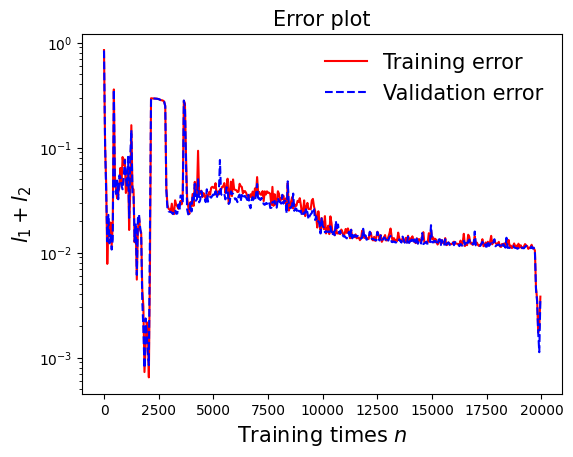

In [44]:
draw_loss(model1)

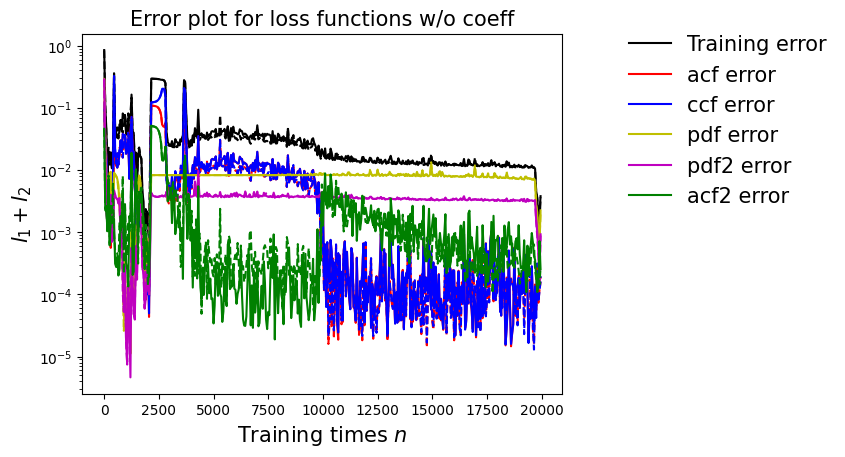

In [45]:
draw_errors(model1)

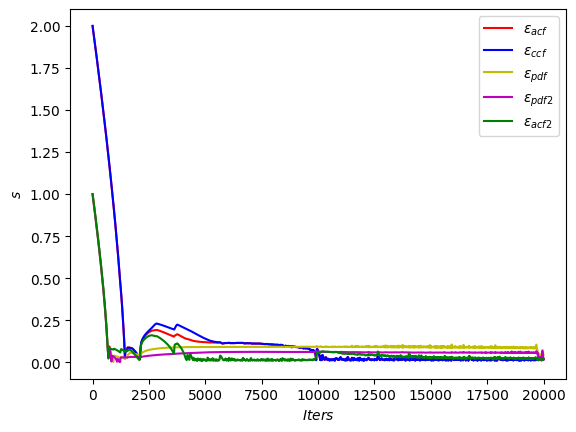

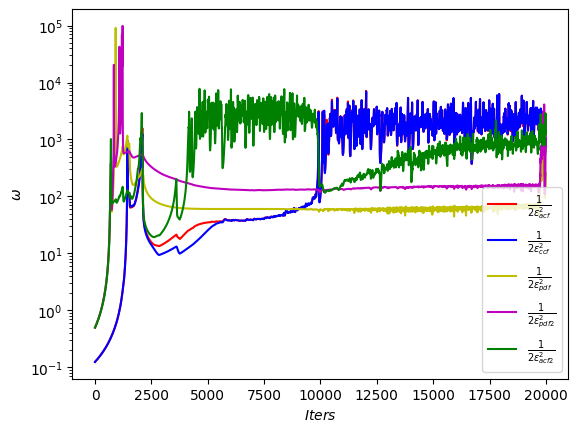

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

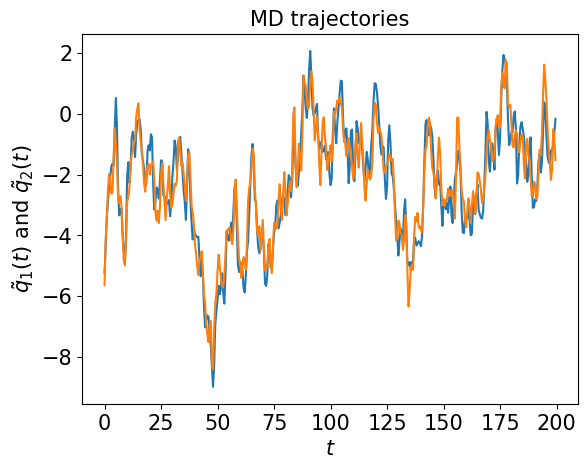

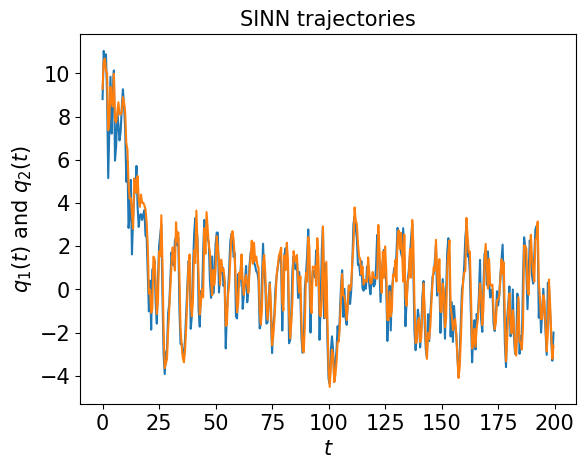

In [47]:
test1(model1)

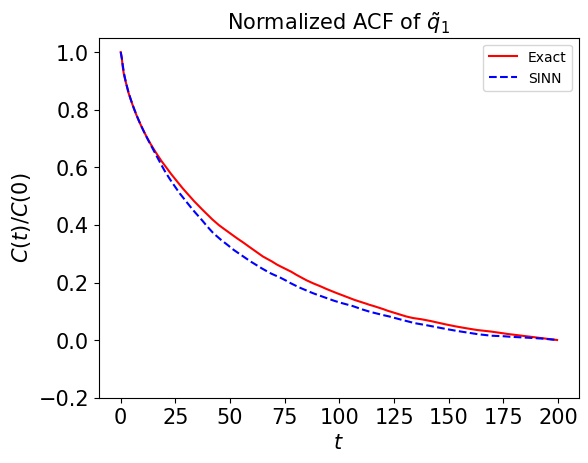

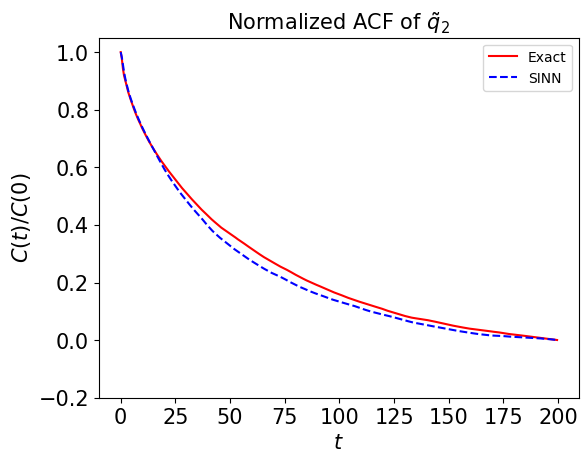

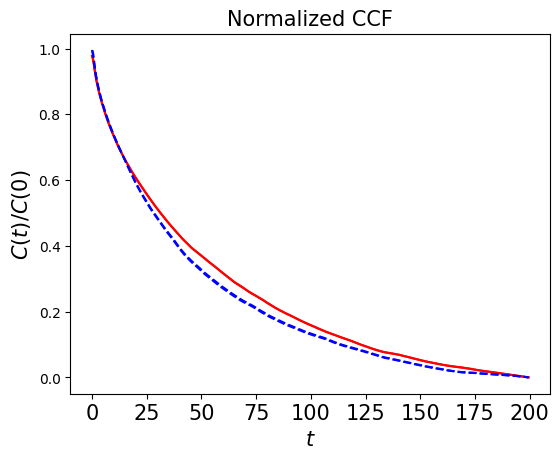

In [48]:
test2(model1)

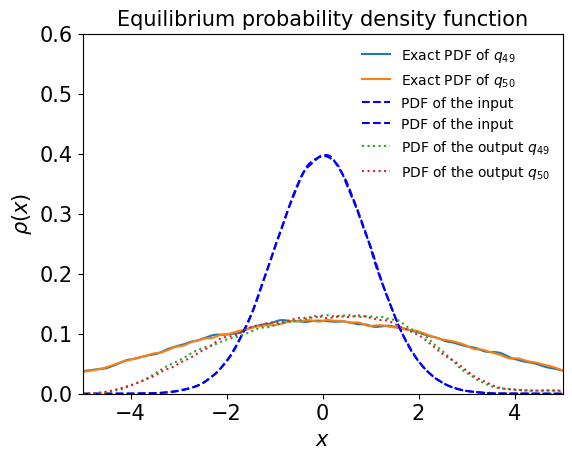

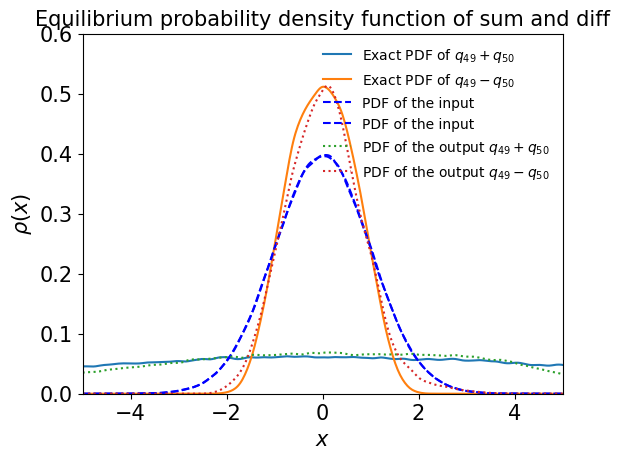

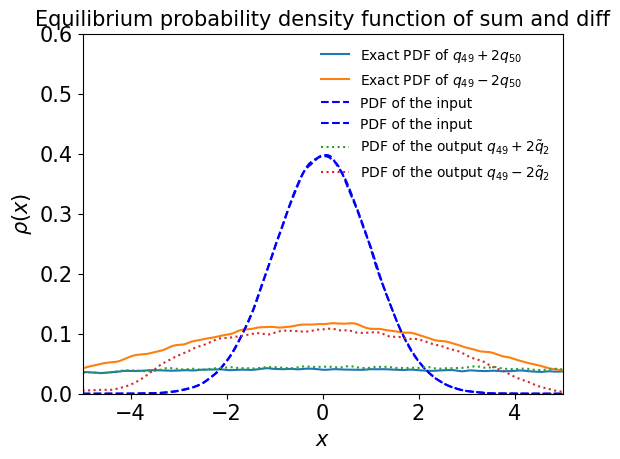

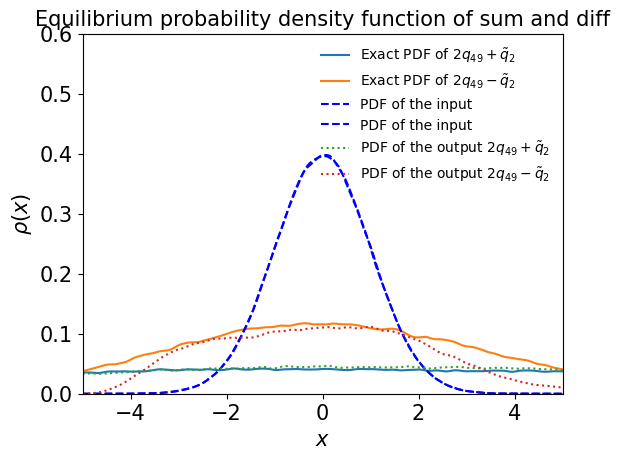

In [49]:
test3(model1)

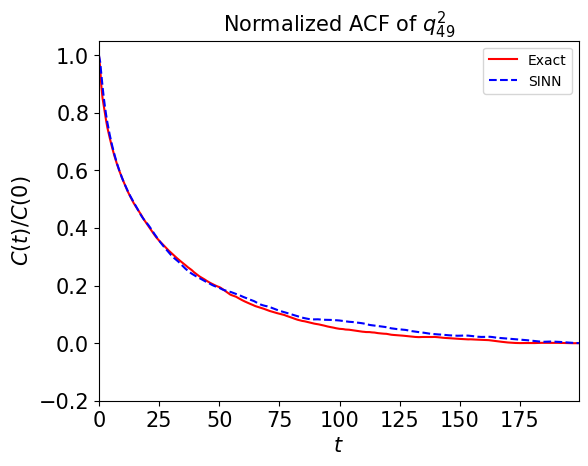

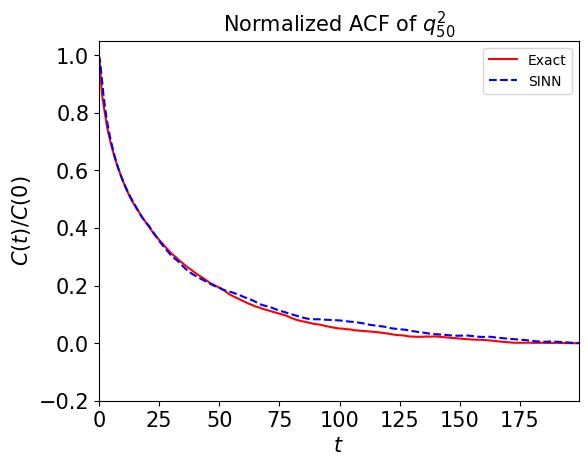

In [50]:
test4(model1)

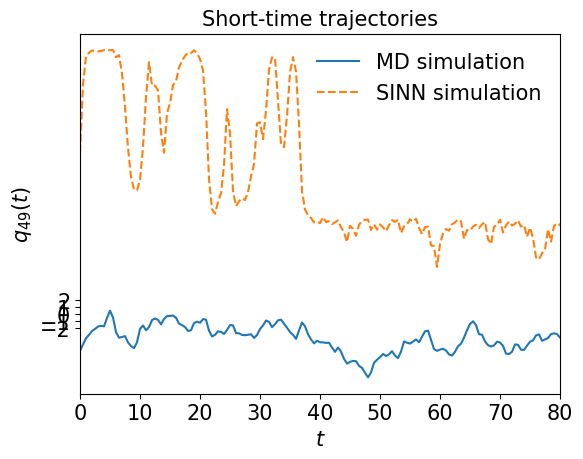

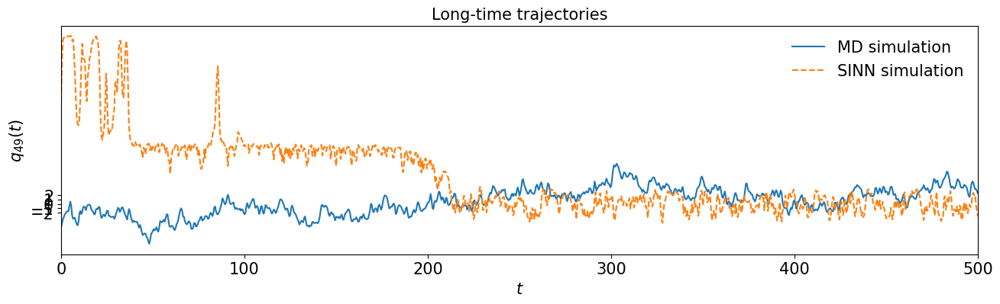

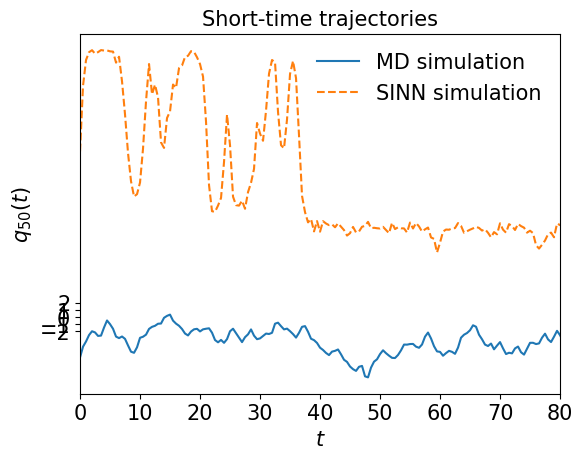

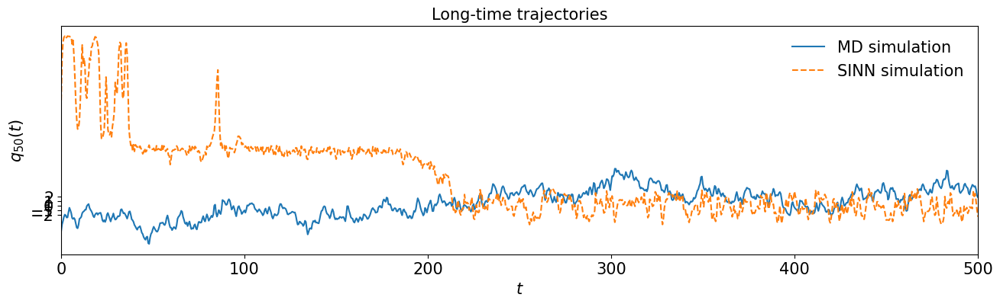

In [51]:
test5(model1)

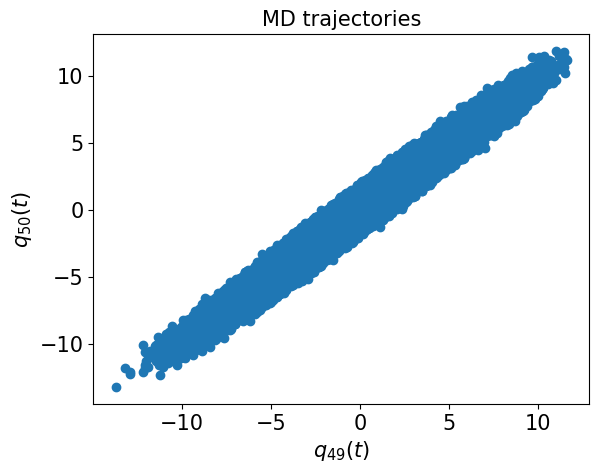

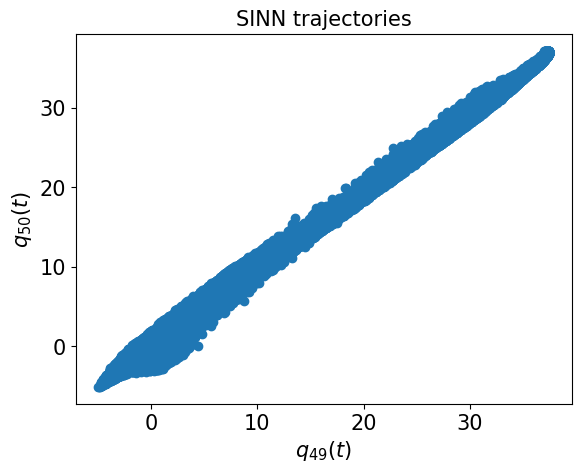

In [52]:
test6(model1)

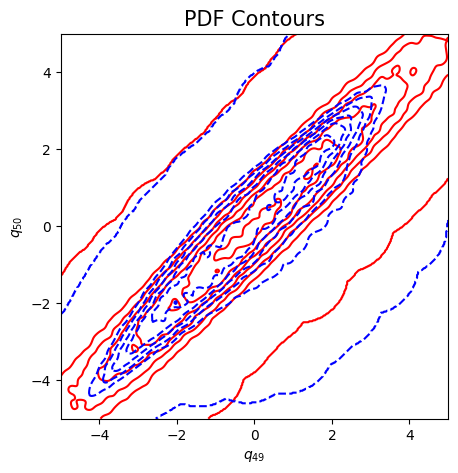

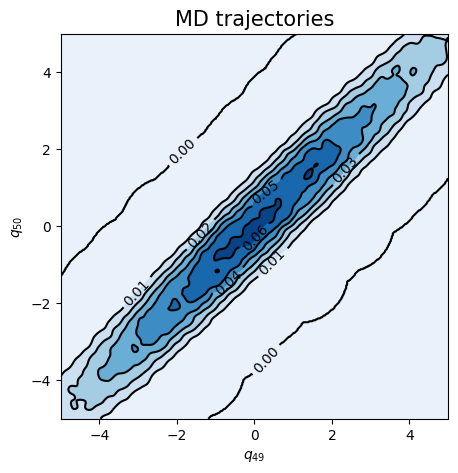

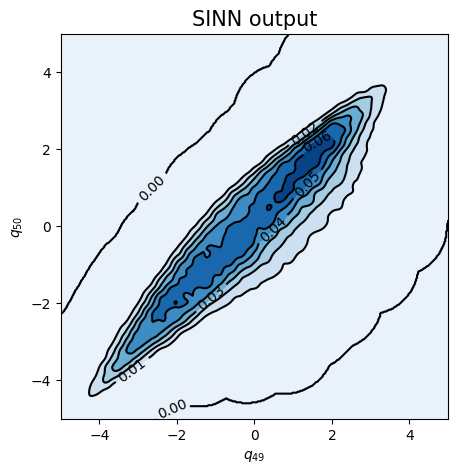

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8346, 0.8267, acf: 0.10043, ccf: 0.10050, pdf: 0.29286, pdf2: 0.28904, acf2: 0.04384
[50]-th step loss: 0.0881, 0.0698, acf: 0.01040, ccf: 0.01037, pdf: 0.02359, pdf2: 0.01986, acf2: 0.00555
[100]-th step loss: 0.0463, 0.0639, acf: 0.02291, ccf: 0.02285, pdf: 0.00866, pdf2: 0.00759, acf2: 0.00192
[150]-th step loss: 0.0289, 0.0264, acf: 0.00658, ccf: 0.00657, pdf: 0.00562, pdf2: 0.00465, acf2: 0.00301
[200]-th step loss: 0.0155, 0.0135, acf: 0.00202, ccf: 0.00203, pdf: 0.00460, pdf2: 0.00382, acf2: 0.00105
[250]-th step loss: 0.0289, 0.0262, acf: 0.00121, ccf: 0.00118, pdf: 0.01086, pdf2: 0.01229, acf2: 0.00069
[300]-th step loss: 0.0220, 0.0128, acf: 0.00378, ccf: 0.00377, pdf: 0.00180, pdf2: 0.00242, acf2: 0.00105
[350]-th step loss: 0.0061, 0.0044, acf: 0.00104, ccf: 0.00104, pdf: 0.00064, pdf2: 0.00113, acf2: 0.00053
[400]-th step loss: 0.0042, 0.0031, acf: 0.00046, ccf: 0.00047, pdf: 0.00048, pdf2: 0.00103, acf2: 0.00065
[450]-th step loss: 0.0023, 0.0033, acf:

[3850]-th step loss: 0.0395, 0.0373, acf: 0.01267, ccf: 0.01263, pdf: 0.00825, pdf2: 0.00364, acf2: 0.00007
[3900]-th step loss: 0.0396, 0.0337, acf: 0.01057, ccf: 0.01054, pdf: 0.00826, pdf2: 0.00403, acf2: 0.00027
[3950]-th step loss: 0.0410, 0.0361, acf: 0.01188, ccf: 0.01185, pdf: 0.00826, pdf2: 0.00397, acf2: 0.00011
[4000]-th step loss: 0.0343, 0.0322, acf: 0.00974, ccf: 0.00971, pdf: 0.00826, pdf2: 0.00406, acf2: 0.00039
[4050]-th step loss: 0.0390, 0.0316, acf: 0.00965, ccf: 0.00962, pdf: 0.00829, pdf2: 0.00371, acf2: 0.00034
[4100]-th step loss: 0.0356, 0.0352, acf: 0.01153, ccf: 0.01149, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00011
[4150]-th step loss: 0.0341, 0.0315, acf: 0.00955, ccf: 0.00951, pdf: 0.00830, pdf2: 0.00377, acf2: 0.00038
[4200]-th step loss: 0.0367, 0.0326, acf: 0.01019, ccf: 0.01014, pdf: 0.00821, pdf2: 0.00375, acf2: 0.00030
[4250]-th step loss: 0.0366, 0.0283, acf: 0.00784, ccf: 0.00781, pdf: 0.00823, pdf2: 0.00372, acf2: 0.00073
[4300]-th step loss: 0.0409,

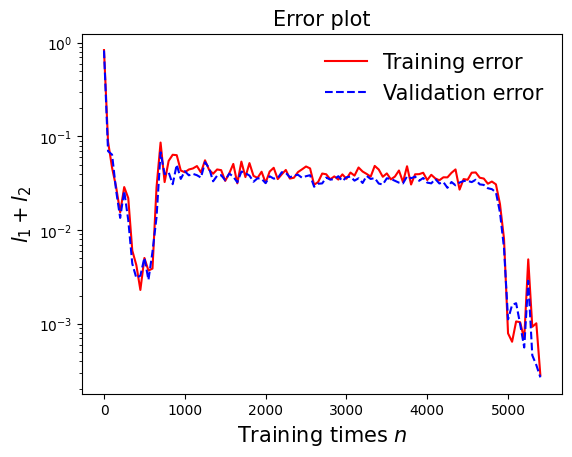

In [55]:
draw_loss(model2)

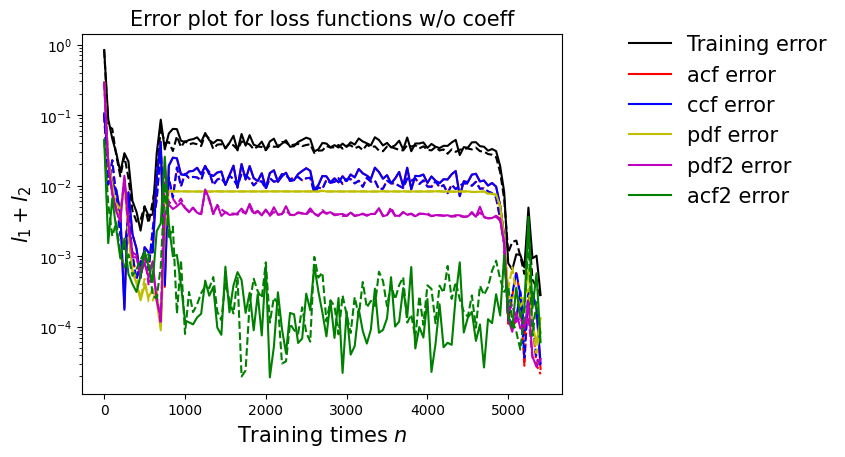

In [56]:
draw_errors(model2)

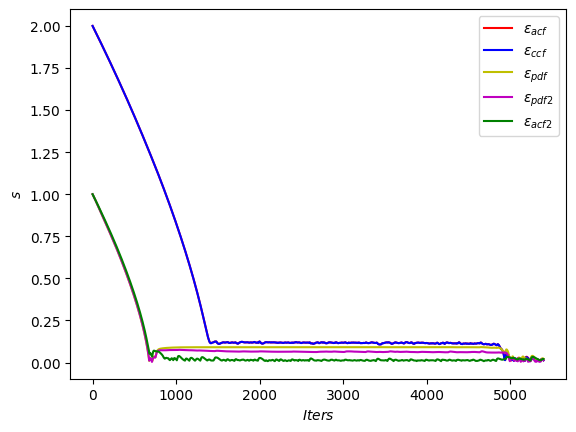

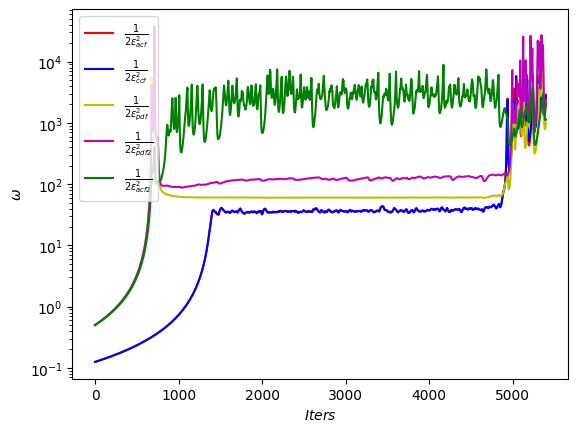

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

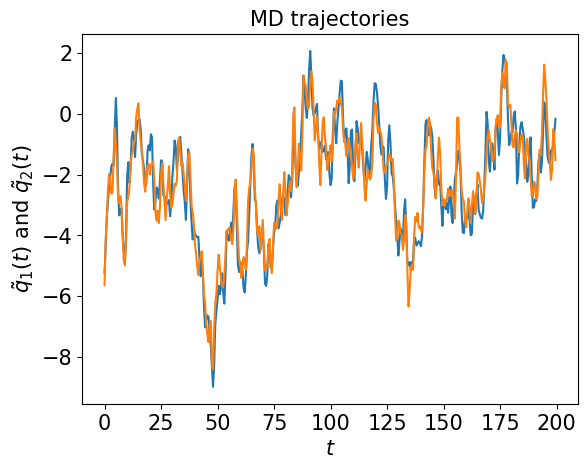

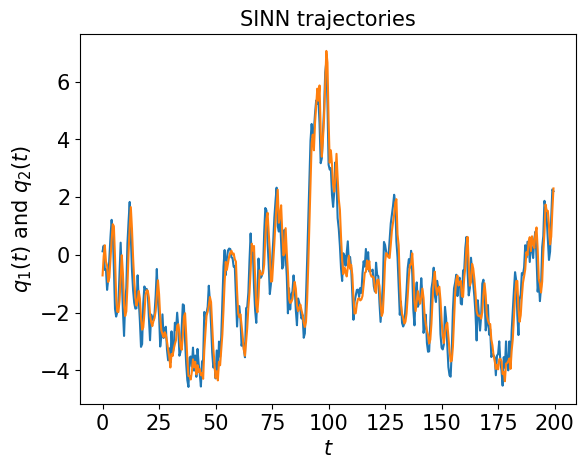

In [58]:
test1(model2)

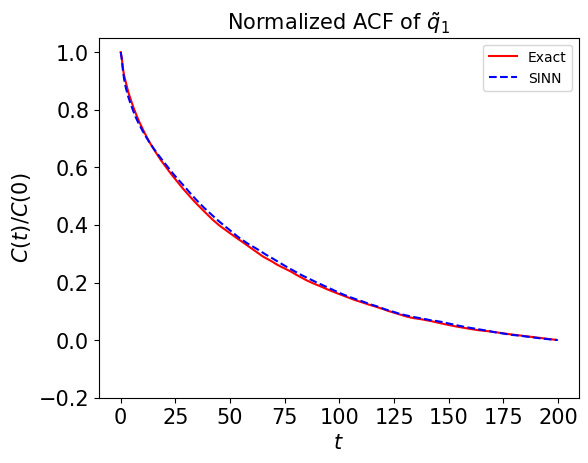

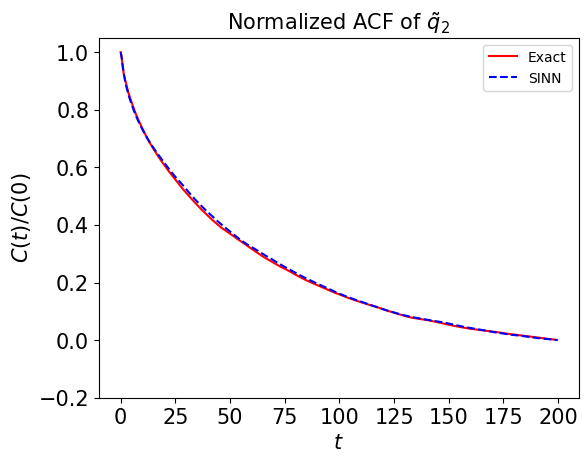

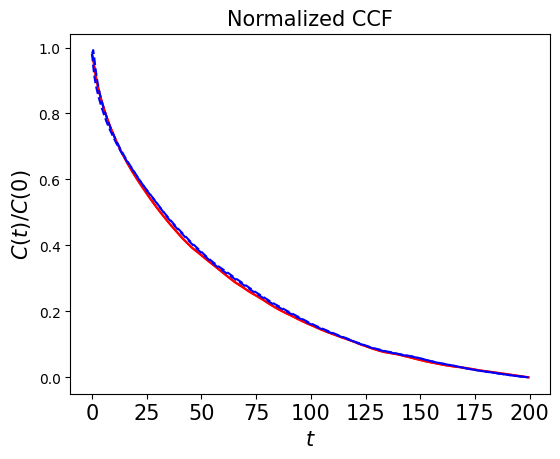

In [59]:
test2(model2)

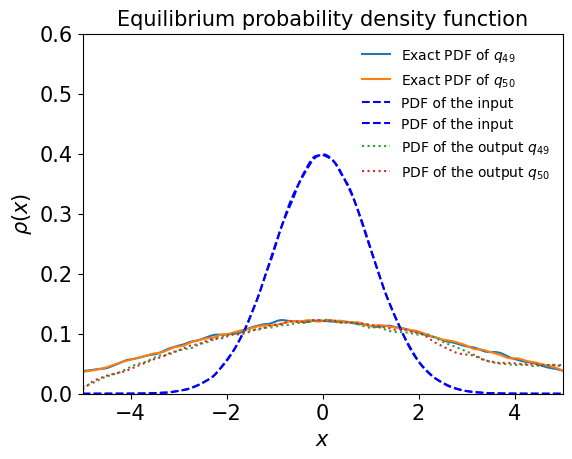

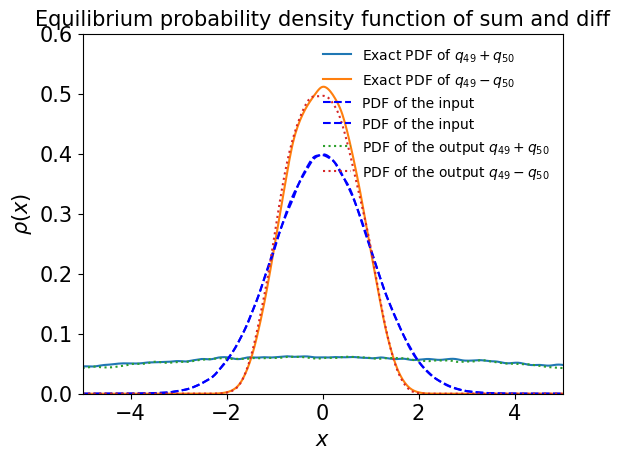

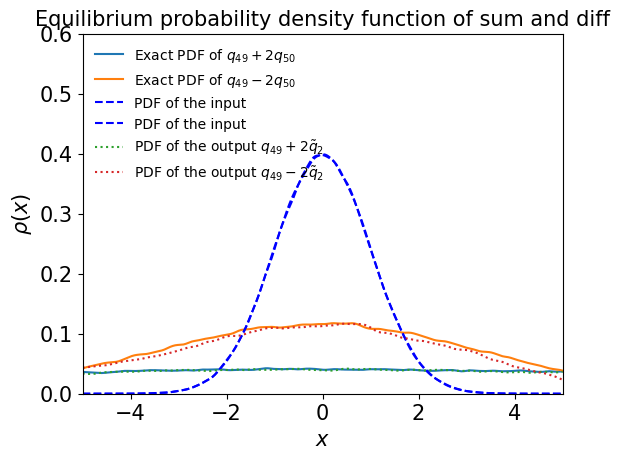

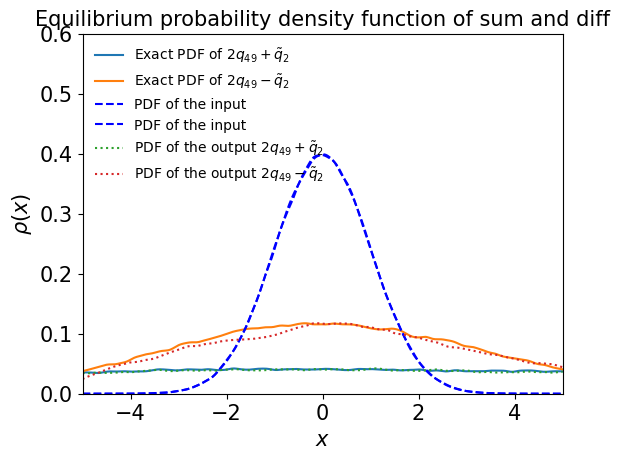

In [60]:
test3(model2)

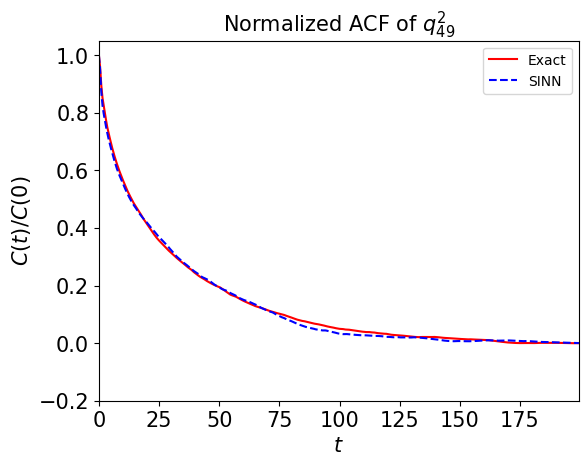

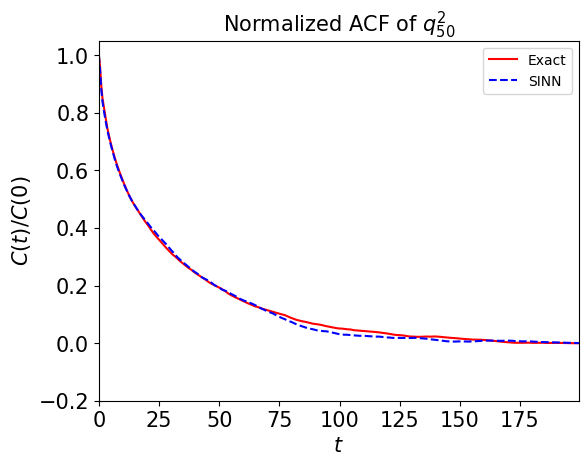

In [61]:
test4(model2)

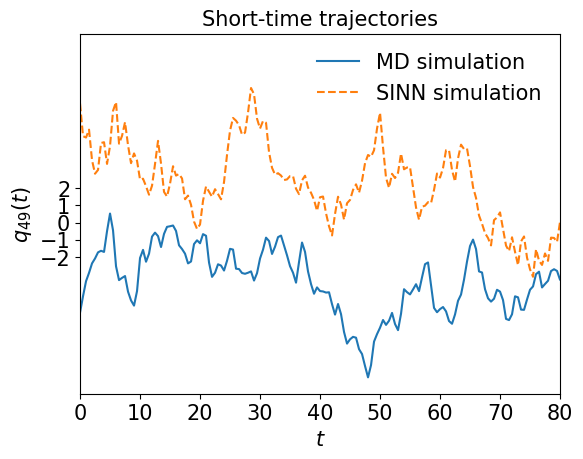

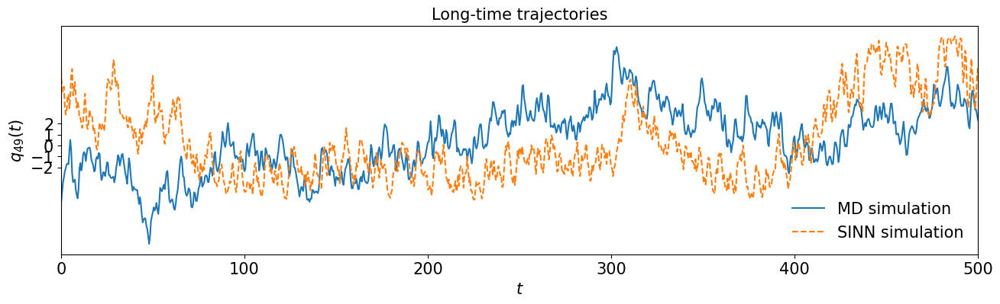

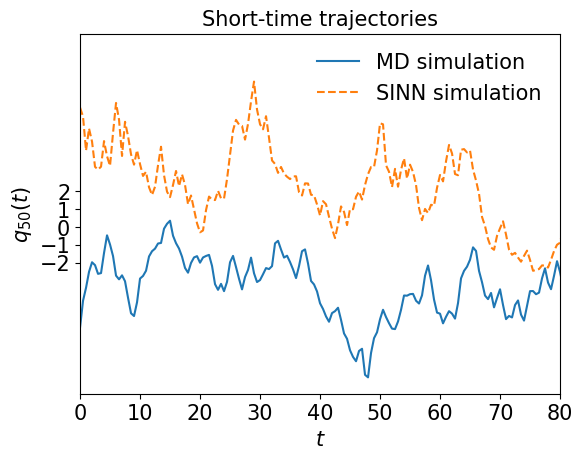

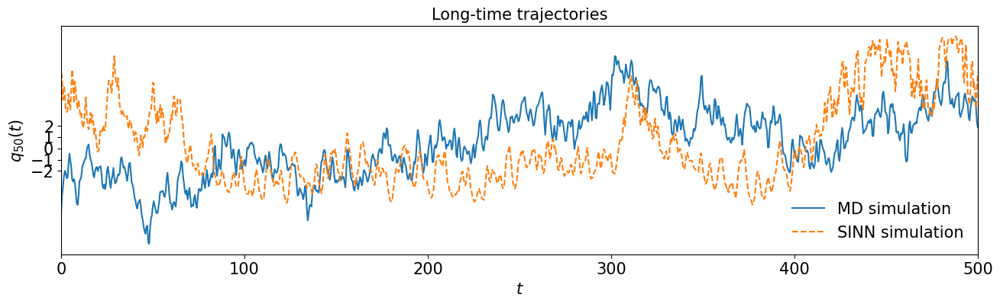

In [62]:
test5(model2)

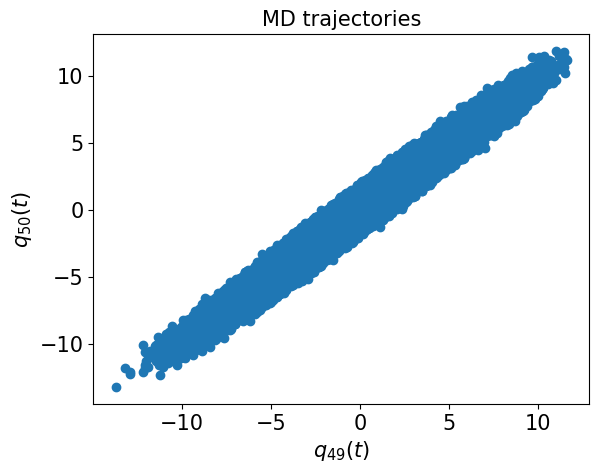

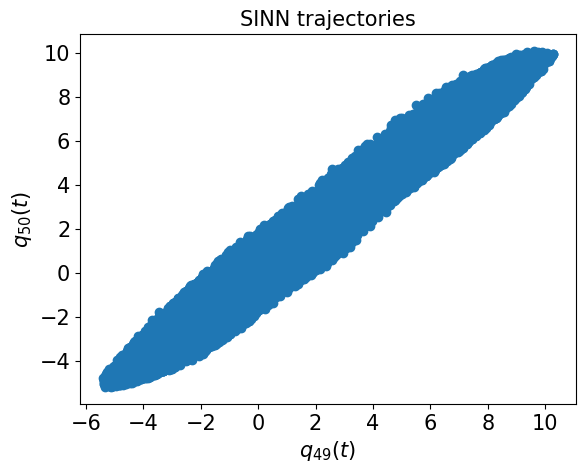

In [63]:
test6(model2)

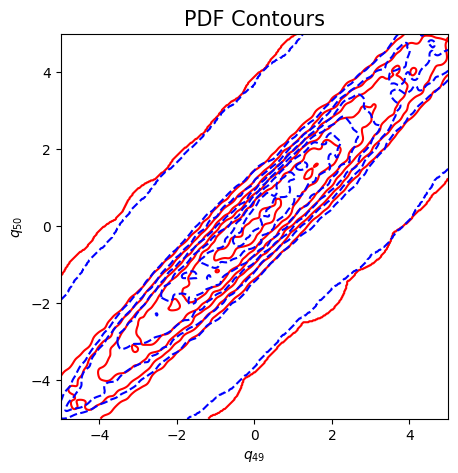

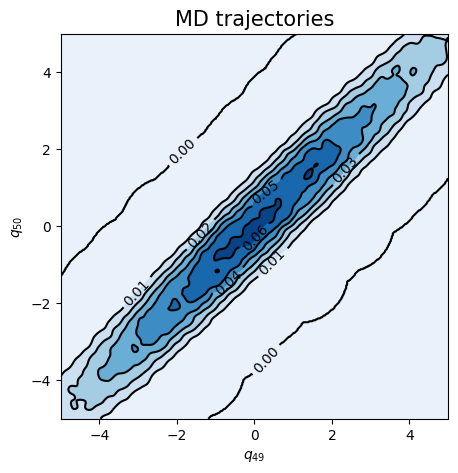

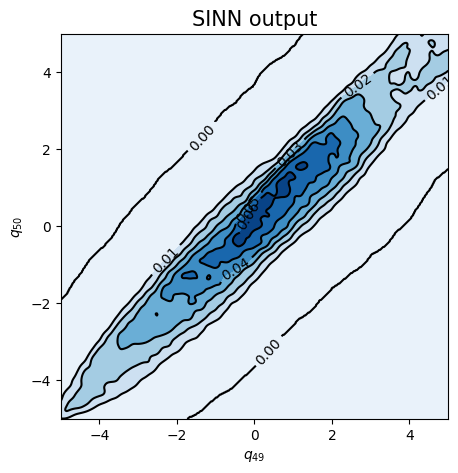

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8636, 0.8596, acf: 0.10210, ccf: 0.13281, pdf: 0.29232, pdf2: 0.28718, acf2: 0.04515
[50]-th step loss: 0.0929, 0.0849, acf: 0.01499, ccf: 0.01501, pdf: 0.03506, pdf2: 0.01771, acf2: 0.00216
[100]-th step loss: 0.0413, 0.0384, acf: 0.01003, ccf: 0.01048, pdf: 0.01009, pdf2: 0.00498, acf2: 0.00285
[150]-th step loss: 0.0179, 0.0238, acf: 0.00759, ccf: 0.00803, pdf: 0.00563, pdf2: 0.00217, acf2: 0.00038
[200]-th step loss: 0.0104, 0.0471, acf: 0.01776, ccf: 0.01835, pdf: 0.00415, pdf2: 0.00173, acf2: 0.00507
[250]-th step loss: 0.0308, 0.0245, acf: 0.00547, ccf: 0.00569, pdf: 0.00772, pdf2: 0.00223, acf2: 0.00338
[300]-th step loss: 0.0139, 0.0111, acf: 0.00385, ccf: 0.00392, pdf: 0.00184, pdf2: 0.00092, acf2: 0.00053
[350]-th step loss: 0.0040, 0.0038, acf: 0.00060, ccf: 0.00060, pdf: 0.00129, pdf2: 0.00046, acf2: 0.00090
[400]-th step loss: 0.2616, 0.1417, acf: 0.03959, ccf: 0.07353, pdf: 0.00949, pdf2: 0.01284, acf2: 0.00621
[450]-th step loss: 0.0438, 0.0319, acf:

[3850]-th step loss: 0.0233, 0.0344, acf: 0.01043, ccf: 0.01108, pdf: 0.00829, pdf2: 0.00417, acf2: 0.00048
[3900]-th step loss: 0.0370, 0.0347, acf: 0.01097, ccf: 0.01105, pdf: 0.00829, pdf2: 0.00381, acf2: 0.00057
[3950]-th step loss: 0.0281, 0.0286, acf: 0.00754, ccf: 0.00767, pdf: 0.00829, pdf2: 0.00381, acf2: 0.00133
[4000]-th step loss: 0.0321, 0.0275, acf: 0.00684, ccf: 0.00710, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00158
[4050]-th step loss: 0.0335, 0.0308, acf: 0.00870, ccf: 0.00918, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00082
[4100]-th step loss: 0.0312, 0.0319, acf: 0.00932, ccf: 0.00989, pdf: 0.00829, pdf2: 0.00374, acf2: 0.00068
[4150]-th step loss: 0.0498, 0.0390, acf: 0.01252, ccf: 0.01345, pdf: 0.00829, pdf2: 0.00459, acf2: 0.00015
[4200]-th step loss: 0.0407, 0.0322, acf: 0.00939, ccf: 0.00988, pdf: 0.00829, pdf2: 0.00398, acf2: 0.00065
[4250]-th step loss: 0.0479, 0.0352, acf: 0.01080, ccf: 0.01133, pdf: 0.00829, pdf2: 0.00440, acf2: 0.00036
[4300]-th step loss: 0.0403,

[7650]-th step loss: 0.0354, 0.0455, acf: 0.01646, ccf: 0.01691, pdf: 0.00829, pdf2: 0.00367, acf2: 0.00018
[7700]-th step loss: 0.0442, 0.0457, acf: 0.01640, ccf: 0.01676, pdf: 0.00829, pdf2: 0.00411, acf2: 0.00015
[7750]-th step loss: 0.0503, 0.0445, acf: 0.01598, ccf: 0.01644, pdf: 0.00829, pdf2: 0.00363, acf2: 0.00015
[7800]-th step loss: 0.0383, 0.0517, acf: 0.01931, ccf: 0.01979, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00050
[7850]-th step loss: 0.0391, 0.0471, acf: 0.01721, ccf: 0.01747, pdf: 0.00829, pdf2: 0.00388, acf2: 0.00021
[7900]-th step loss: 0.0383, 0.0446, acf: 0.01569, ccf: 0.01626, pdf: 0.00829, pdf2: 0.00429, acf2: 0.00012
[7950]-th step loss: 0.0383, 0.0439, acf: 0.01569, ccf: 0.01596, pdf: 0.00829, pdf2: 0.00367, acf2: 0.00026
[8000]-th step loss: 0.0427, 0.0531, acf: 0.02013, ccf: 0.02037, pdf: 0.00829, pdf2: 0.00364, acf2: 0.00066
[8050]-th step loss: 0.0319, 0.0493, acf: 0.01832, ccf: 0.01857, pdf: 0.00828, pdf2: 0.00367, acf2: 0.00043
[8100]-th step loss: 0.0392,

[11450]-th step loss: 0.0176, 0.0193, acf: 0.00011, ccf: 0.00011, pdf: 0.00843, pdf2: 0.00405, acf2: 0.00658
[11500]-th step loss: 0.0211, 0.0188, acf: 0.00009, ccf: 0.00009, pdf: 0.00826, pdf2: 0.00369, acf2: 0.00666
[11550]-th step loss: 0.0224, 0.0195, acf: 0.00004, ccf: 0.00005, pdf: 0.00830, pdf2: 0.00395, acf2: 0.00718
[11600]-th step loss: 0.0173, 0.0184, acf: 0.00002, ccf: 0.00002, pdf: 0.00826, pdf2: 0.00394, acf2: 0.00613
[11650]-th step loss: 0.0192, 0.0199, acf: 0.00009, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00391, acf2: 0.00747
[11700]-th step loss: 0.0186, 0.0194, acf: 0.00007, ccf: 0.00007, pdf: 0.00831, pdf2: 0.00369, acf2: 0.00723
[11750]-th step loss: 0.0179, 0.0179, acf: 0.00005, ccf: 0.00006, pdf: 0.00826, pdf2: 0.00378, acf2: 0.00578
[11800]-th step loss: 0.0178, 0.0178, acf: 0.00006, ccf: 0.00005, pdf: 0.00825, pdf2: 0.00410, acf2: 0.00538
[11850]-th step loss: 0.0169, 0.0177, acf: 0.00003, ccf: 0.00003, pdf: 0.00828, pdf2: 0.00370, acf2: 0.00565
[11900]-th step los

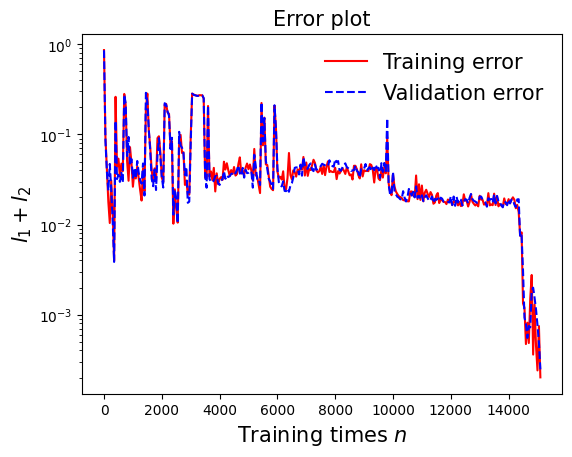

In [66]:
draw_loss(model3)

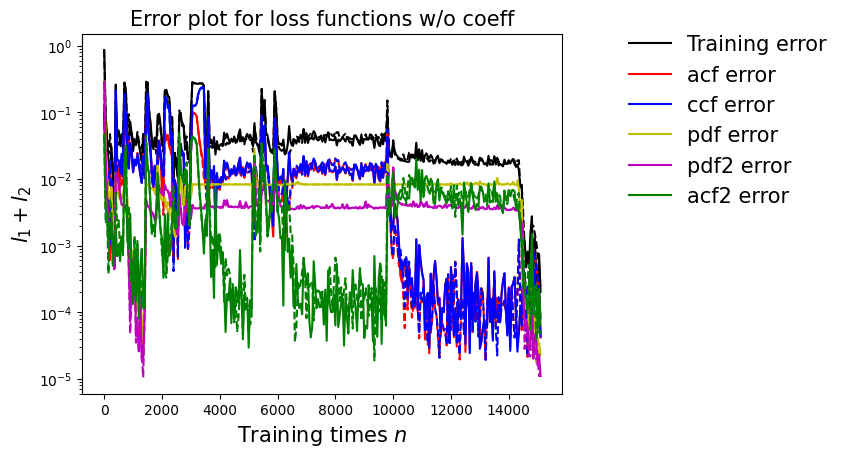

In [67]:
draw_errors(model3)

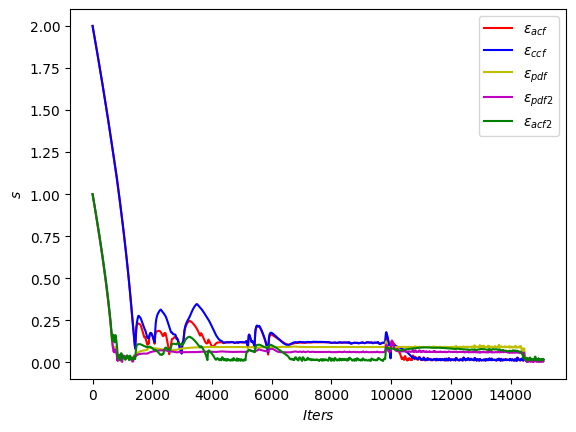

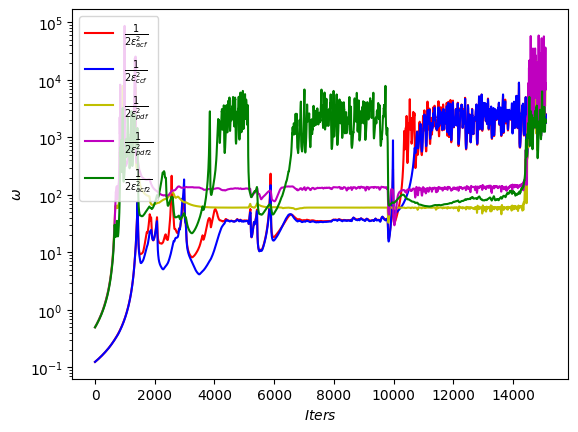

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

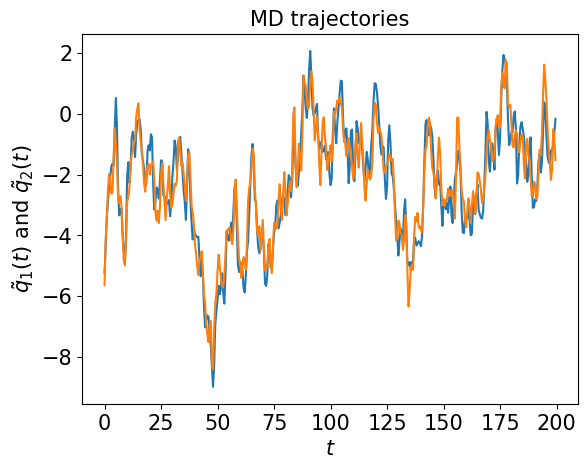

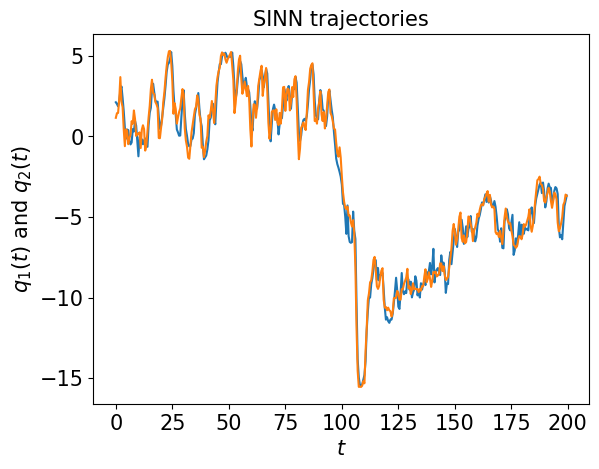

In [69]:
test1(model3)

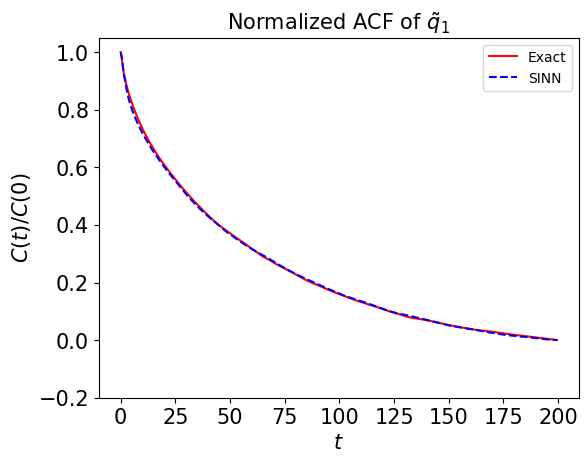

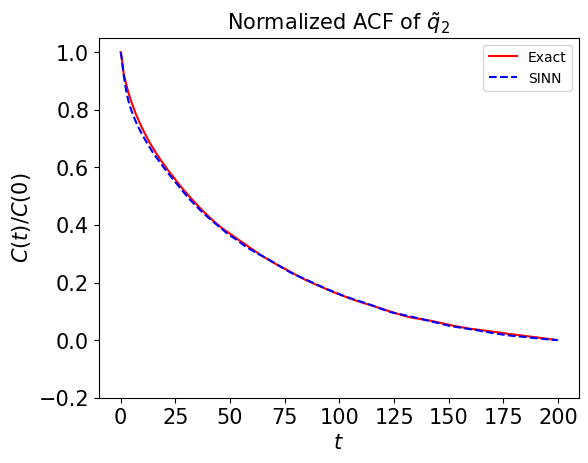

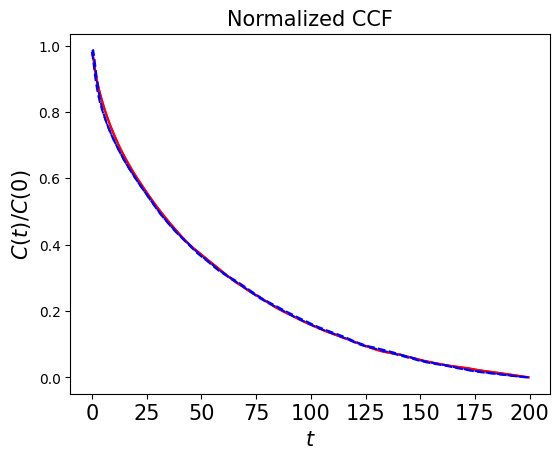

In [70]:
test2(model3)

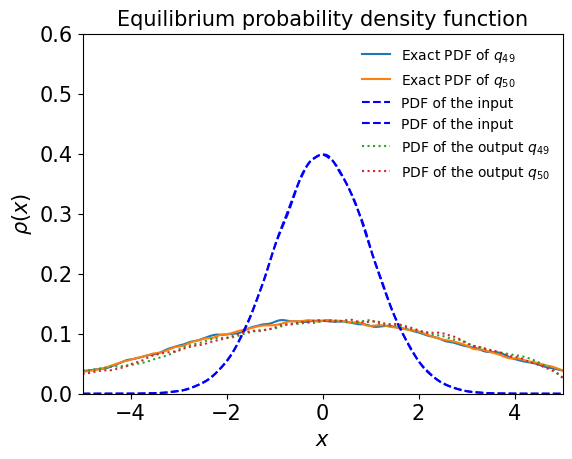

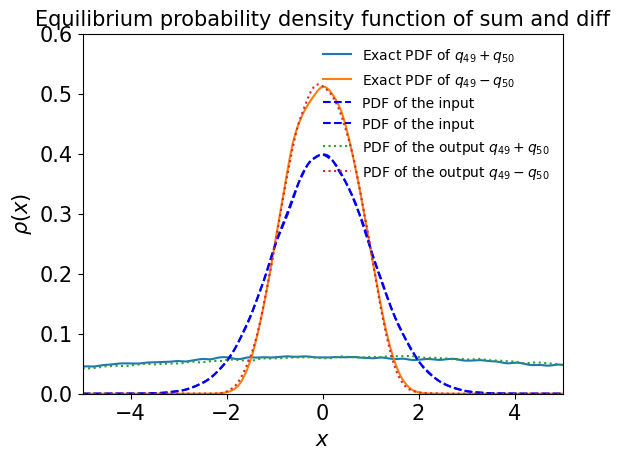

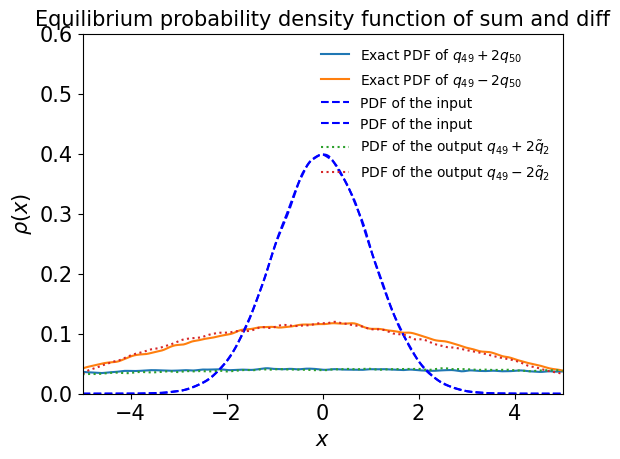

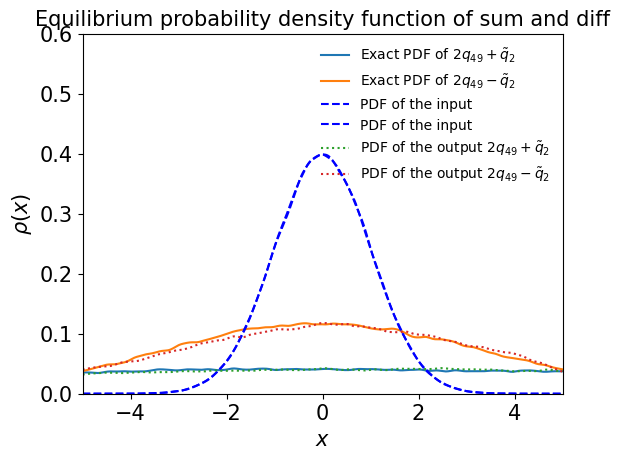

In [71]:
test3(model3)

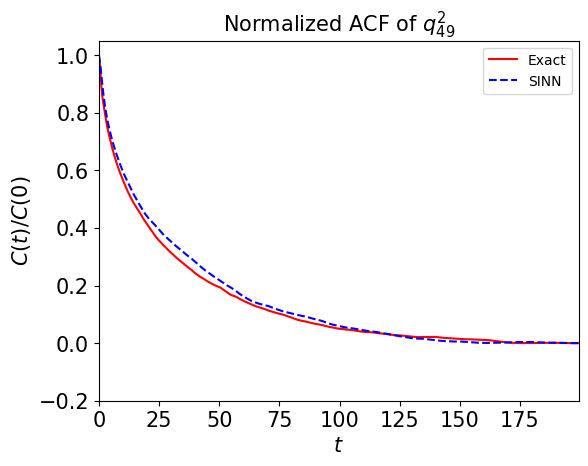

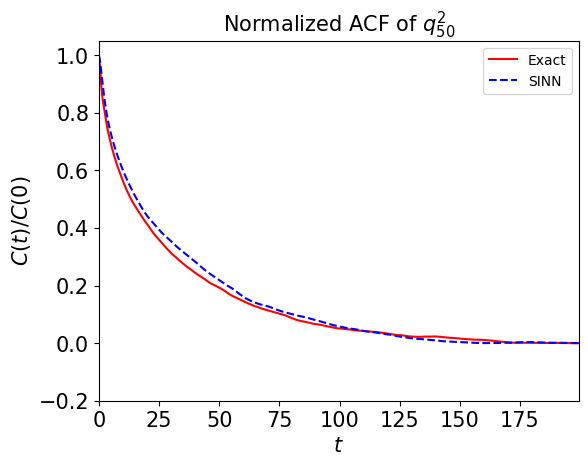

In [72]:
test4(model3)

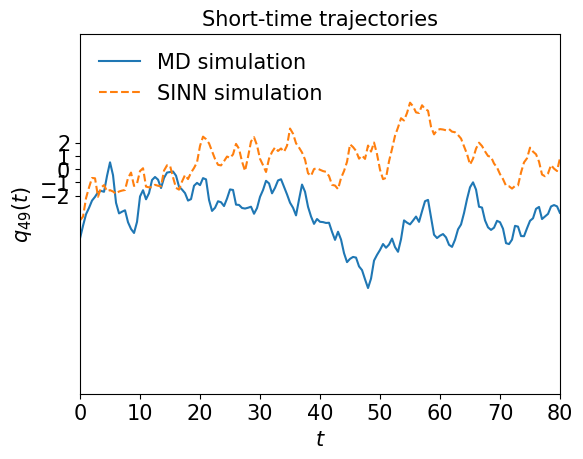

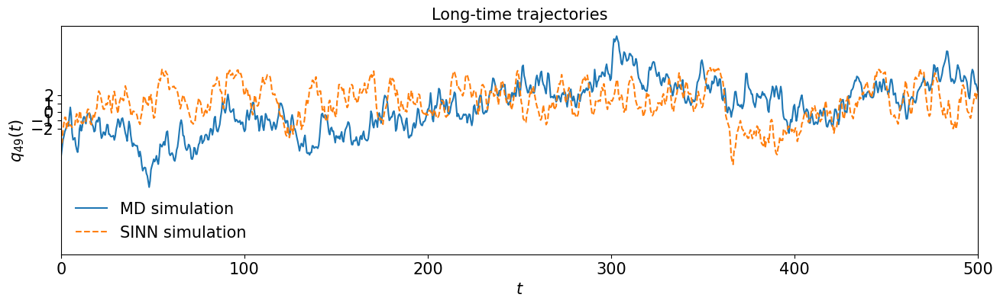

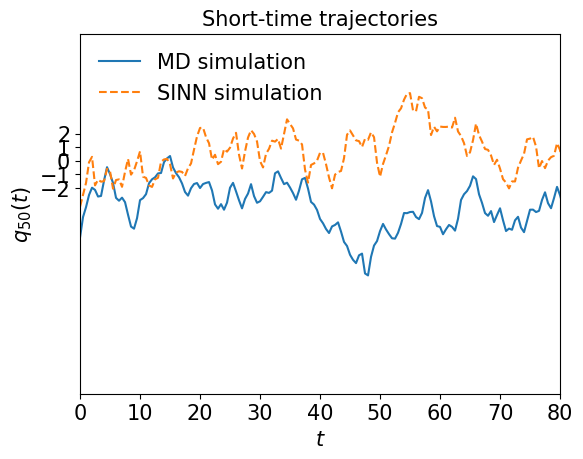

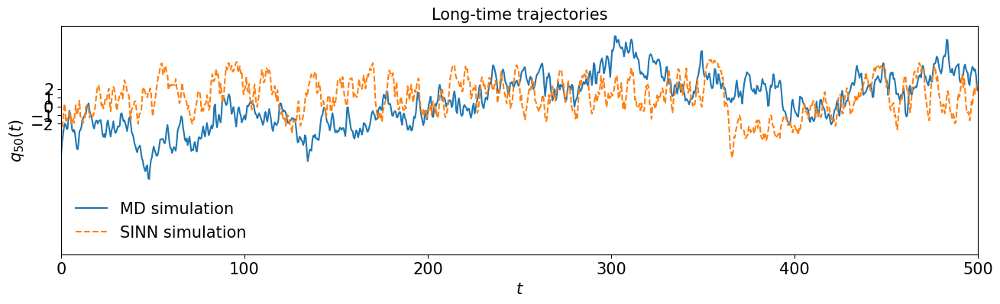

In [73]:
test5(model3)

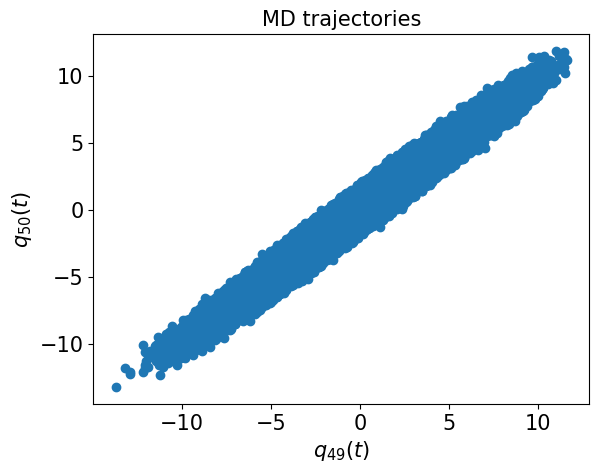

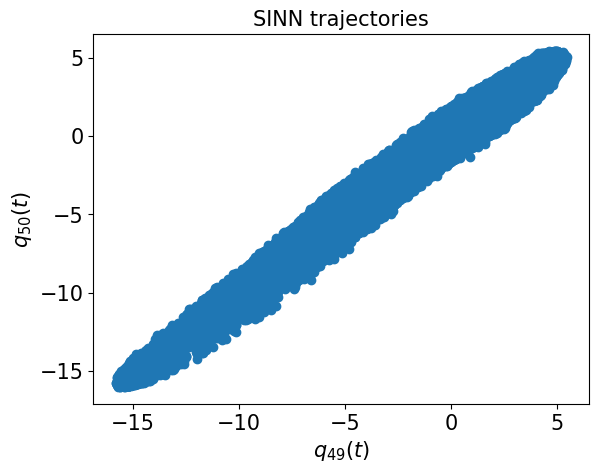

In [74]:
test6(model3)

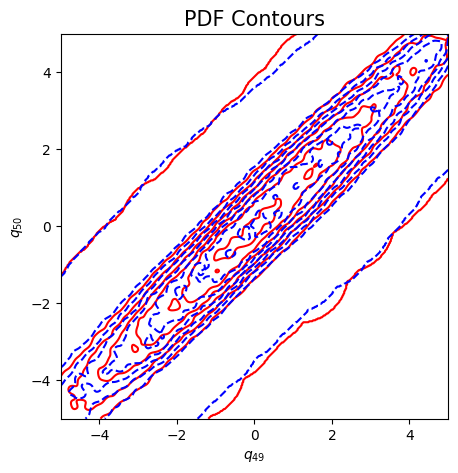

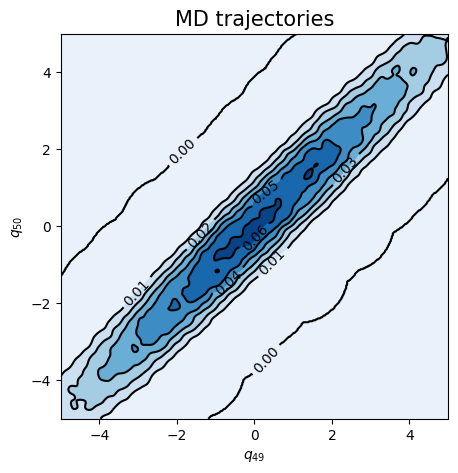

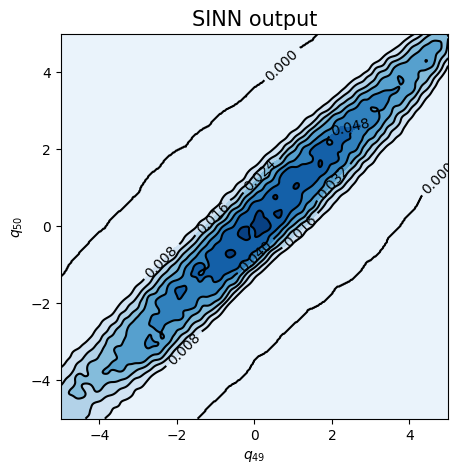

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8493, 0.8316, acf: 0.10097, ccf: 0.10442, pdf: 0.29297, pdf2: 0.28899, acf2: 0.04424
[50]-th step loss: 0.1262, 0.1370, acf: 0.03489, ccf: 0.03482, pdf: 0.03135, pdf2: 0.02666, acf2: 0.00930
[100]-th step loss: 0.0208, 0.0228, acf: 0.00410, ccf: 0.00409, pdf: 0.00679, pdf2: 0.00587, acf2: 0.00199
[150]-th step loss: 0.0320, 0.0275, acf: 0.00835, ccf: 0.00833, pdf: 0.00512, pdf2: 0.00421, acf2: 0.00144
[200]-th step loss: 0.0076, 0.0095, acf: 0.00206, ccf: 0.00206, pdf: 0.00246, pdf2: 0.00242, acf2: 0.00049
[250]-th step loss: 0.0053, 0.0081, acf: 0.00177, ccf: 0.00176, pdf: 0.00157, pdf2: 0.00179, acf2: 0.00117
[300]-th step loss: 0.0050, 0.0046, acf: 0.00032, ccf: 0.00033, pdf: 0.00117, pdf2: 0.00130, acf2: 0.00153
[350]-th step loss: 0.0059, 0.0041, acf: 0.00100, ccf: 0.00100, pdf: 0.00066, pdf2: 0.00094, acf2: 0.00044
[400]-th step loss: 0.0065, 0.0030, acf: 0.00073, ccf: 0.00073, pdf: 0.00039, pdf2: 0.00064, acf2: 0.00052
[450]-th step loss: 0.0032, 0.0027, acf:

[3850]-th step loss: 0.0072, 0.0063, acf: 0.00131, ccf: 0.00140, pdf: 0.00079, pdf2: 0.00030, acf2: 0.00246
[3900]-th step loss: 0.0061, 0.0047, acf: 0.00080, ccf: 0.00093, pdf: 0.00086, pdf2: 0.00035, acf2: 0.00179
[3950]-th step loss: 0.0049, 0.0036, acf: 0.00055, ccf: 0.00065, pdf: 0.00079, pdf2: 0.00029, acf2: 0.00137
[4000]-th step loss: 0.0054, 0.0038, acf: 0.00055, ccf: 0.00062, pdf: 0.00094, pdf2: 0.00032, acf2: 0.00131
[4050]-th step loss: 0.0048, 0.0034, acf: 0.00057, ccf: 0.00062, pdf: 0.00079, pdf2: 0.00028, acf2: 0.00112
[4100]-th step loss: 0.0065, 0.0045, acf: 0.00043, ccf: 0.00046, pdf: 0.00100, pdf2: 0.00046, acf2: 0.00216
[4150]-th step loss: 0.0122, 0.0146, acf: 0.00192, ccf: 0.00192, pdf: 0.00247, pdf2: 0.00108, acf2: 0.00717
[4200]-th step loss: 0.0160, 0.0071, acf: 0.00074, ccf: 0.00064, pdf: 0.00124, pdf2: 0.00063, acf2: 0.00386
[4250]-th step loss: 0.0031, 0.0039, acf: 0.00045, ccf: 0.00045, pdf: 0.00054, pdf2: 0.00033, acf2: 0.00213
[4300]-th step loss: 0.0022,

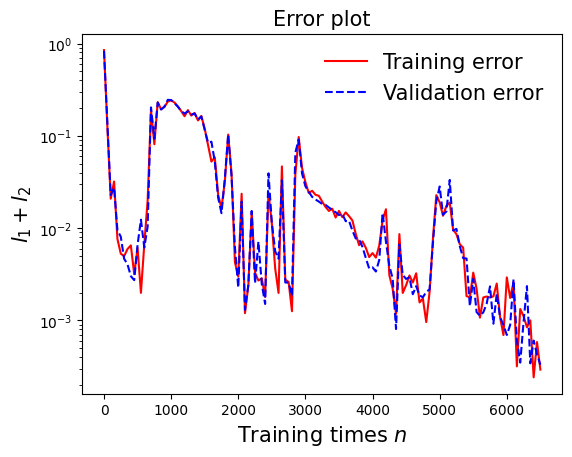

In [77]:
draw_loss(model4)

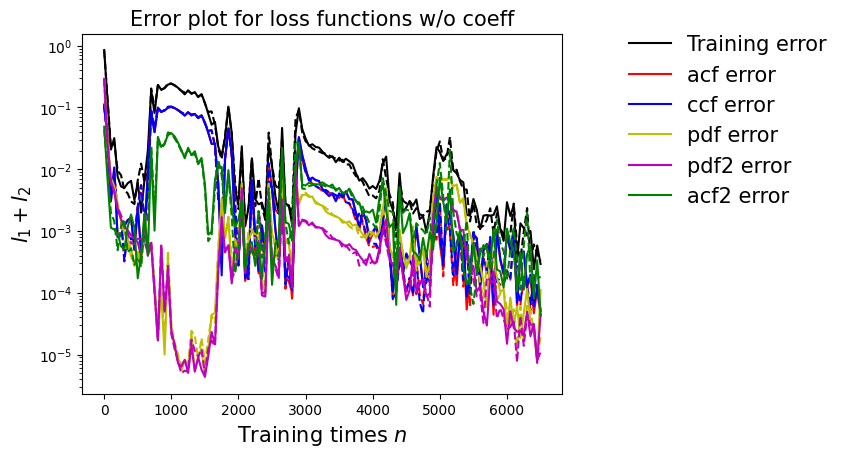

In [78]:
draw_errors(model4)

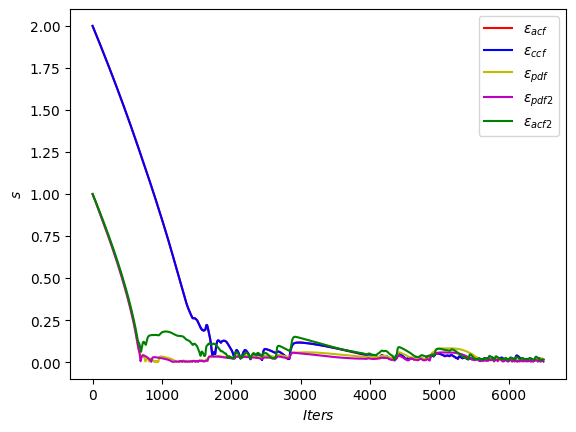

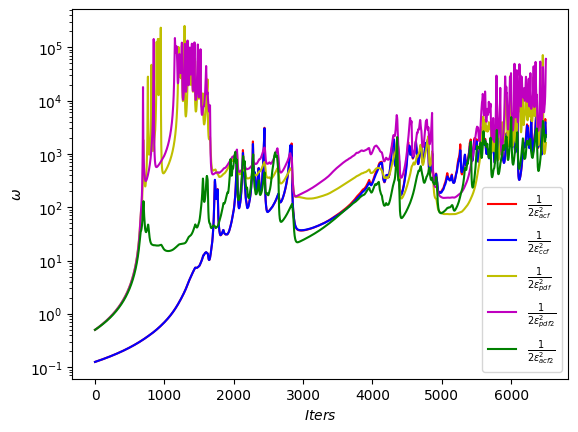

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

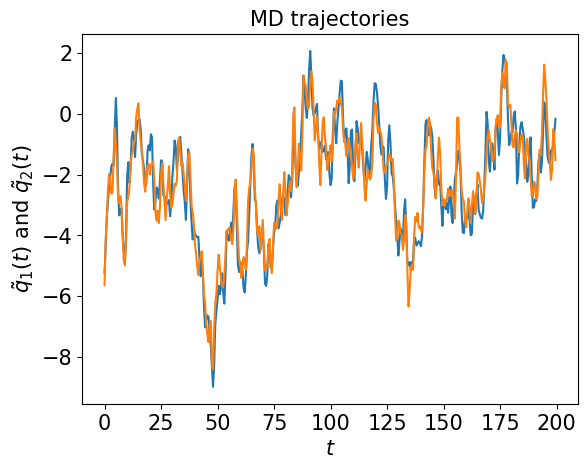

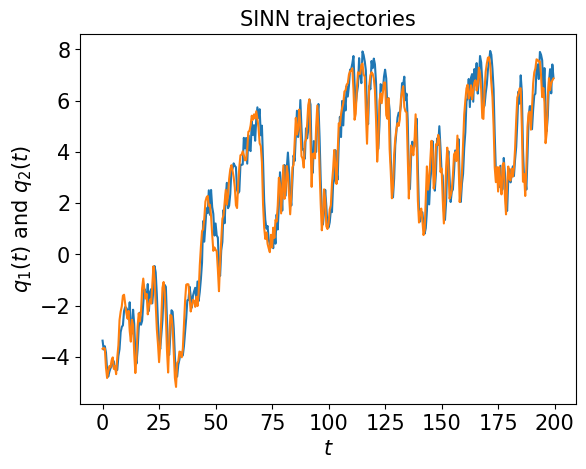

In [80]:
test1(model4)

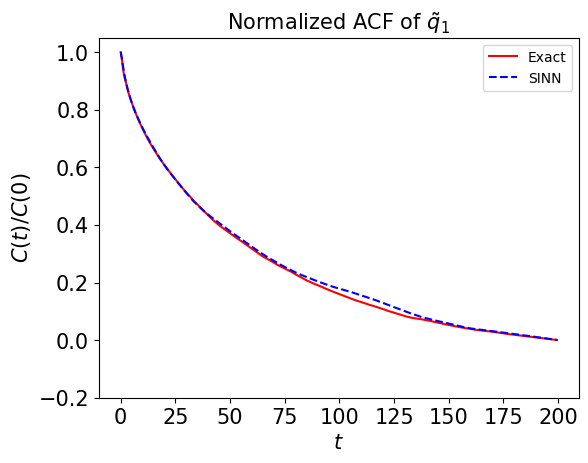

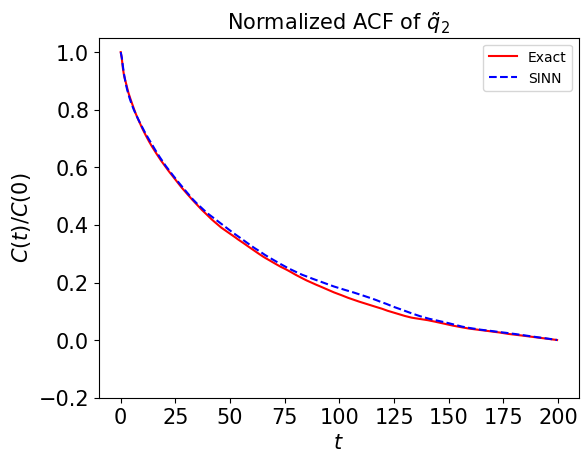

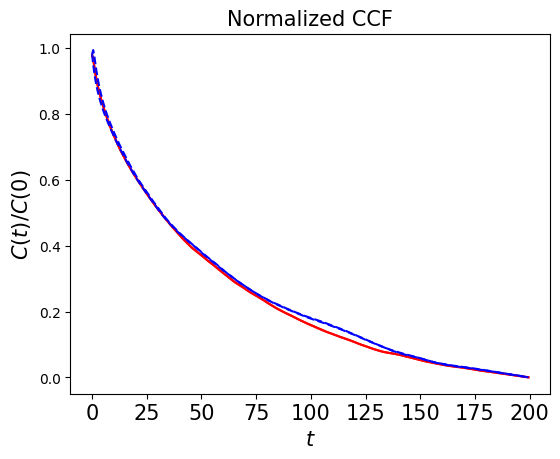

In [81]:
test2(model4)

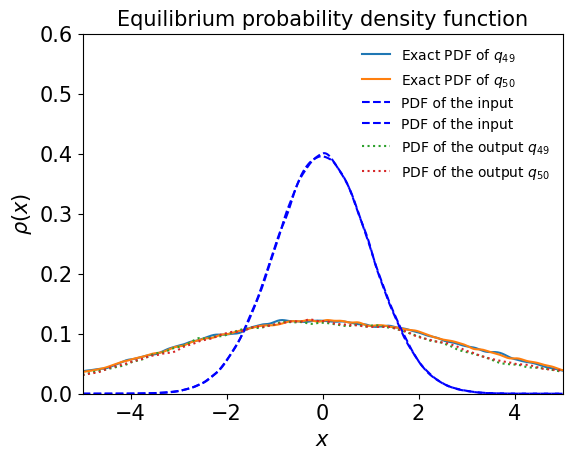

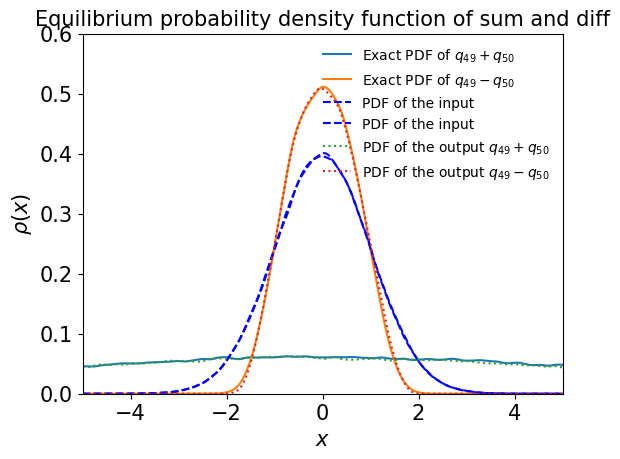

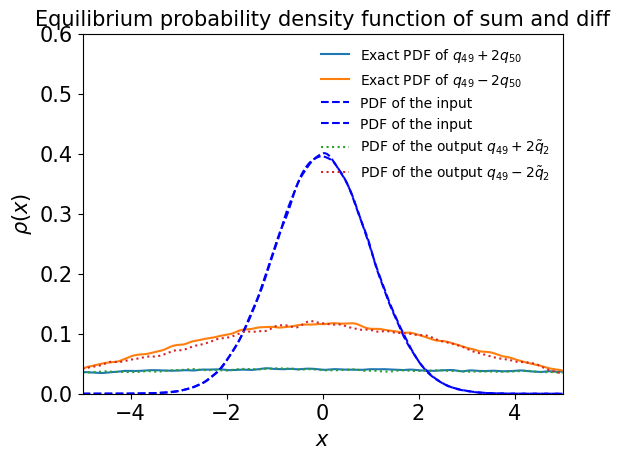

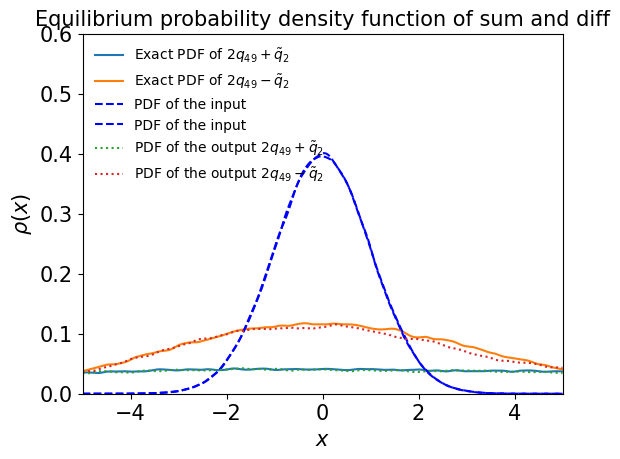

In [82]:
test3(model4)

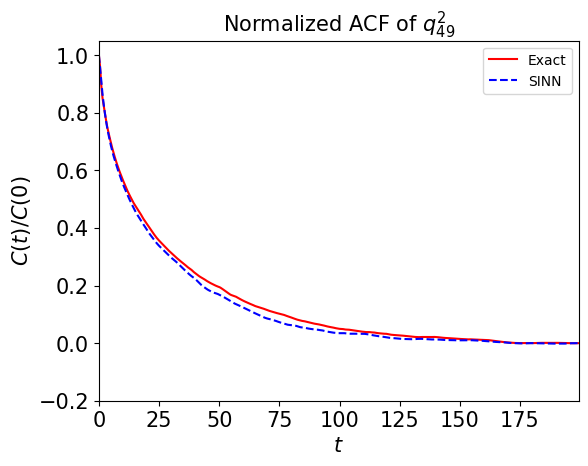

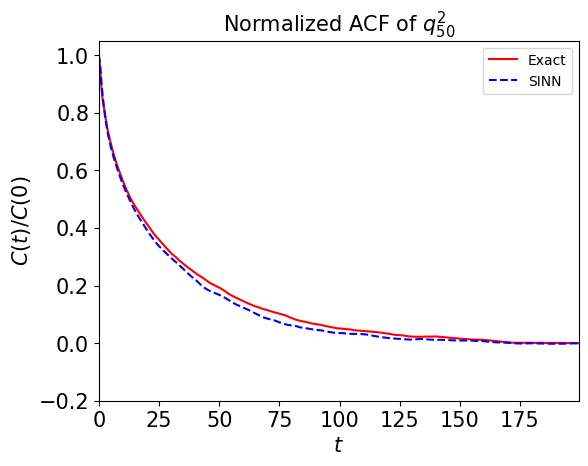

In [83]:
test4(model4)

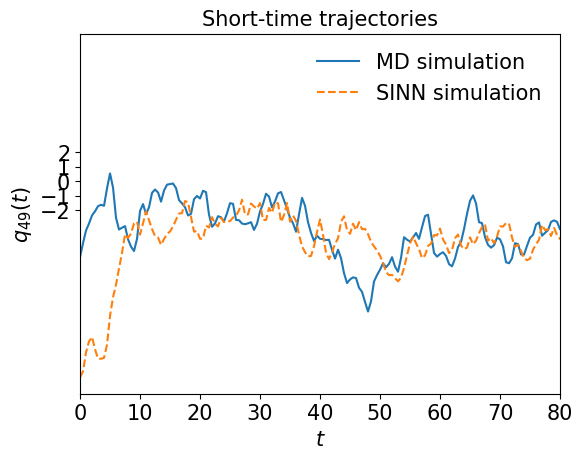

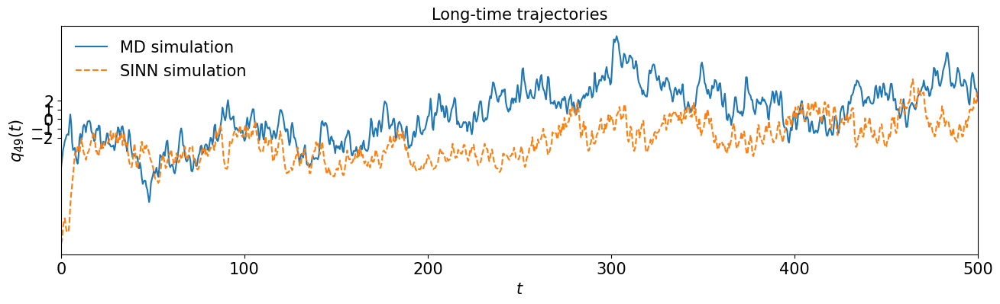

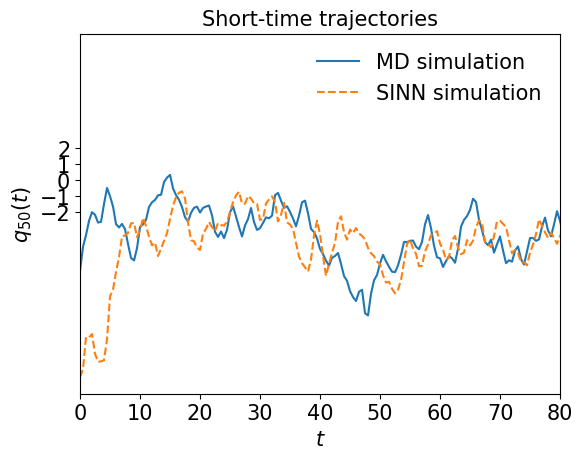

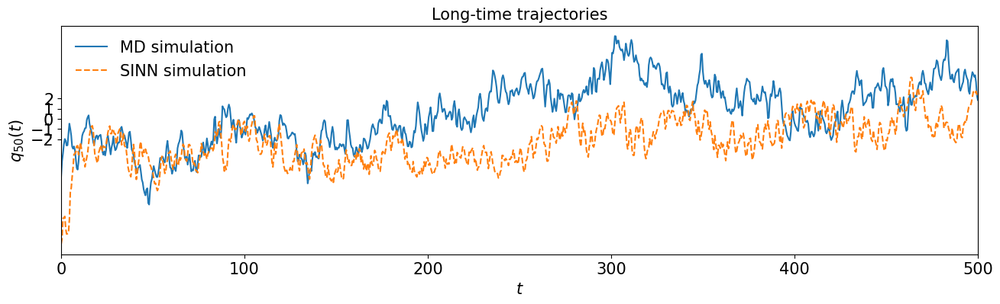

In [84]:
test5(model4)

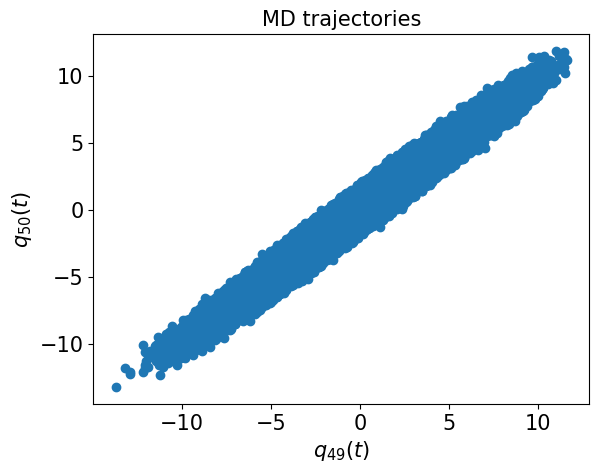

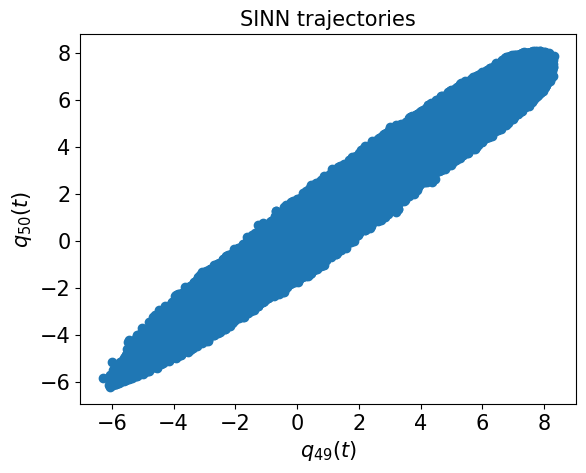

In [85]:
test6(model4)

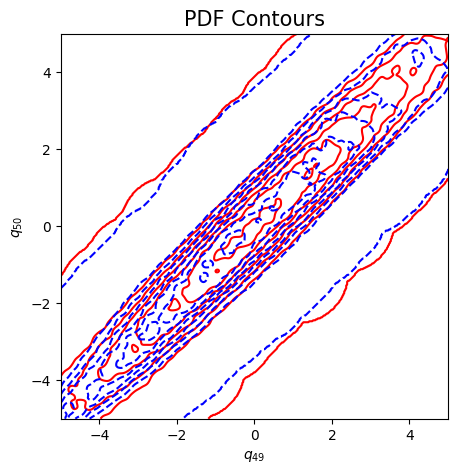

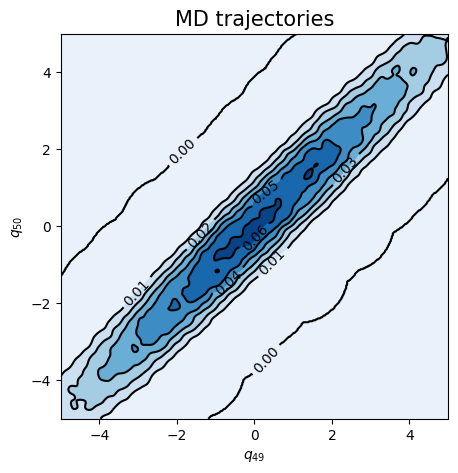

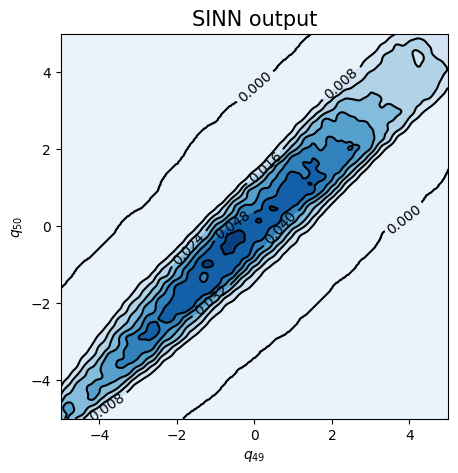

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8585, 0.8478, acf: 0.10196, ccf: 0.12033, pdf: 0.29251, pdf2: 0.28797, acf2: 0.04504
[50]-th step loss: 0.0627, 0.0535, acf: 0.00203, ccf: 0.00200, pdf: 0.03268, pdf2: 0.01608, acf2: 0.00075
[100]-th step loss: 0.0160, 0.0196, acf: 0.00274, ccf: 0.00361, pdf: 0.00609, pdf2: 0.00533, acf2: 0.00187
[150]-th step loss: 0.0054, 0.0055, acf: 0.00027, ccf: 0.00017, pdf: 0.00299, pdf2: 0.00117, acf2: 0.00090
[200]-th step loss: 0.0400, 0.0601, acf: 0.02057, ccf: 0.02053, pdf: 0.00839, pdf2: 0.00785, acf2: 0.00277
[250]-th step loss: 0.0385, 0.0382, acf: 0.01445, ccf: 0.01440, pdf: 0.00375, pdf2: 0.00303, acf2: 0.00261
[300]-th step loss: 0.0097, 0.0121, acf: 0.00357, ccf: 0.00353, pdf: 0.00196, pdf2: 0.00185, acf2: 0.00117
[350]-th step loss: 0.0069, 0.0096, acf: 0.00305, ccf: 0.00303, pdf: 0.00132, pdf2: 0.00157, acf2: 0.00064
[400]-th step loss: 0.0208, 0.0197, acf: 0.00159, ccf: 0.00094, pdf: 0.00765, pdf2: 0.00607, acf2: 0.00346
[450]-th step loss: 0.0247, 0.0494, acf:

[3850]-th step loss: 0.0323, 0.0321, acf: 0.00961, ccf: 0.00972, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00067
[3900]-th step loss: 0.0297, 0.0320, acf: 0.00935, ccf: 0.00952, pdf: 0.00829, pdf2: 0.00403, acf2: 0.00082
[3950]-th step loss: 0.0376, 0.0395, acf: 0.01371, ccf: 0.01367, pdf: 0.00829, pdf2: 0.00368, acf2: 0.00018
[4000]-th step loss: 0.0393, 0.0356, acf: 0.01101, ccf: 0.01098, pdf: 0.00829, pdf2: 0.00483, acf2: 0.00046
[4050]-th step loss: 0.0498, 0.0342, acf: 0.01090, ccf: 0.01094, pdf: 0.00829, pdf2: 0.00368, acf2: 0.00034
[4100]-th step loss: 0.0326, 0.0347, acf: 0.01106, ccf: 0.01110, pdf: 0.00829, pdf2: 0.00392, acf2: 0.00033
[4150]-th step loss: 0.0326, 0.0412, acf: 0.01408, ccf: 0.01410, pdf: 0.00829, pdf2: 0.00457, acf2: 0.00020
[4200]-th step loss: 0.0346, 0.0381, acf: 0.01266, ccf: 0.01274, pdf: 0.00829, pdf2: 0.00428, acf2: 0.00013
[4250]-th step loss: 0.0291, 0.0315, acf: 0.00921, ccf: 0.00941, pdf: 0.00829, pdf2: 0.00392, acf2: 0.00072
[4300]-th step loss: 0.0386,

[7650]-th step loss: 0.0346, 0.0403, acf: 0.01306, ccf: 0.01309, pdf: 0.00847, pdf2: 0.00564, acf2: 0.00008
[7700]-th step loss: 0.0352, 0.0303, acf: 0.00901, ccf: 0.00897, pdf: 0.00828, pdf2: 0.00379, acf2: 0.00024
[7750]-th step loss: 0.0357, 0.0334, acf: 0.01070, ccf: 0.01066, pdf: 0.00828, pdf2: 0.00368, acf2: 0.00009
[7800]-th step loss: 0.0327, 0.0297, acf: 0.00875, ccf: 0.00871, pdf: 0.00828, pdf2: 0.00367, acf2: 0.00026
[7850]-th step loss: 0.0388, 0.0342, acf: 0.01111, ccf: 0.01106, pdf: 0.00831, pdf2: 0.00369, acf2: 0.00007
[7900]-th step loss: 0.0331, 0.0318, acf: 0.00989, ccf: 0.00984, pdf: 0.00829, pdf2: 0.00367, acf2: 0.00012
[7950]-th step loss: 0.0330, 0.0319, acf: 0.00992, ccf: 0.00988, pdf: 0.00828, pdf2: 0.00372, acf2: 0.00011
[8000]-th step loss: 0.0292, 0.0255, acf: 0.00642, ccf: 0.00640, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00064
[8050]-th step loss: 0.0311, 0.0325, acf: 0.01007, ccf: 0.01004, pdf: 0.00827, pdf2: 0.00406, acf2: 0.00009
[8100]-th step loss: 0.0373,

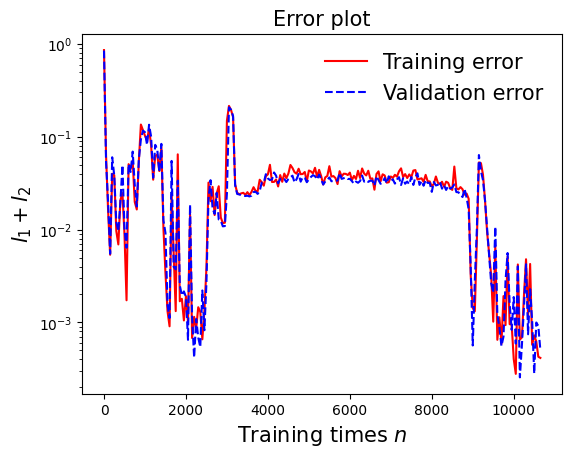

In [88]:
draw_loss(model5)

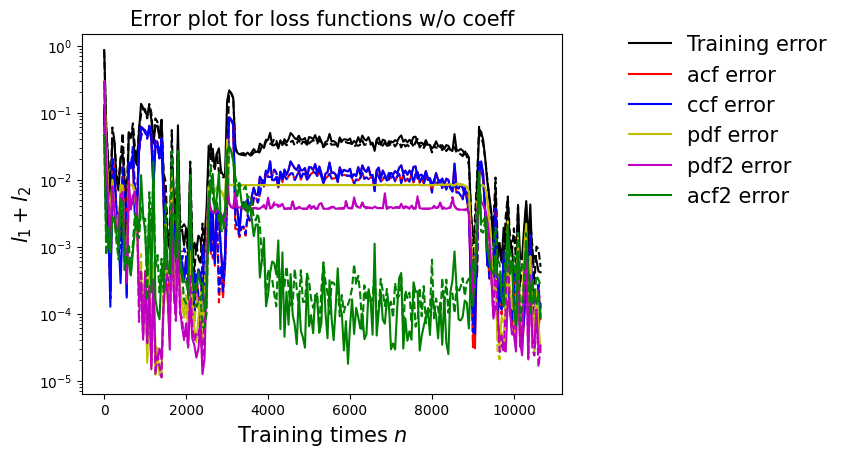

In [89]:
draw_errors(model5)

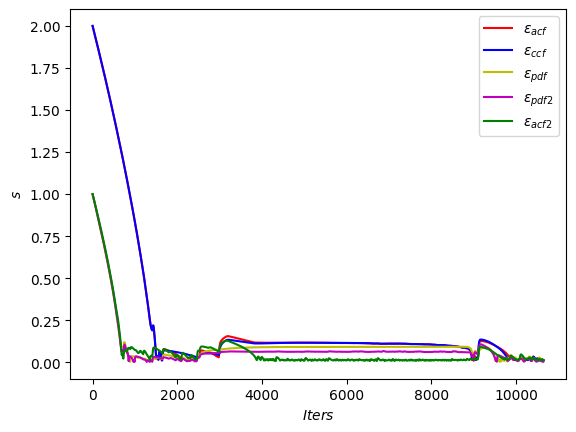

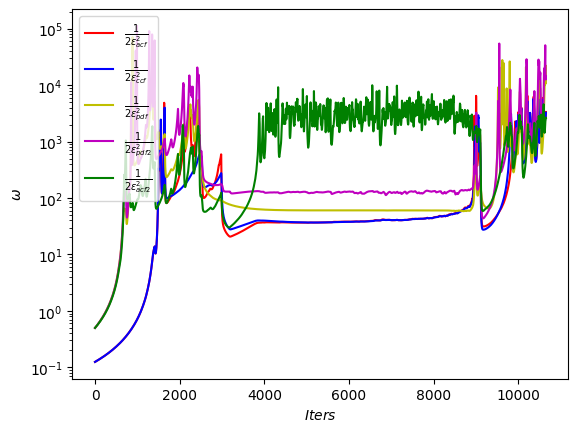

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

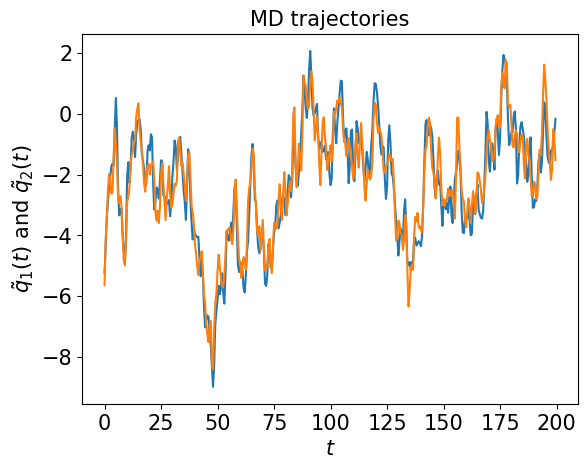

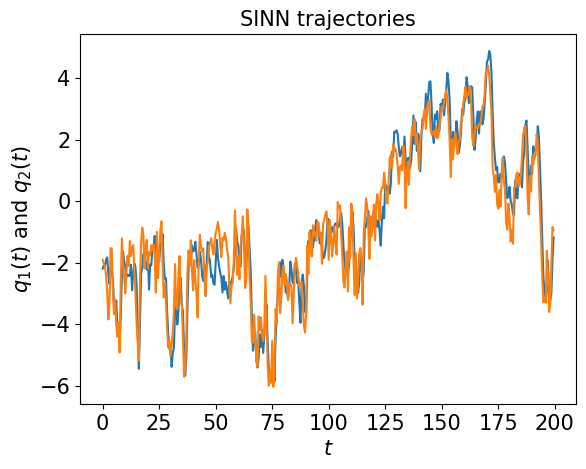

In [91]:
test1(model5)

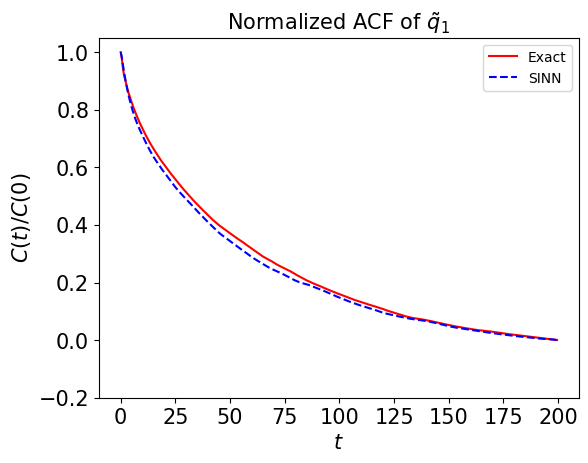

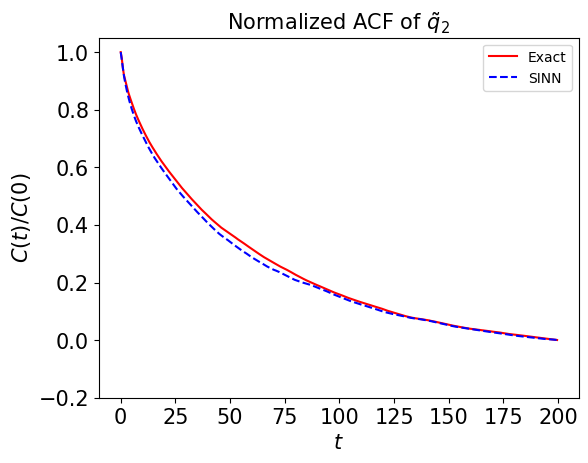

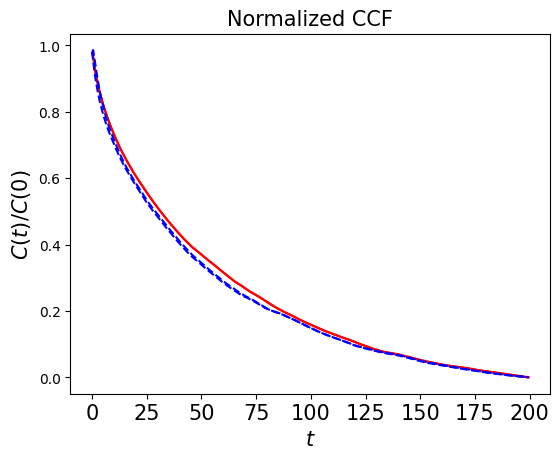

In [92]:
test2(model5)

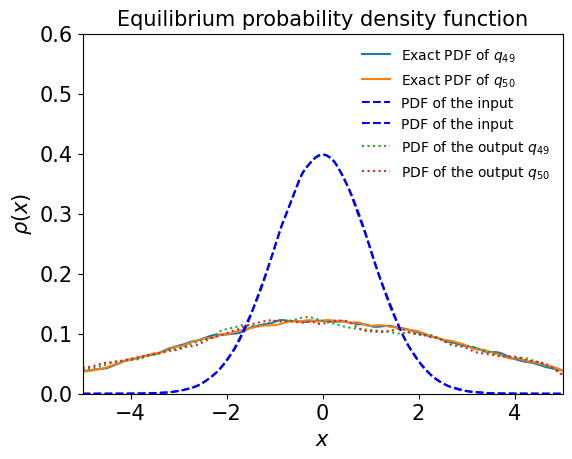

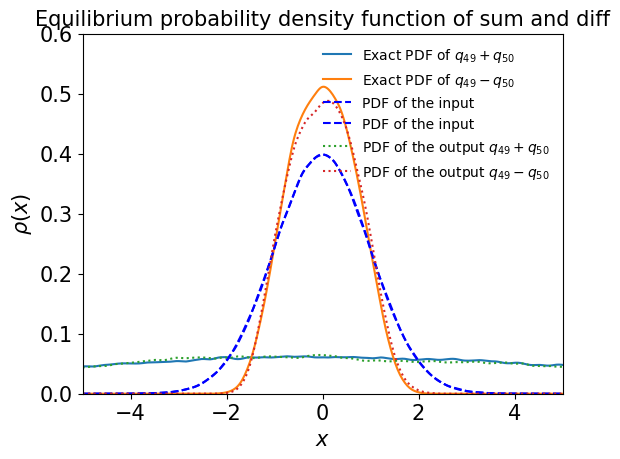

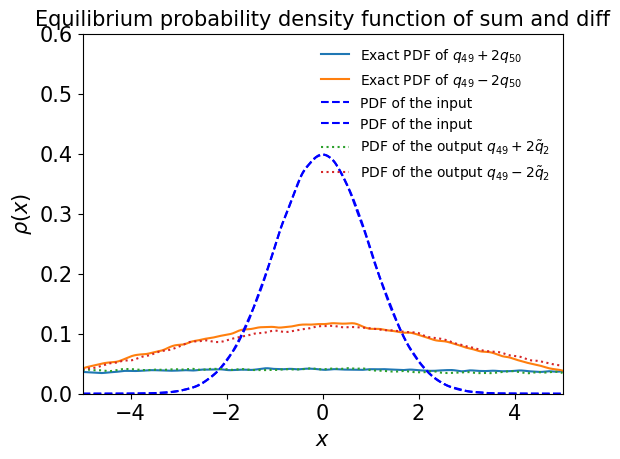

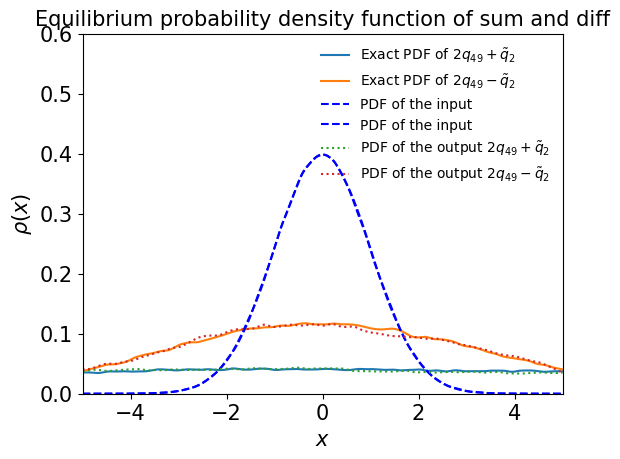

In [93]:
test3(model5)

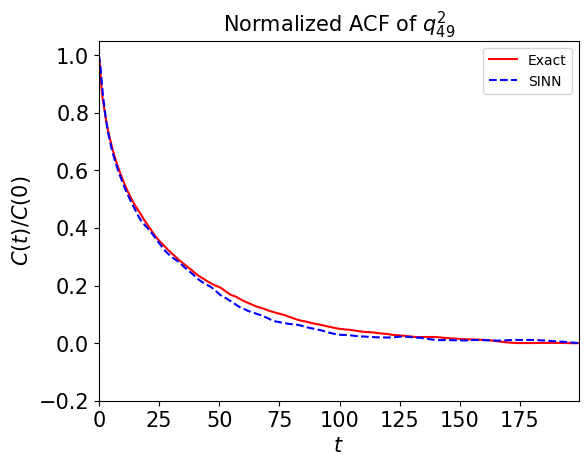

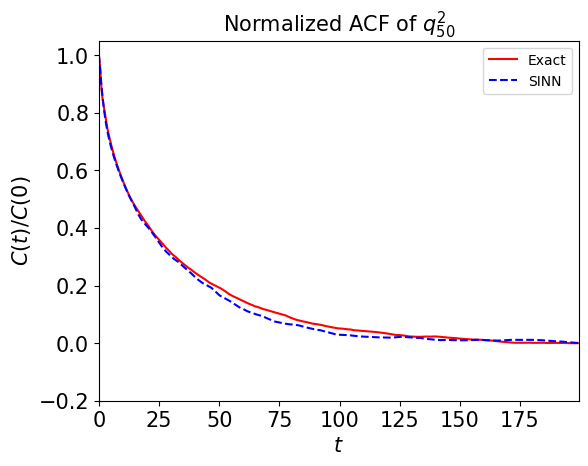

In [94]:
test4(model5)

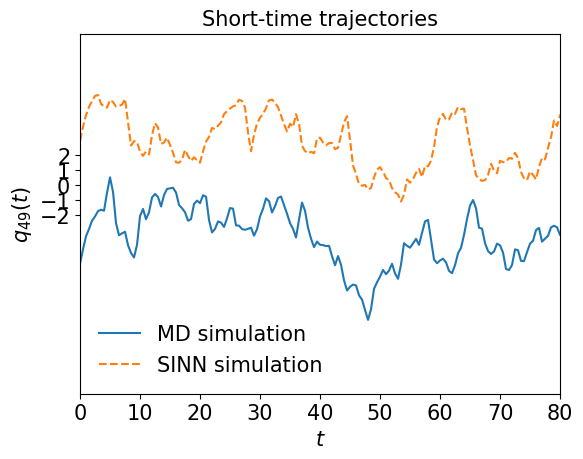

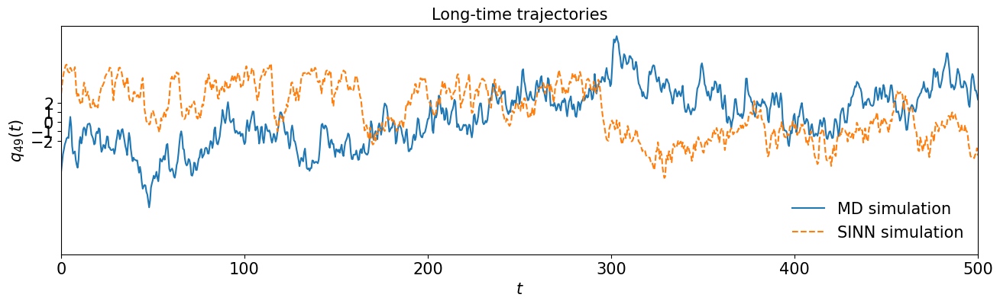

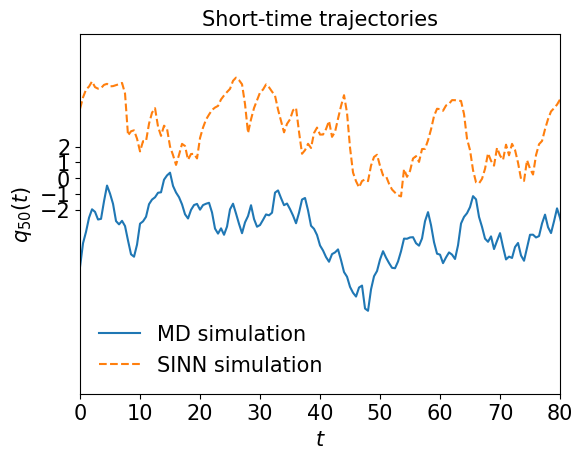

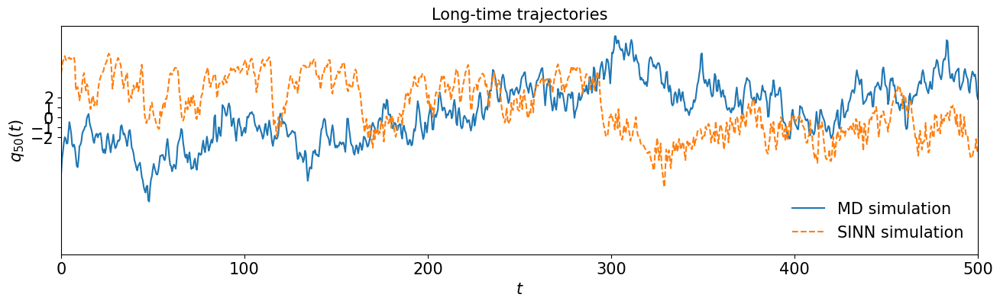

In [95]:
test5(model5)

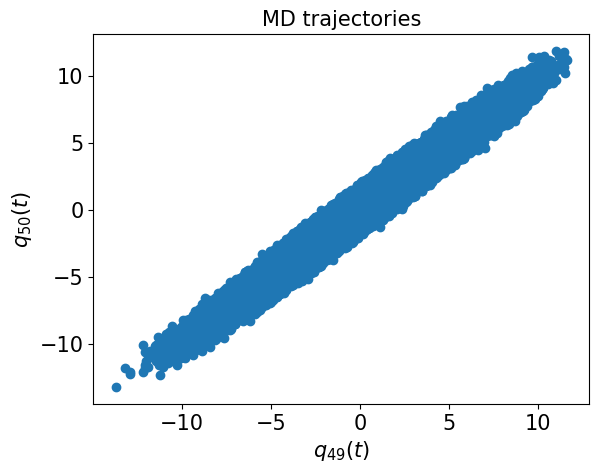

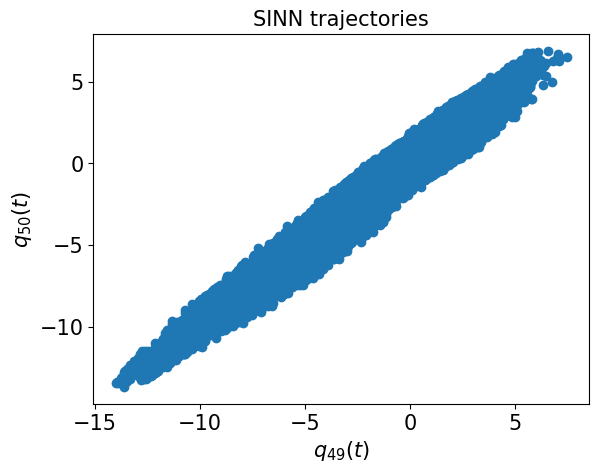

In [96]:
test6(model5)

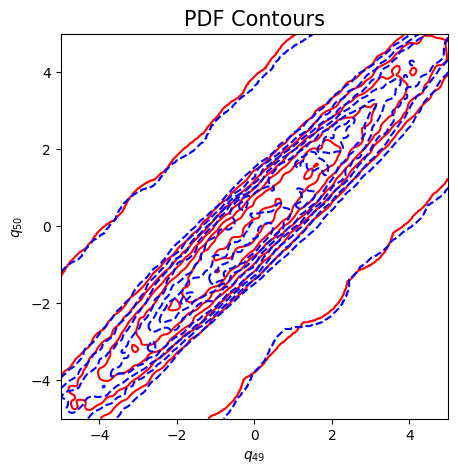

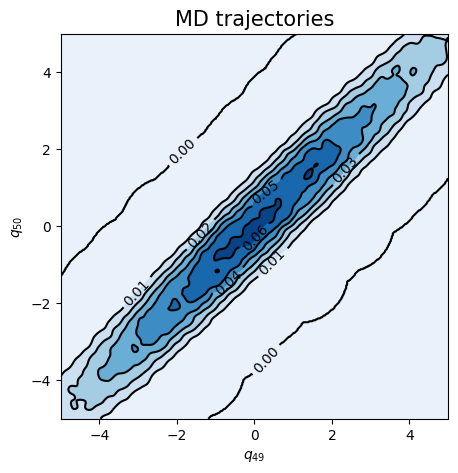

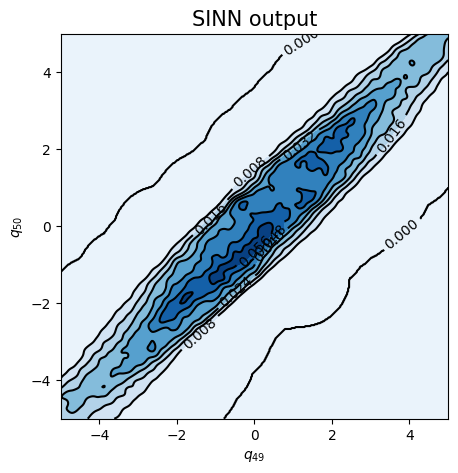

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8634, 0.8585, acf: 0.10209, ccf: 0.13149, pdf: 0.29253, pdf2: 0.28720, acf2: 0.04519
[50]-th step loss: 0.2688, 0.2694, acf: 0.03721, ccf: 0.20231, pdf: 0.01390, pdf2: 0.01081, acf2: 0.00518
[100]-th step loss: 0.3816, 0.3362, acf: 0.03671, ccf: 0.26709, pdf: 0.01142, pdf2: 0.01994, acf2: 0.00103
[150]-th step loss: 0.2935, 0.2914, acf: 0.05402, ccf: 0.21345, pdf: 0.00684, pdf2: 0.01226, acf2: 0.00485
[200]-th step loss: 0.0142, 0.0152, acf: 0.00029, ccf: 0.00208, pdf: 0.00604, pdf2: 0.00468, acf2: 0.00209
[250]-th step loss: 0.0171, 0.0232, acf: 0.00347, ccf: 0.00753, pdf: 0.00613, pdf2: 0.00439, acf2: 0.00167
[300]-th step loss: 0.0407, 0.0493, acf: 0.01599, ccf: 0.02190, pdf: 0.00466, pdf2: 0.00373, acf2: 0.00303
[350]-th step loss: 0.0717, 0.0584, acf: 0.02059, ccf: 0.02712, pdf: 0.00457, pdf2: 0.00333, acf2: 0.00283
[400]-th step loss: 0.0121, 0.0125, acf: 0.00185, ccf: 0.00417, pdf: 0.00262, pdf2: 0.00301, acf2: 0.00085
[450]-th step loss: 0.0110, 0.0156, acf:

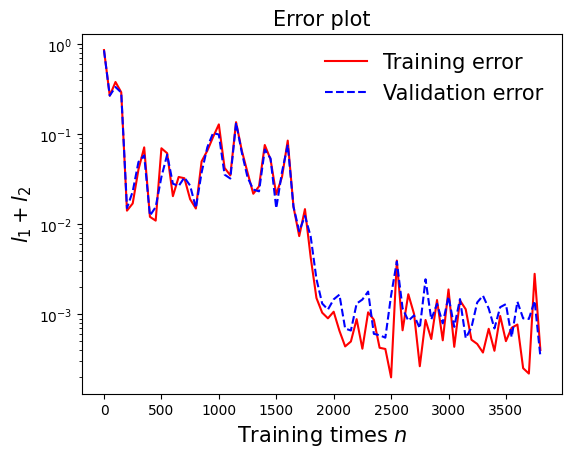

In [99]:
draw_loss(model6)

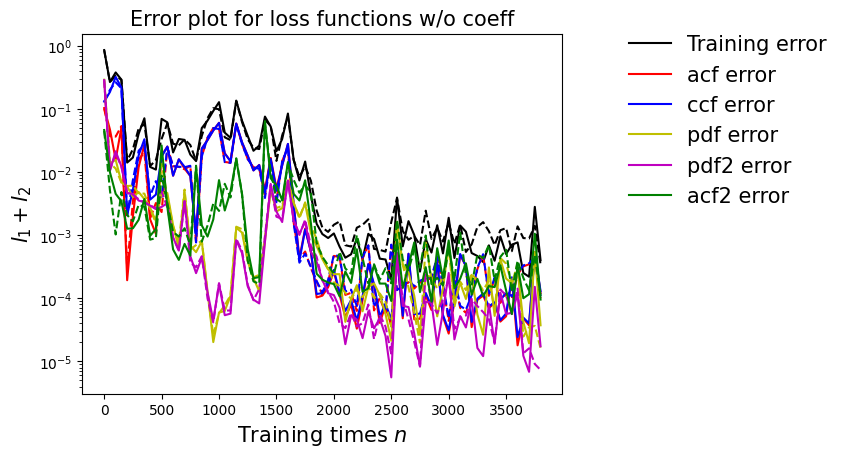

In [100]:
draw_errors(model6)

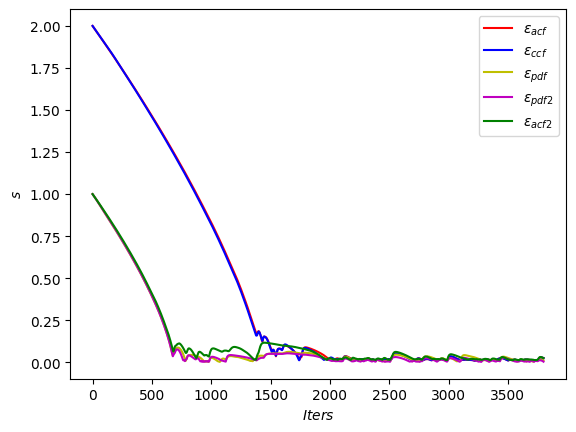

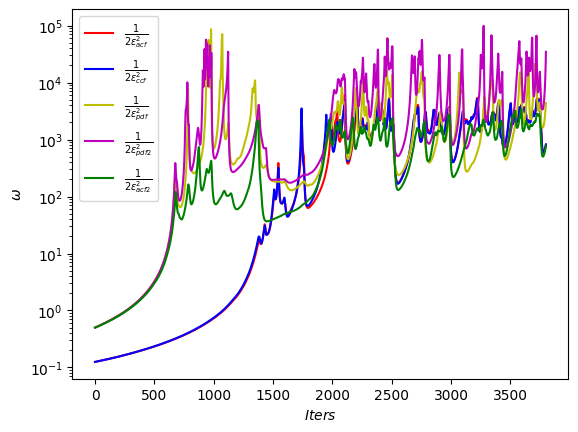

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

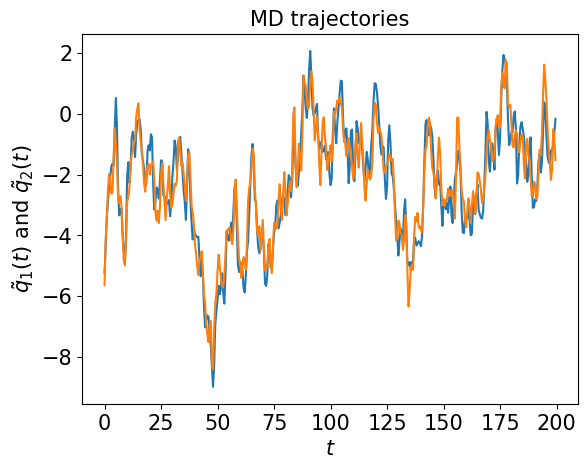

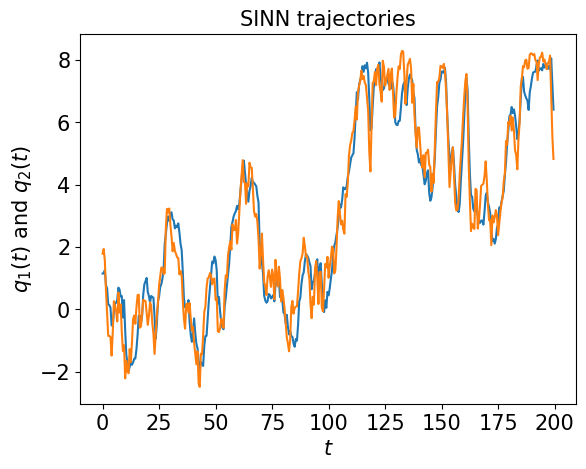

In [102]:
test1(model6)

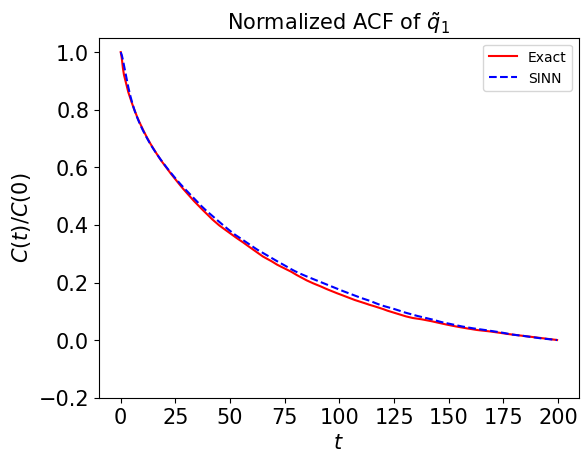

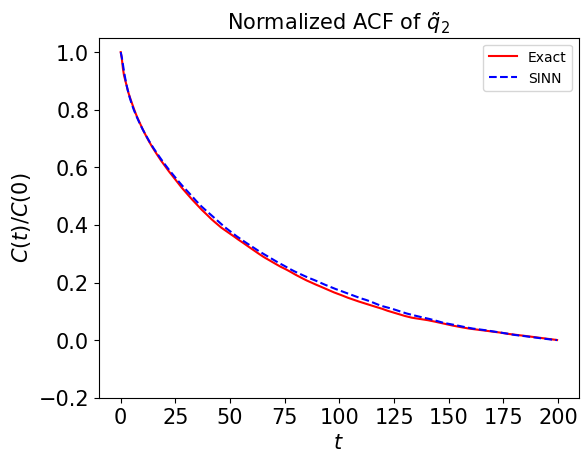

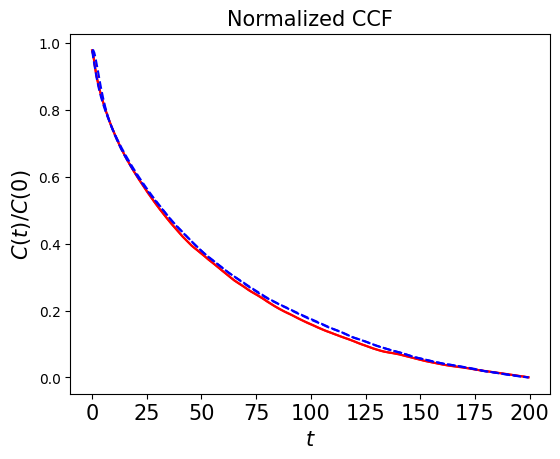

In [103]:
test2(model6)

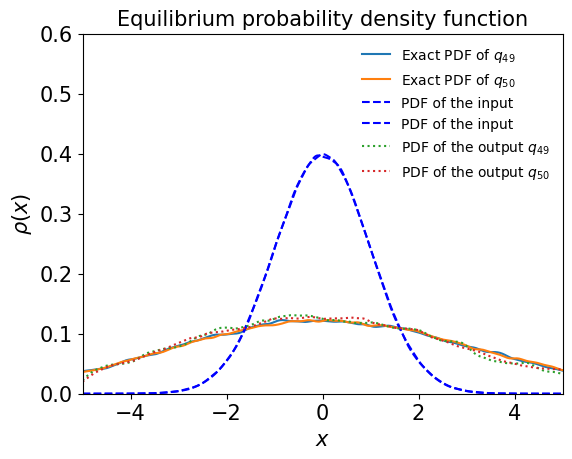

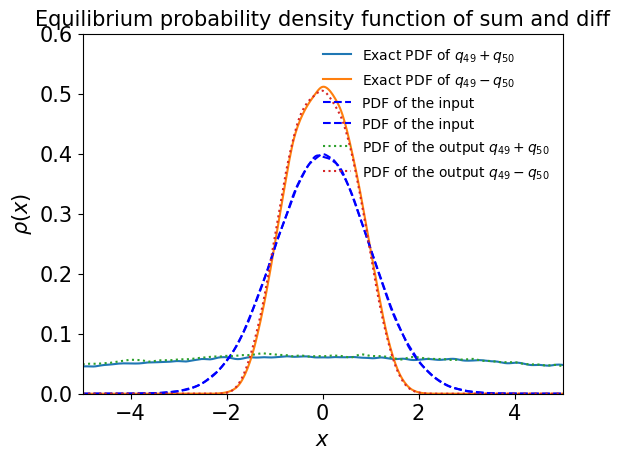

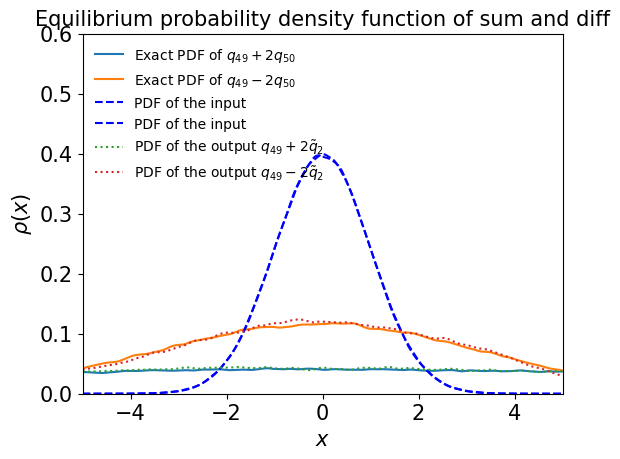

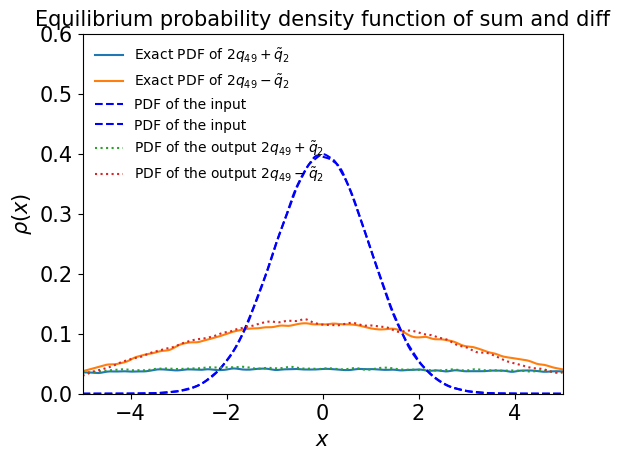

In [104]:
test3(model6)

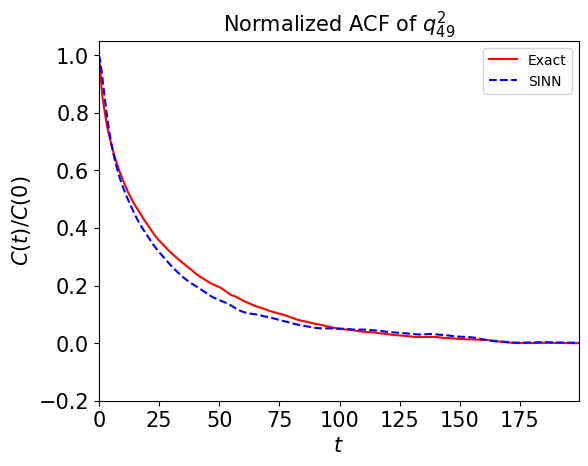

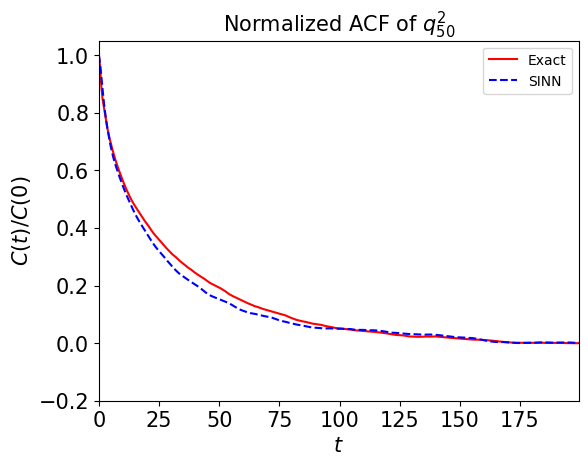

In [105]:
test4(model6)

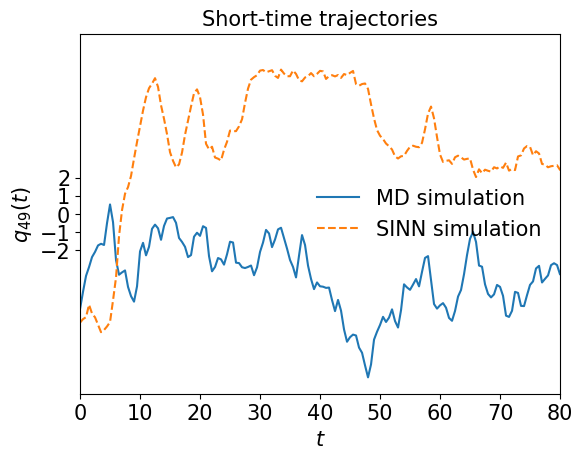

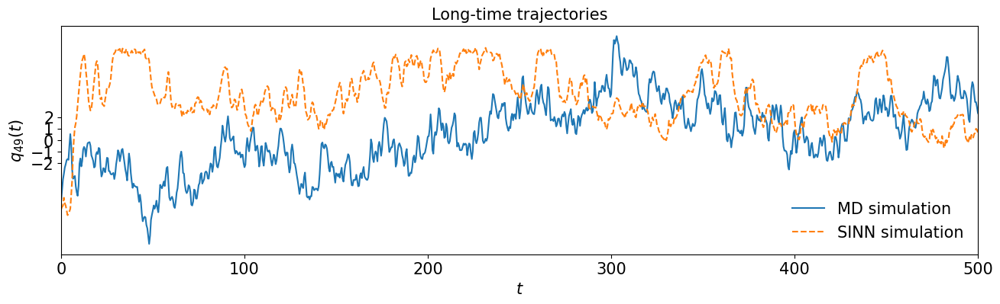

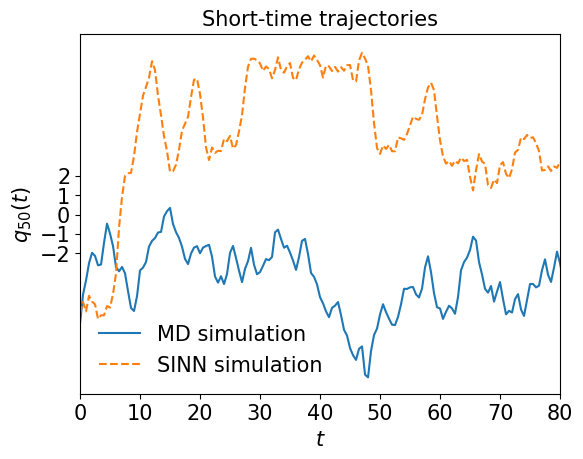

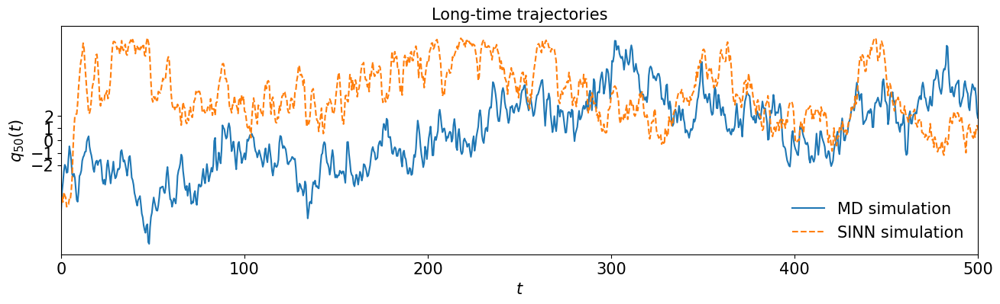

In [106]:
test5(model6)

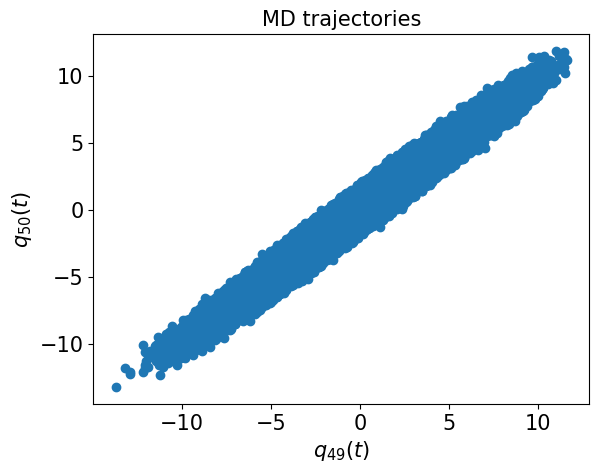

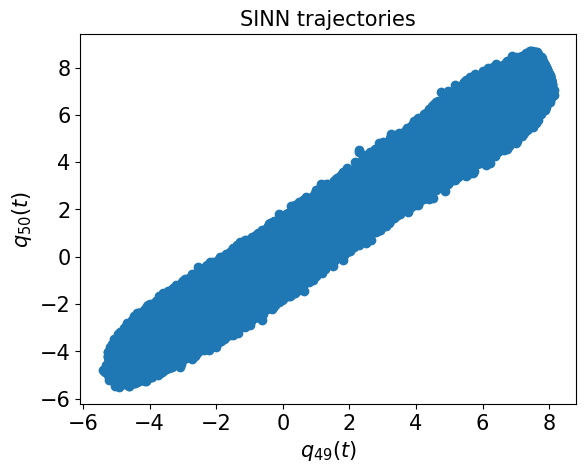

In [107]:
test6(model6)

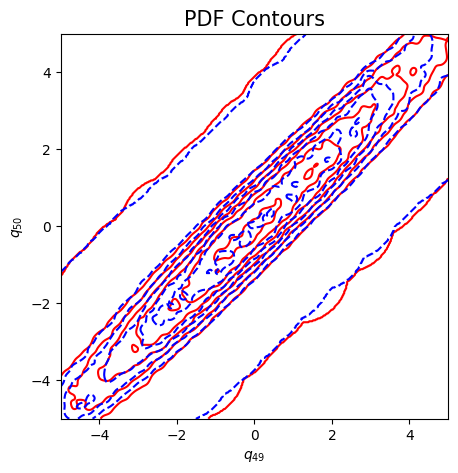

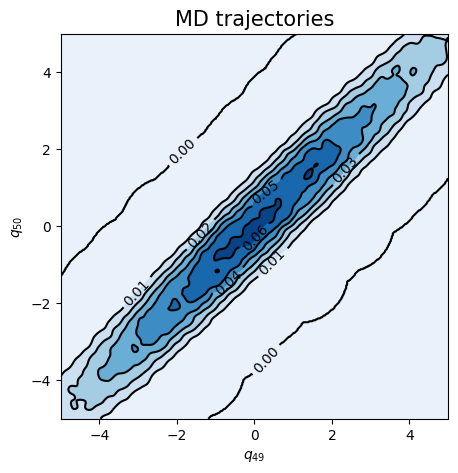

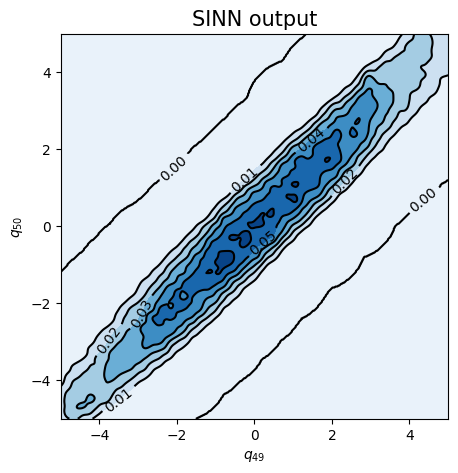

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8367, 0.8319, acf: 0.10276, ccf: 0.10299, pdf: 0.29262, pdf2: 0.28777, acf2: 0.04573
[50]-th step loss: 0.1184, 0.1158, acf: 0.02273, ccf: 0.02268, pdf: 0.03349, pdf2: 0.02790, acf2: 0.00898
[100]-th step loss: 0.0288, 0.0303, acf: 0.00496, ccf: 0.00382, pdf: 0.00947, pdf2: 0.00901, acf2: 0.00301
[150]-th step loss: 0.0730, 0.0939, acf: 0.01991, ccf: 0.01984, pdf: 0.02288, pdf2: 0.02294, acf2: 0.00833
[200]-th step loss: 0.0387, 0.0451, acf: 0.01257, ccf: 0.01272, pdf: 0.00557, pdf2: 0.01154, acf2: 0.00271
[250]-th step loss: 0.0051, 0.0048, acf: 0.00059, ccf: 0.00020, pdf: 0.00123, pdf2: 0.00200, acf2: 0.00080
[300]-th step loss: 0.0039, 0.0029, acf: 0.00033, ccf: 0.00014, pdf: 0.00069, pdf2: 0.00107, acf2: 0.00067
[350]-th step loss: 0.0282, 0.0228, acf: 0.00767, ccf: 0.00773, pdf: 0.00384, pdf2: 0.00267, acf2: 0.00089
[400]-th step loss: 0.0037, 0.0032, acf: 0.00068, ccf: 0.00063, pdf: 0.00051, pdf2: 0.00078, acf2: 0.00056
[450]-th step loss: 0.0045, 0.0047, acf:

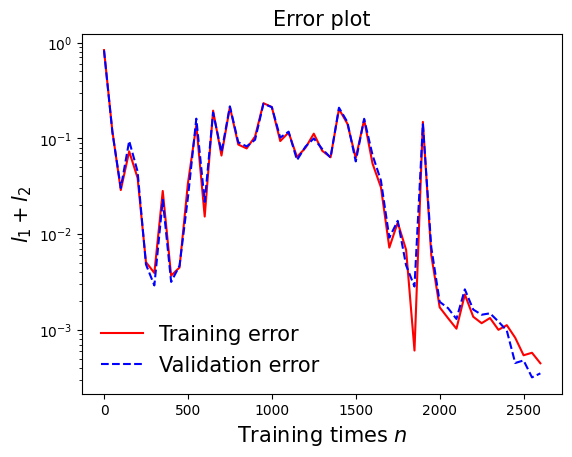

In [110]:
draw_loss(model7)

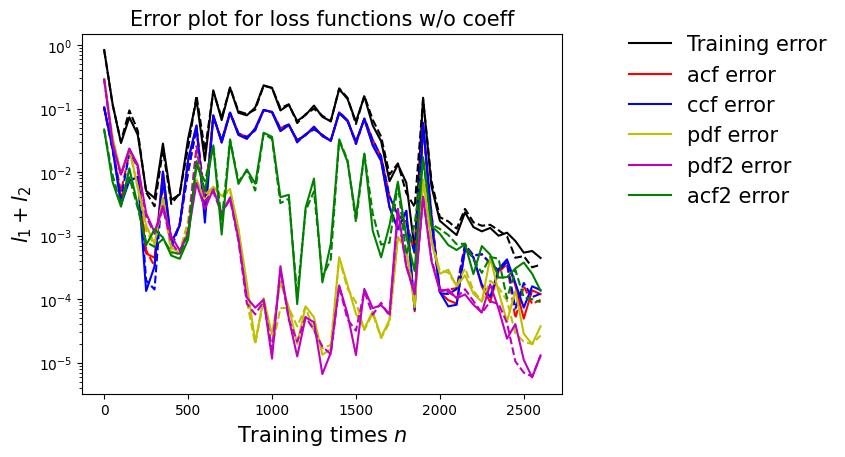

In [111]:
draw_errors(model7)

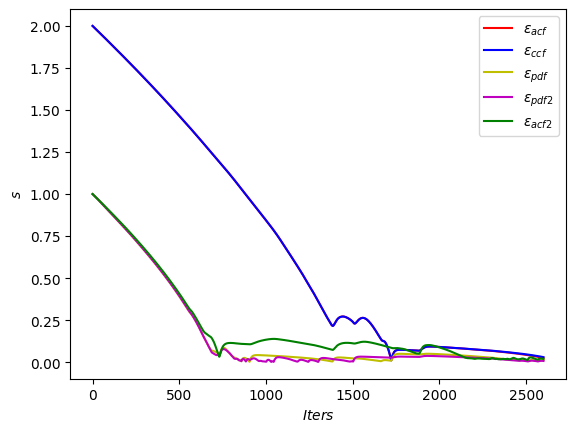

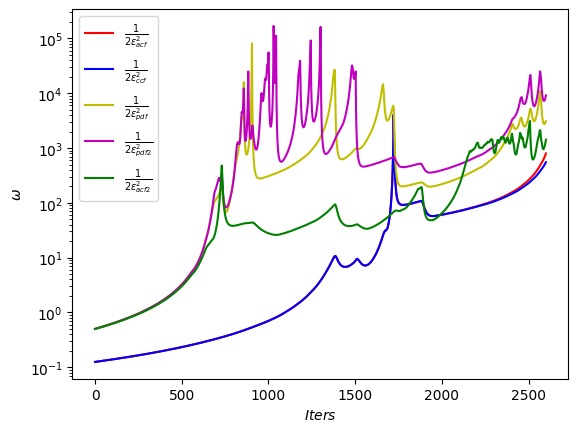

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

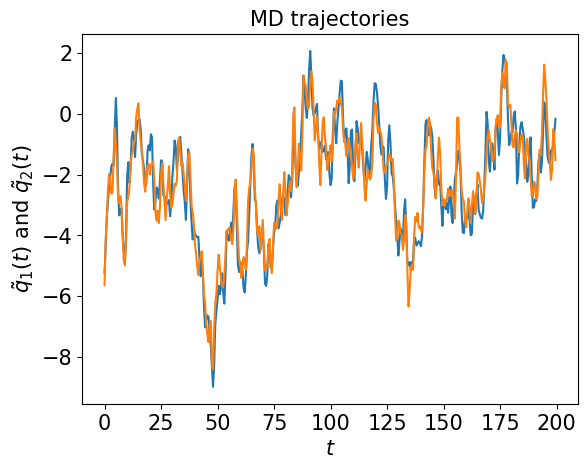

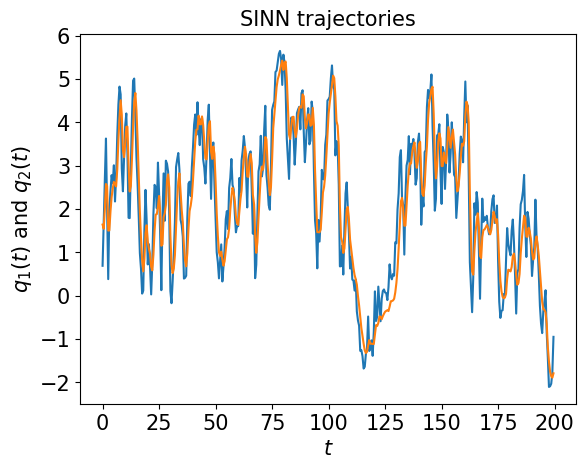

In [113]:
test1(model7)

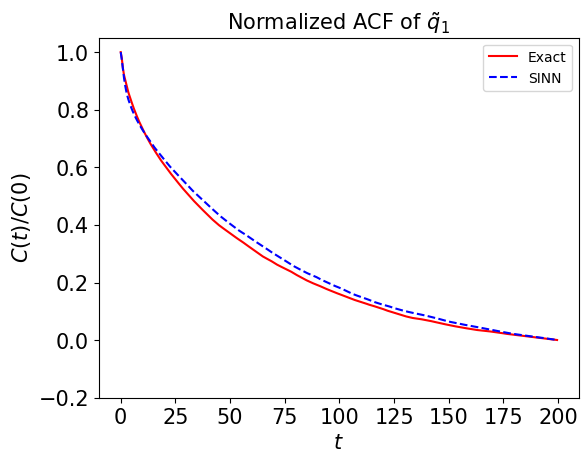

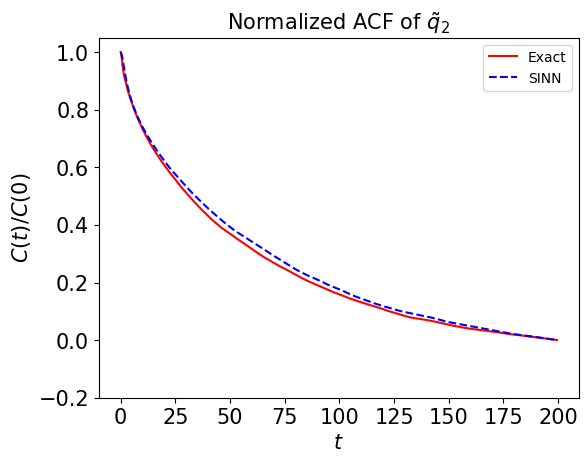

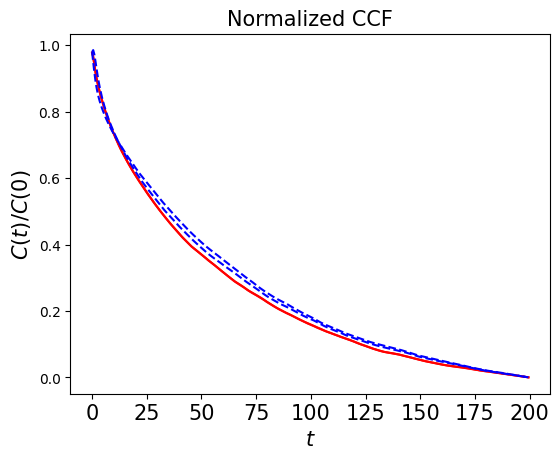

In [114]:
test2(model7)

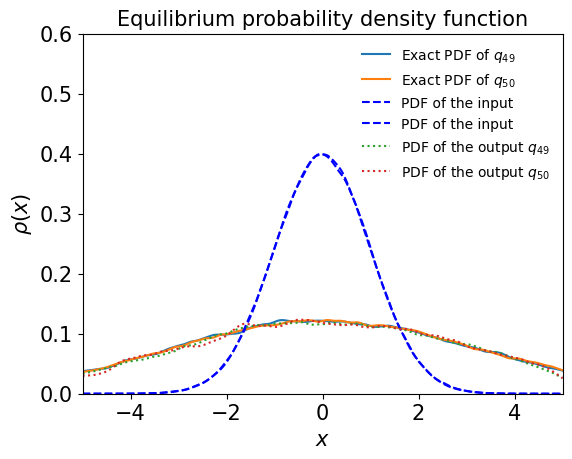

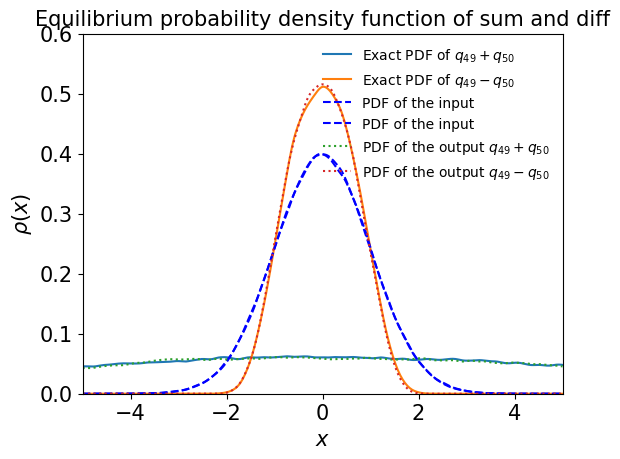

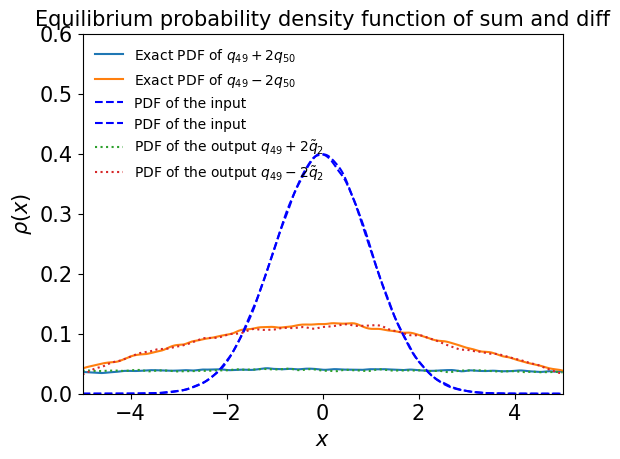

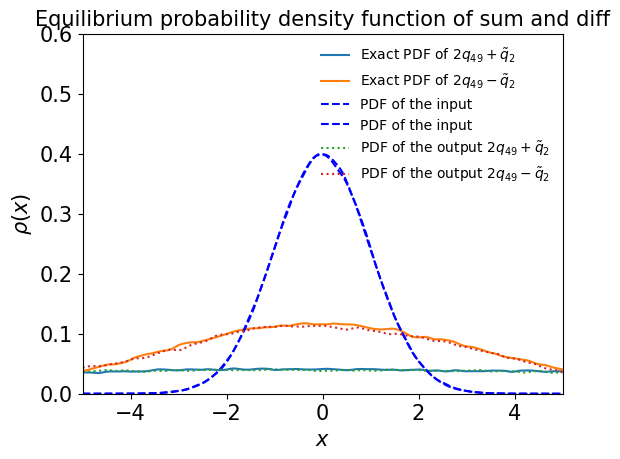

In [115]:
test3(model7)

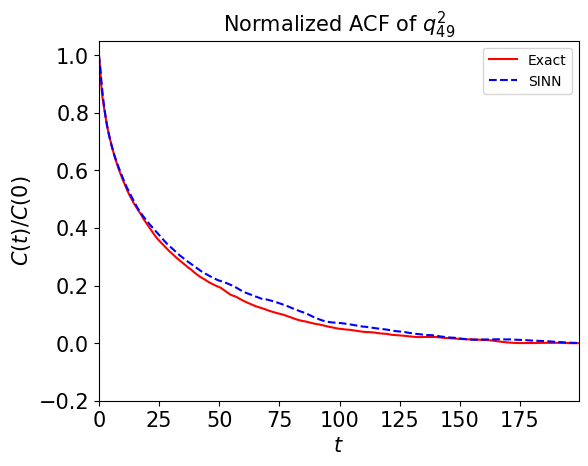

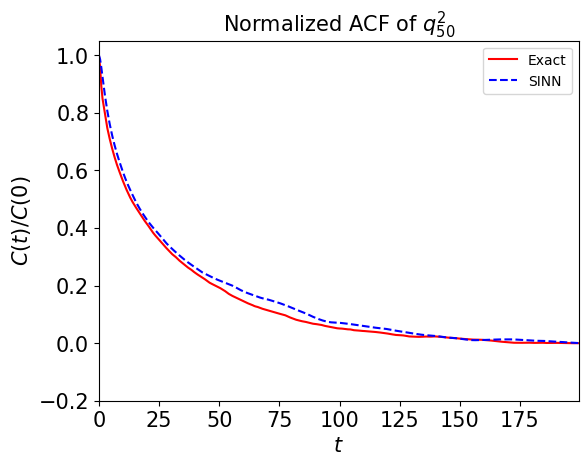

In [116]:
test4(model7)

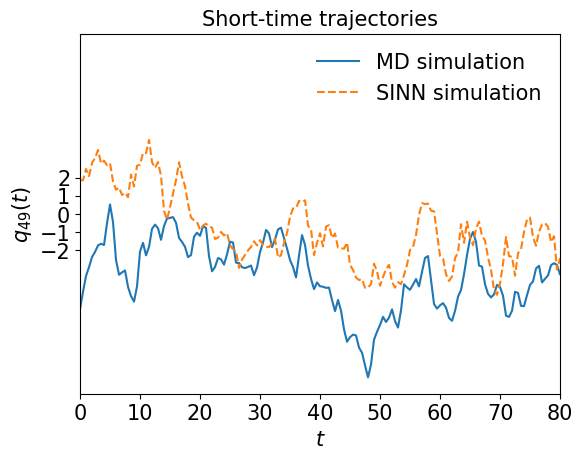

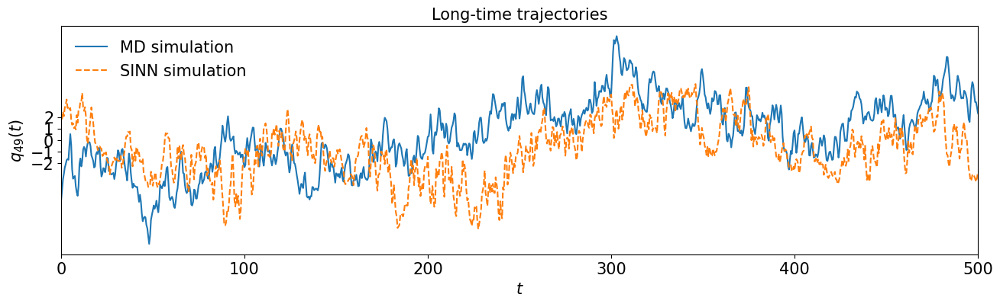

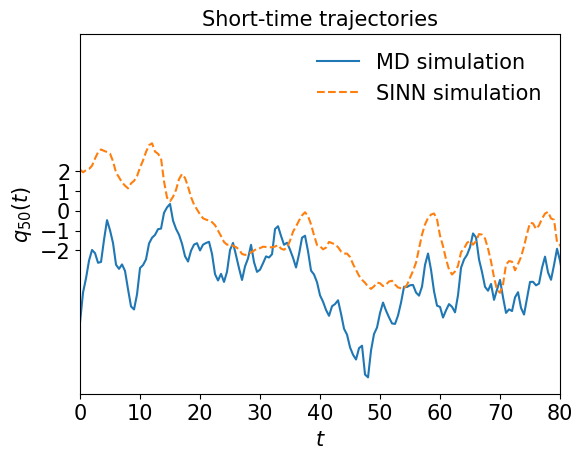

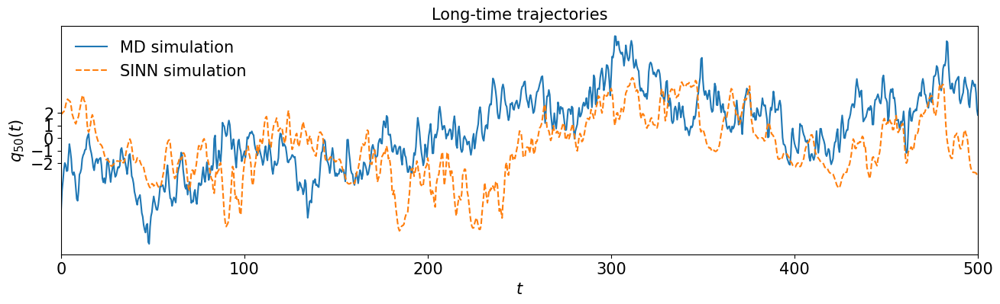

In [117]:
test5(model7)

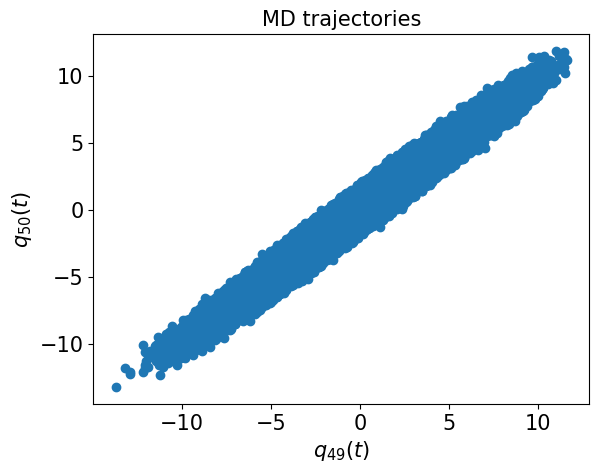

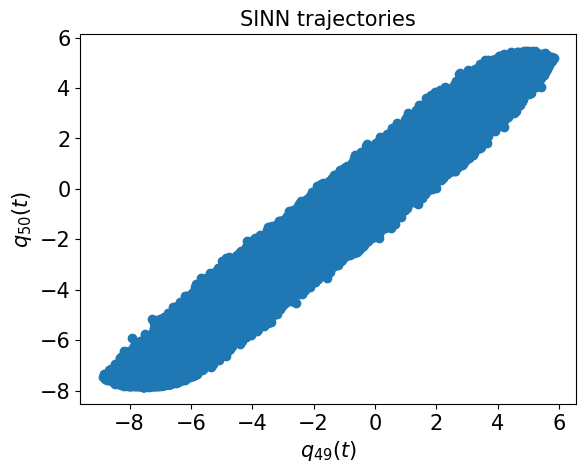

In [118]:
test6(model7)

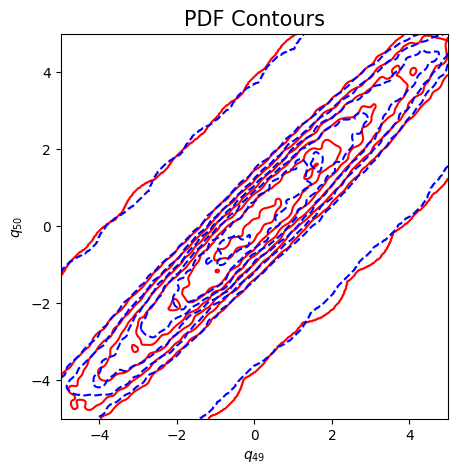

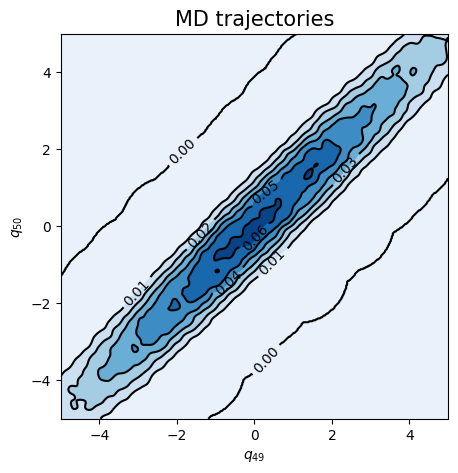

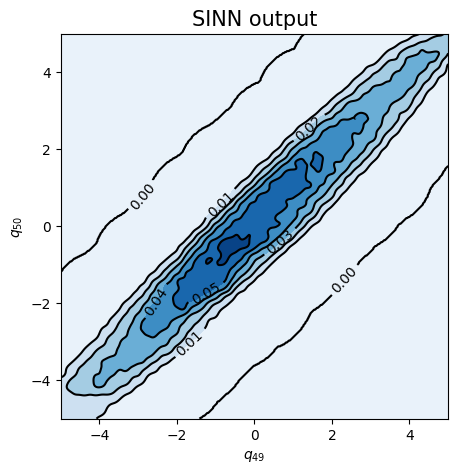

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8600, 0.8460, acf: 0.10141, ccf: 0.11837, pdf: 0.29290, pdf2: 0.28876, acf2: 0.04455
[50]-th step loss: 0.1414, 0.1441, acf: 0.04195, ccf: 0.04187, pdf: 0.01990, pdf2: 0.02197, acf2: 0.01838
[100]-th step loss: 0.0390, 0.0486, acf: 0.01831, ccf: 0.01826, pdf: 0.00485, pdf2: 0.00494, acf2: 0.00224
[150]-th step loss: 0.0167, 0.0143, acf: 0.00286, ccf: 0.00286, pdf: 0.00347, pdf2: 0.00320, acf2: 0.00191
[200]-th step loss: 0.0058, 0.0054, acf: 0.00067, ccf: 0.00068, pdf: 0.00151, pdf2: 0.00180, acf2: 0.00069
[250]-th step loss: 0.0043, 0.0070, acf: 0.00197, ccf: 0.00196, pdf: 0.00098, pdf2: 0.00135, acf2: 0.00078
[300]-th step loss: 0.0087, 0.0051, acf: 0.00081, ccf: 0.00082, pdf: 0.00140, pdf2: 0.00146, acf2: 0.00065
[350]-th step loss: 0.0045, 0.0042, acf: 0.00070, ccf: 0.00071, pdf: 0.00069, pdf2: 0.00087, acf2: 0.00127
[400]-th step loss: 0.0039, 0.0036, acf: 0.00121, ccf: 0.00121, pdf: 0.00026, pdf2: 0.00061, acf2: 0.00030
[450]-th step loss: 0.0031, 0.0029, acf:

[3850]-th step loss: 0.0239, 0.0232, acf: 0.00081, ccf: 0.00079, pdf: 0.00829, pdf2: 0.00463, acf2: 0.00870
[3900]-th step loss: 0.0239, 0.0234, acf: 0.00118, ccf: 0.00116, pdf: 0.00829, pdf2: 0.00501, acf2: 0.00780
[3950]-th step loss: 0.0283, 0.0272, acf: 0.00006, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00516, acf2: 0.01362
[4000]-th step loss: 0.0245, 0.0250, acf: 0.00020, ccf: 0.00020, pdf: 0.00829, pdf2: 0.00443, acf2: 0.01193
[4050]-th step loss: 0.0287, 0.0280, acf: 0.00190, ccf: 0.00188, pdf: 0.00829, pdf2: 0.00679, acf2: 0.00916
[4100]-th step loss: 0.0279, 0.0284, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00588, acf2: 0.01405
[4150]-th step loss: 0.0433, 0.0341, acf: 0.00035, ccf: 0.00033, pdf: 0.00829, pdf2: 0.01341, acf2: 0.01176
[4200]-th step loss: 0.0333, 0.0392, acf: 0.00074, ccf: 0.00072, pdf: 0.00829, pdf2: 0.00749, acf2: 0.02200
[4250]-th step loss: 0.0453, 0.0462, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.02135, acf2: 0.01637
[4300]-th step loss: 0.0291,

[7650]-th step loss: 0.0345, 0.0318, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00984, acf2: 0.01357
[7700]-th step loss: 0.0237, 0.0246, acf: 0.00027, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00442, acf2: 0.01130
[7750]-th step loss: 0.0300, 0.0262, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00468, acf2: 0.01309
[7800]-th step loss: 0.0253, 0.0255, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00458, acf2: 0.01239
[7850]-th step loss: 0.0305, 0.0290, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00541, acf2: 0.01514
[7900]-th step loss: 0.0372, 0.0378, acf: 0.00023, ccf: 0.00022, pdf: 0.00829, pdf2: 0.01099, acf2: 0.01810
[7950]-th step loss: 0.0294, 0.0308, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00728, acf2: 0.01519
[8000]-th step loss: 0.0281, 0.0285, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00700, acf2: 0.01303
[8050]-th step loss: 0.0317, 0.0293, acf: 0.00004, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00706, acf2: 0.01390
[8100]-th step loss: 0.0270,

[11450]-th step loss: 0.0287, 0.0261, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00412, acf2: 0.01355
[11500]-th step loss: 0.0325, 0.0266, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00418, acf2: 0.01410
[11550]-th step loss: 0.0251, 0.0258, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00403, acf2: 0.01335
[11600]-th step loss: 0.0286, 0.0269, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00421, acf2: 0.01439
[11650]-th step loss: 0.0264, 0.0263, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00416, acf2: 0.01377
[11700]-th step loss: 0.0307, 0.0262, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00457, acf2: 0.01328
[11750]-th step loss: 0.0253, 0.0257, acf: 0.00013, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00480, acf2: 0.01231
[11800]-th step loss: 0.0269, 0.0281, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00460, acf2: 0.01511
[11850]-th step loss: 0.0278, 0.0257, acf: 0.00036, ccf: 0.00035, pdf: 0.00829, pdf2: 0.00538, acf2: 0.01137
[11900]-th step los

[15250]-th step loss: 0.0296, 0.0308, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00895, acf2: 0.01327
[15300]-th step loss: 0.0244, 0.0248, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00400, acf2: 0.01227
[15350]-th step loss: 0.0243, 0.0269, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00484, acf2: 0.01361
[15400]-th step loss: 0.0292, 0.0250, acf: 0.00024, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00484, acf2: 0.01142
[15450]-th step loss: 0.0299, 0.0259, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00446, acf2: 0.01298
[15500]-th step loss: 0.0284, 0.0271, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00461, acf2: 0.01408
[15550]-th step loss: 0.0269, 0.0277, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00544, acf2: 0.01388
[15600]-th step loss: 0.0317, 0.0283, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00460, acf2: 0.01533
[15650]-th step loss: 0.0293, 0.0278, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00611, acf2: 0.01327
[15700]-th step los

[19050]-th step loss: 0.0232, 0.0248, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00408, acf2: 0.01218
[19100]-th step loss: 0.0248, 0.0251, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00385, acf2: 0.01279
[19150]-th step loss: 0.0318, 0.0258, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00414, acf2: 0.01321
[19200]-th step loss: 0.0276, 0.0274, acf: 0.00004, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00532, acf2: 0.01374
[19250]-th step loss: 0.0456, 0.0271, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00396, acf2: 0.01482
[19300]-th step loss: 0.0254, 0.0264, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00406, acf2: 0.01396
[19350]-th step loss: 0.0279, 0.0276, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00395, acf2: 0.01528
[19400]-th step loss: 0.0258, 0.0246, acf: 0.00015, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00393, acf2: 0.01203
[19450]-th step loss: 0.0297, 0.0266, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00447, acf2: 0.01377
[19500]-th step los

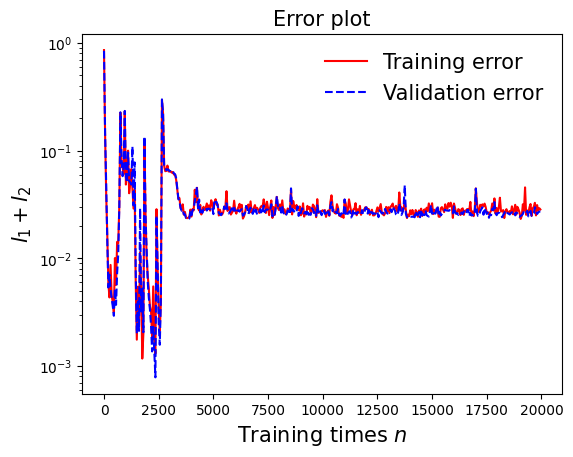

In [121]:
draw_loss(model8)

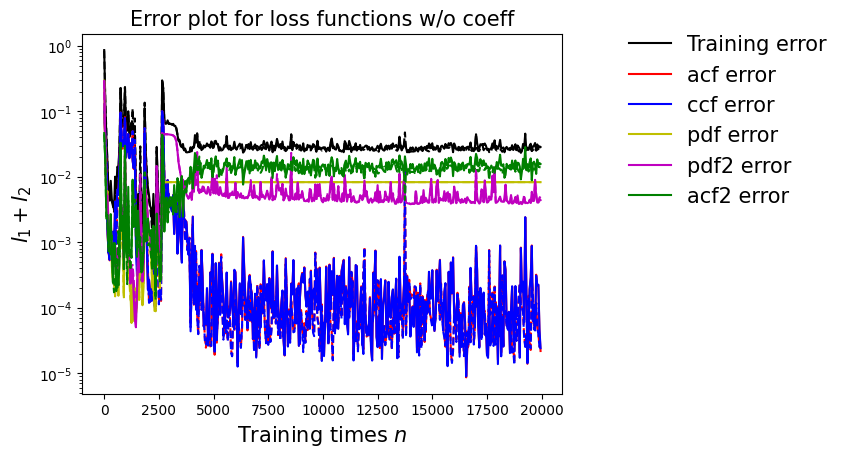

In [122]:
draw_errors(model8)

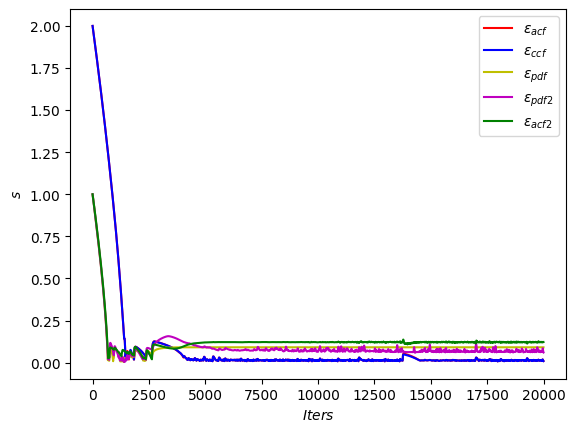

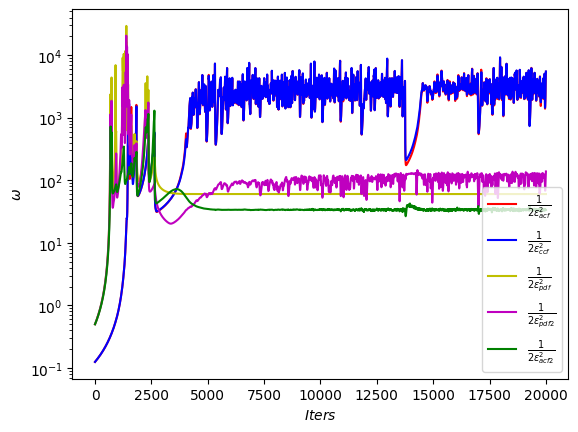

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

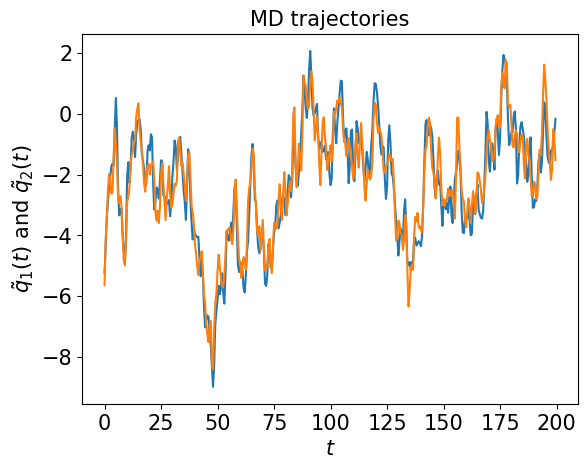

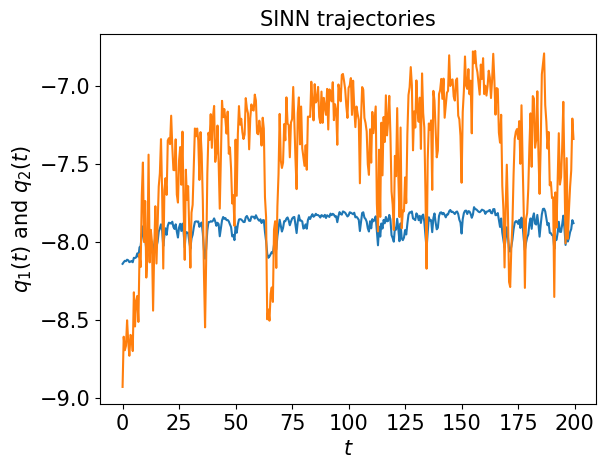

In [124]:
test1(model8)

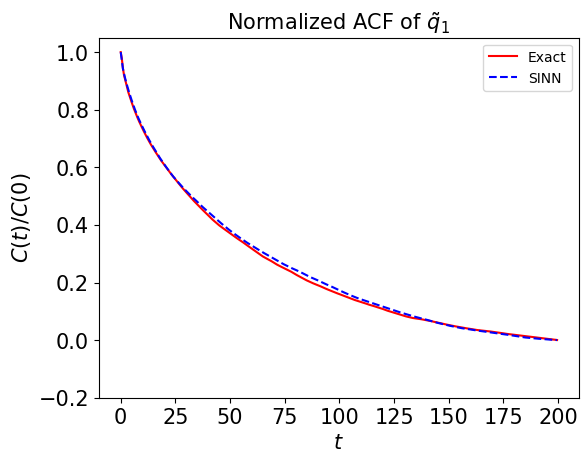

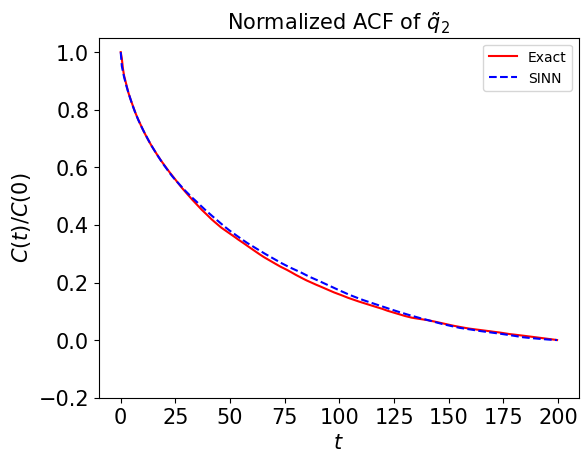

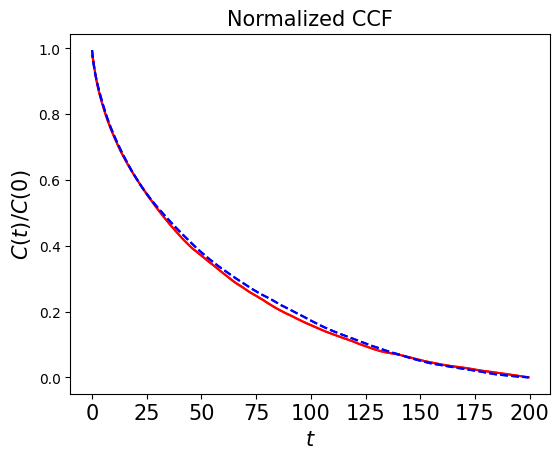

In [125]:
test2(model8)

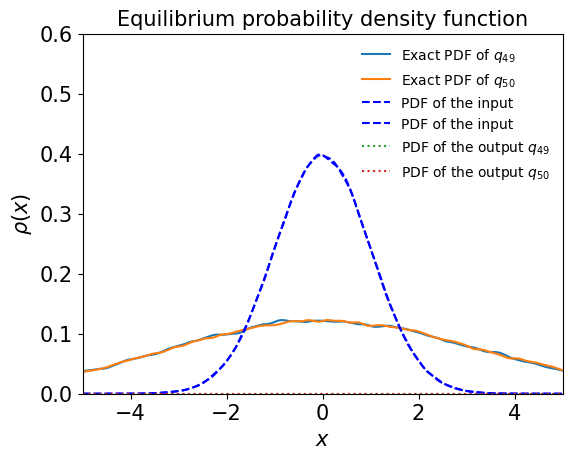

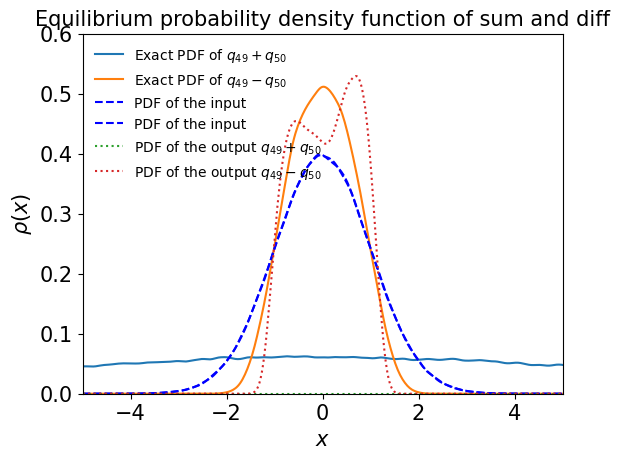

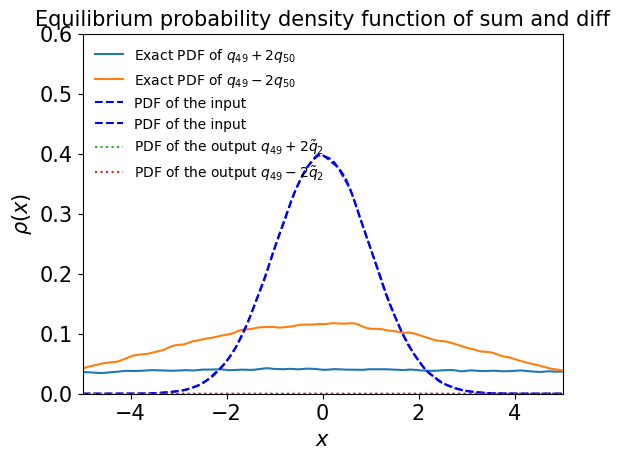

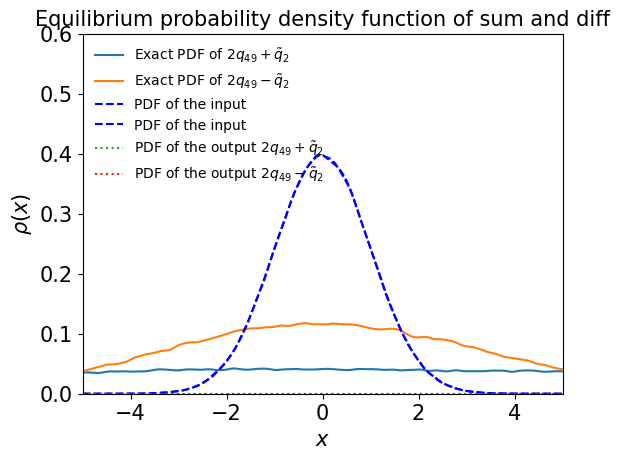

In [126]:
test3(model8)

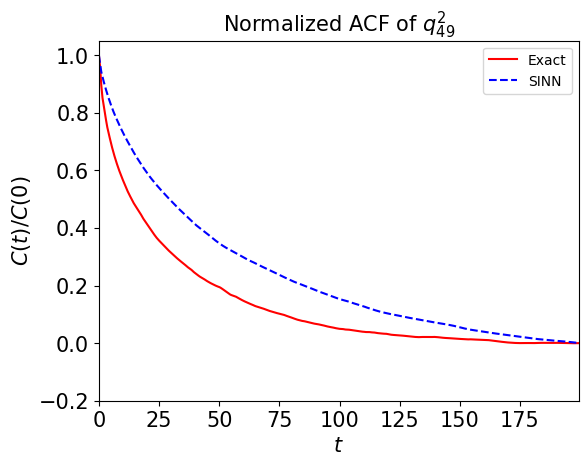

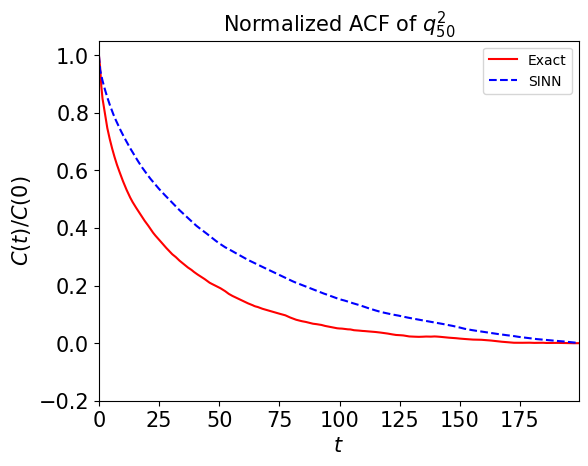

In [127]:
test4(model8)

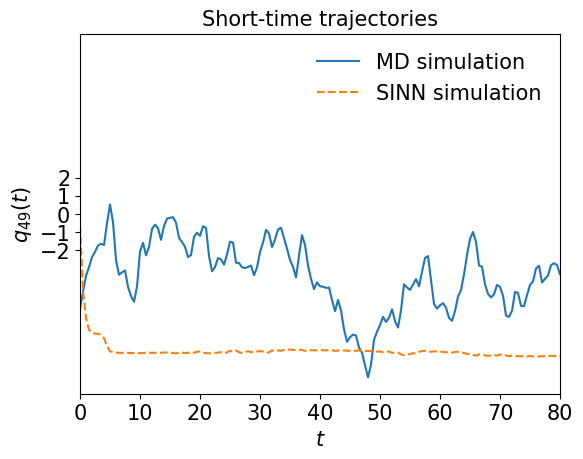

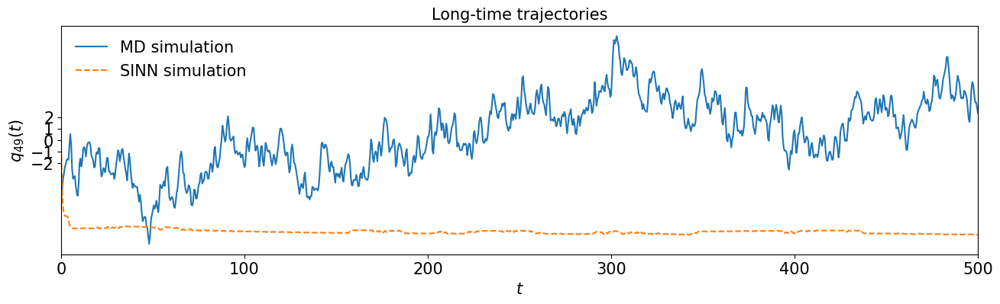

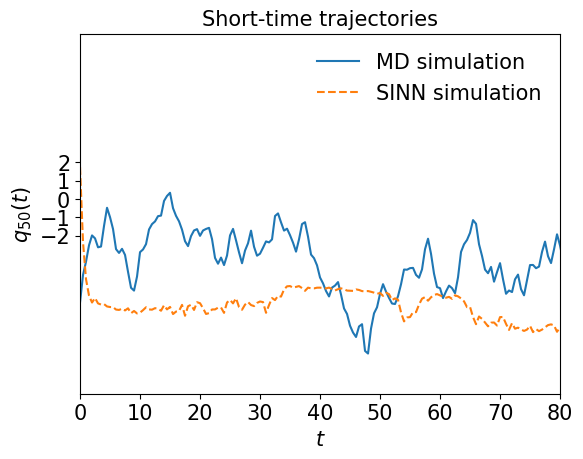

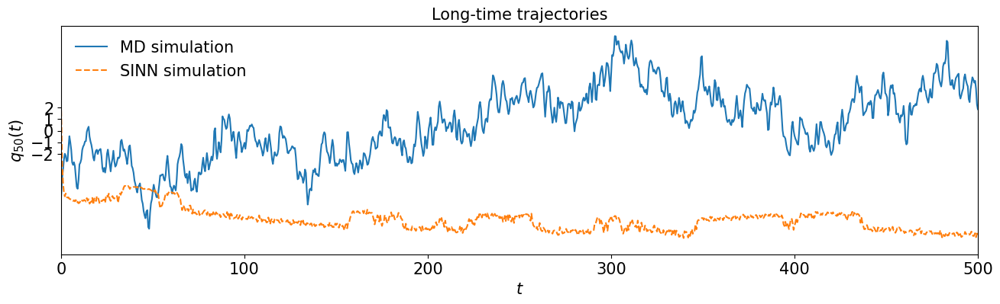

In [128]:
test5(model8)

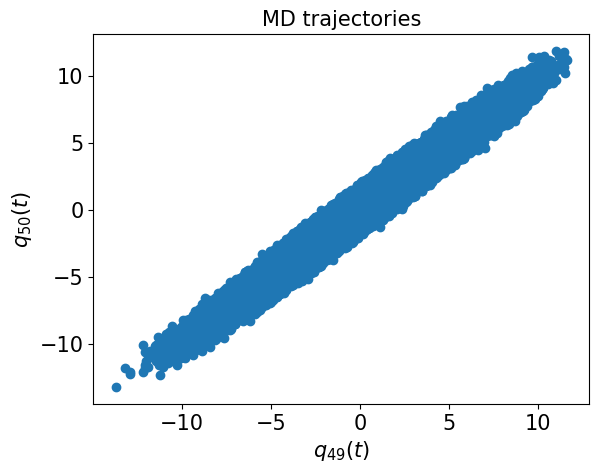

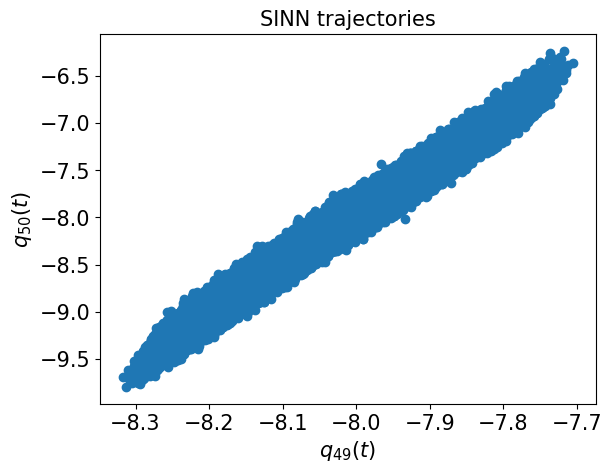

In [129]:
test6(model8)

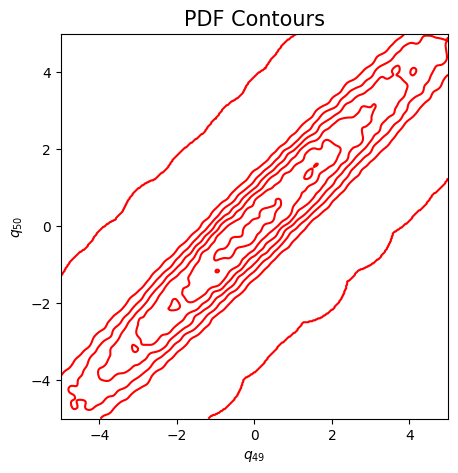

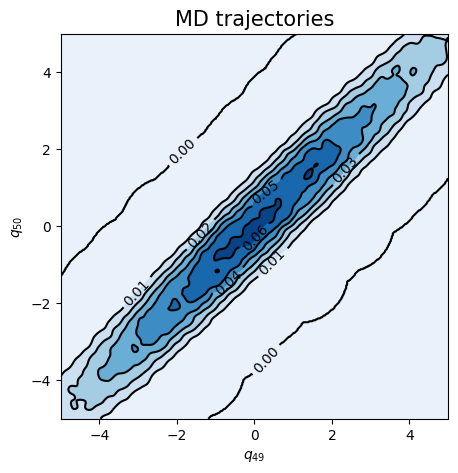

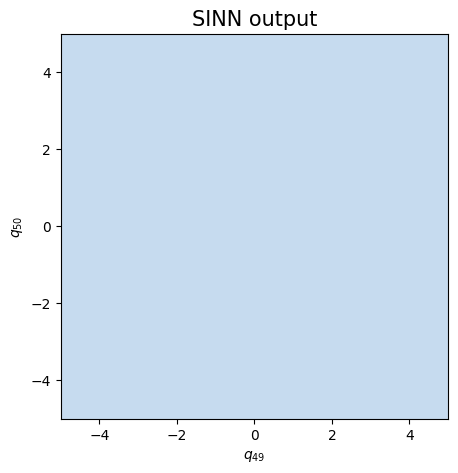

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8544, 0.8435, acf: 0.10284, ccf: 0.11293, pdf: 0.29299, pdf2: 0.28900, acf2: 0.04578
[50]-th step loss: 0.1128, 0.1107, acf: 0.02758, ccf: 0.02753, pdf: 0.02663, pdf2: 0.02129, acf2: 0.00768
[100]-th step loss: 0.0243, 0.0253, acf: 0.00337, ccf: 0.00333, pdf: 0.01186, pdf2: 0.00642, acf2: 0.00036
[150]-th step loss: 0.0091, 0.0085, acf: 0.00026, ccf: 0.00020, pdf: 0.00455, pdf2: 0.00184, acf2: 0.00166
[200]-th step loss: 0.0085, 0.0090, acf: 0.00195, ccf: 0.00213, pdf: 0.00256, pdf2: 0.00088, acf2: 0.00143
[250]-th step loss: 0.0474, 0.0316, acf: 0.00908, ccf: 0.00945, pdf: 0.00715, pdf2: 0.00213, acf2: 0.00382
[300]-th step loss: 0.0128, 0.0218, acf: 0.00653, ccf: 0.00635, pdf: 0.00249, pdf2: 0.00038, acf2: 0.00607
[350]-th step loss: 0.0066, 0.0035, acf: 0.00058, ccf: 0.00073, pdf: 0.00122, pdf2: 0.00033, acf2: 0.00067
[400]-th step loss: 0.0040, 0.0049, acf: 0.00084, ccf: 0.00087, pdf: 0.00181, pdf2: 0.00067, acf2: 0.00070
[450]-th step loss: 0.0037, 0.0014, acf:

[3850]-th step loss: 0.3311, 0.3489, acf: 0.01486, ccf: 0.32047, pdf: 0.00829, pdf2: 0.00522, acf2: 0.00006
[3900]-th step loss: 0.3484, 0.3336, acf: 0.02080, ccf: 0.29822, pdf: 0.00829, pdf2: 0.00570, acf2: 0.00059
[3950]-th step loss: 0.3485, 0.3463, acf: 0.01567, ccf: 0.31829, pdf: 0.00829, pdf2: 0.00400, acf2: 0.00009
[4000]-th step loss: 0.3523, 0.3463, acf: 0.01529, ccf: 0.31886, pdf: 0.00829, pdf2: 0.00381, acf2: 0.00008
[4050]-th step loss: 0.3623, 0.3585, acf: 0.01272, ccf: 0.33343, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00023
[4100]-th step loss: 0.3533, 0.3514, acf: 0.01485, ccf: 0.32287, pdf: 0.00829, pdf2: 0.00526, acf2: 0.00009
[4150]-th step loss: 0.3506, 0.3571, acf: 0.01311, ccf: 0.33170, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00019
[4200]-th step loss: 0.3608, 0.3493, acf: 0.01500, ccf: 0.32070, pdf: 0.00829, pdf2: 0.00519, acf2: 0.00012
[4250]-th step loss: 0.3402, 0.3387, acf: 0.01835, ccf: 0.30814, pdf: 0.00829, pdf2: 0.00366, acf2: 0.00024
[4300]-th step loss: 0.3401,

[7650]-th step loss: 0.3607, 0.3531, acf: 0.01325, ccf: 0.32766, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00011
[7700]-th step loss: 0.3505, 0.3529, acf: 0.01318, ccf: 0.32756, pdf: 0.00829, pdf2: 0.00374, acf2: 0.00014
[7750]-th step loss: 0.3571, 0.3600, acf: 0.01180, ccf: 0.33577, pdf: 0.00829, pdf2: 0.00389, acf2: 0.00023
[7800]-th step loss: 0.3529, 0.3631, acf: 0.01134, ccf: 0.33875, pdf: 0.00829, pdf2: 0.00437, acf2: 0.00035
[7850]-th step loss: 0.3441, 0.3518, acf: 0.01417, ccf: 0.32522, pdf: 0.00829, pdf2: 0.00402, acf2: 0.00008
[7900]-th step loss: 0.3483, 0.3477, acf: 0.01468, ccf: 0.32046, pdf: 0.00829, pdf2: 0.00420, acf2: 0.00007
[7950]-th step loss: 0.3452, 0.3463, acf: 0.01528, ccf: 0.31891, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00008
[8000]-th step loss: 0.3487, 0.3592, acf: 0.01196, ccf: 0.33467, pdf: 0.00829, pdf2: 0.00406, acf2: 0.00021
[8050]-th step loss: 0.3520, 0.3561, acf: 0.01229, ccf: 0.33153, pdf: 0.00829, pdf2: 0.00373, acf2: 0.00021
[8100]-th step loss: 0.3420,

[11450]-th step loss: 0.3407, 0.3530, acf: 0.01312, ccf: 0.32762, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00017
[11500]-th step loss: 0.3422, 0.3532, acf: 0.01429, ccf: 0.32675, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00011
[11550]-th step loss: 0.3497, 0.3612, acf: 0.01083, ccf: 0.33791, pdf: 0.00829, pdf2: 0.00376, acf2: 0.00040
[11600]-th step loss: 0.3537, 0.3575, acf: 0.01306, ccf: 0.32945, pdf: 0.00829, pdf2: 0.00660, acf2: 0.00010
[11650]-th step loss: 0.3634, 0.3609, acf: 0.01130, ccf: 0.33726, pdf: 0.00829, pdf2: 0.00377, acf2: 0.00032
[11700]-th step loss: 0.3487, 0.3446, acf: 0.01611, ccf: 0.31548, pdf: 0.00829, pdf2: 0.00460, acf2: 0.00013
[11750]-th step loss: 0.3477, 0.3554, acf: 0.01302, ccf: 0.32959, pdf: 0.00829, pdf2: 0.00432, acf2: 0.00013
[11800]-th step loss: 0.3558, 0.3571, acf: 0.01205, ccf: 0.33275, pdf: 0.00829, pdf2: 0.00375, acf2: 0.00023
[11850]-th step loss: 0.3467, 0.3508, acf: 0.01388, ccf: 0.32478, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00007
[11900]-th step los

[15250]-th step loss: 0.3494, 0.3552, acf: 0.01219, ccf: 0.33080, pdf: 0.00829, pdf2: 0.00367, acf2: 0.00023
[15300]-th step loss: 0.3457, 0.3546, acf: 0.01271, ccf: 0.32948, pdf: 0.00829, pdf2: 0.00392, acf2: 0.00014
[15350]-th step loss: 0.3552, 0.3571, acf: 0.01204, ccf: 0.33268, pdf: 0.00829, pdf2: 0.00386, acf2: 0.00018
[15400]-th step loss: 0.3584, 0.3604, acf: 0.01144, ccf: 0.33608, pdf: 0.00829, pdf2: 0.00430, acf2: 0.00027
[15450]-th step loss: 0.3560, 0.3563, acf: 0.01247, ccf: 0.33154, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00016
[15500]-th step loss: 0.3451, 0.3547, acf: 0.01256, ccf: 0.33000, pdf: 0.00829, pdf2: 0.00371, acf2: 0.00014
[15550]-th step loss: 0.3530, 0.3576, acf: 0.01184, ccf: 0.33322, pdf: 0.00829, pdf2: 0.00401, acf2: 0.00025
[15600]-th step loss: 0.3495, 0.3609, acf: 0.01106, ccf: 0.33735, pdf: 0.00829, pdf2: 0.00384, acf2: 0.00034
[15650]-th step loss: 0.3517, 0.3580, acf: 0.01150, ccf: 0.33403, pdf: 0.00829, pdf2: 0.00382, acf2: 0.00032
[15700]-th step los

[19050]-th step loss: 0.3494, 0.3552, acf: 0.01213, ccf: 0.33094, pdf: 0.00829, pdf2: 0.00369, acf2: 0.00018
[19100]-th step loss: 0.3464, 0.3531, acf: 0.01269, ccf: 0.32826, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00017
[19150]-th step loss: 0.3362, 0.3442, acf: 0.01536, ccf: 0.31675, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00009
[19200]-th step loss: 0.3545, 0.3587, acf: 0.01113, ccf: 0.33521, pdf: 0.00829, pdf2: 0.00373, acf2: 0.00034
[19250]-th step loss: 0.3570, 0.3581, acf: 0.01147, ccf: 0.33439, pdf: 0.00829, pdf2: 0.00370, acf2: 0.00029
[19300]-th step loss: 0.3441, 0.3510, acf: 0.01314, ccf: 0.32573, pdf: 0.00829, pdf2: 0.00366, acf2: 0.00014
[19350]-th step loss: 0.3509, 0.3533, acf: 0.01256, ccf: 0.32829, pdf: 0.00829, pdf2: 0.00403, acf2: 0.00013
[19400]-th step loss: 0.3538, 0.3576, acf: 0.01149, ccf: 0.33357, pdf: 0.00829, pdf2: 0.00398, acf2: 0.00026
[19450]-th step loss: 0.3503, 0.3584, acf: 0.01114, ccf: 0.33476, pdf: 0.00829, pdf2: 0.00384, acf2: 0.00034
[19500]-th step los

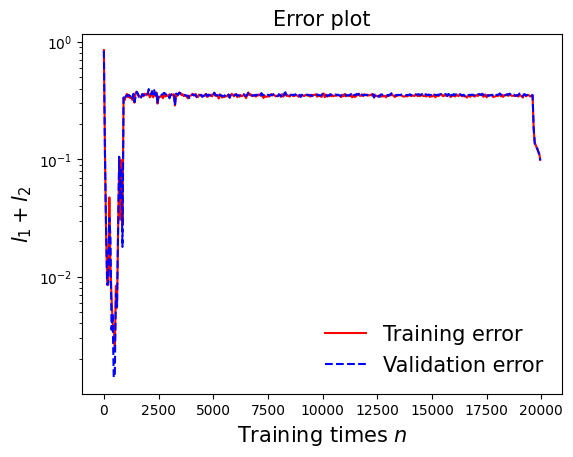

In [132]:
draw_loss(model9)

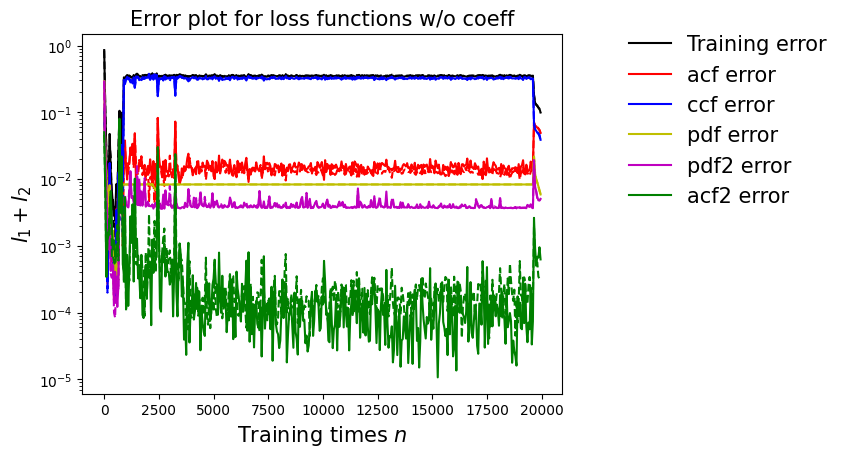

In [133]:
draw_errors(model9)

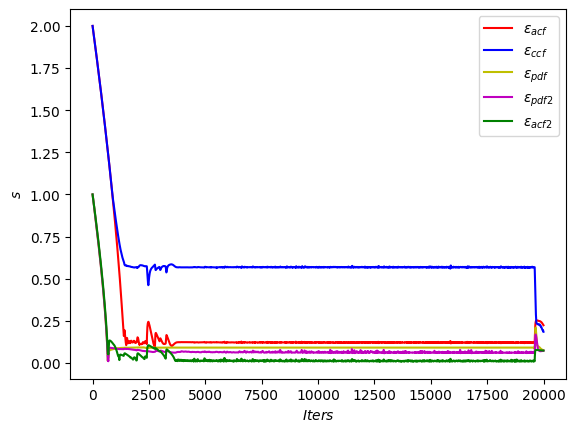

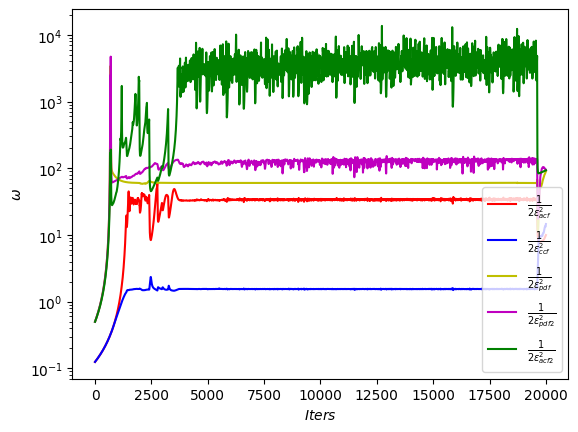

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

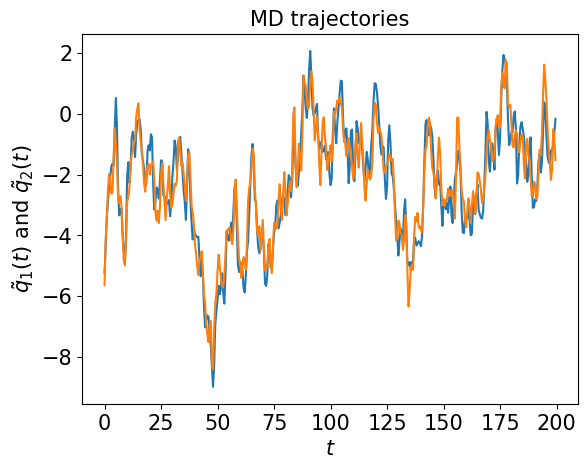

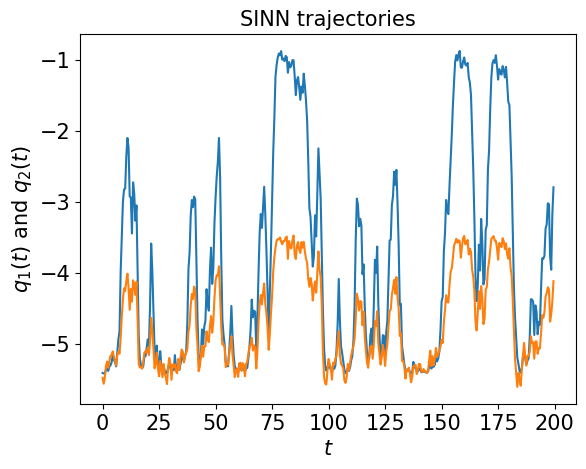

In [135]:
test1(model9)

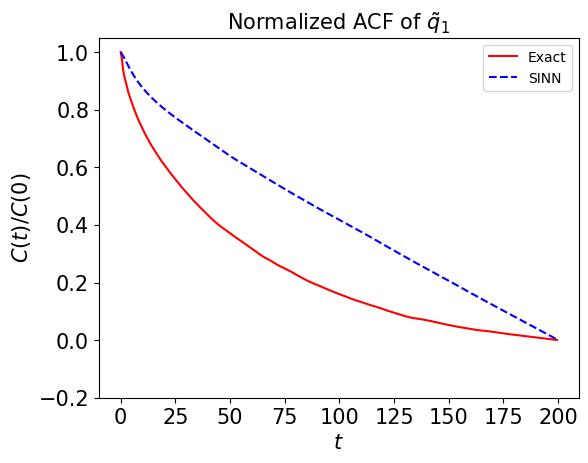

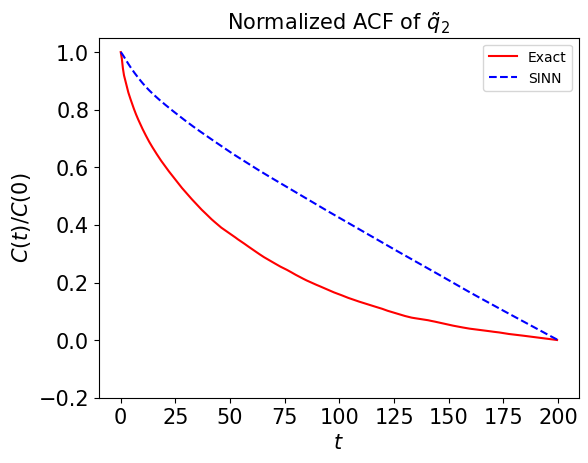

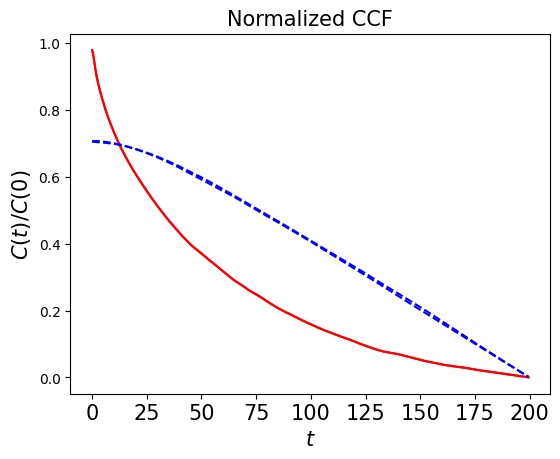

In [136]:
test2(model9)

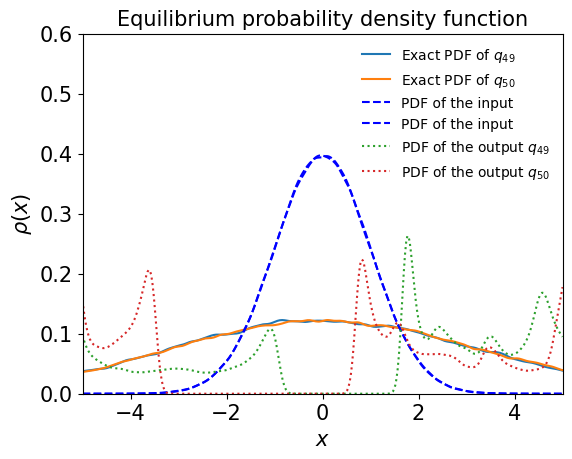

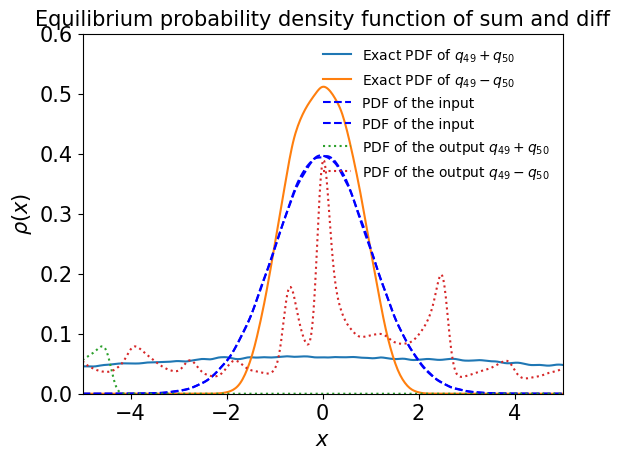

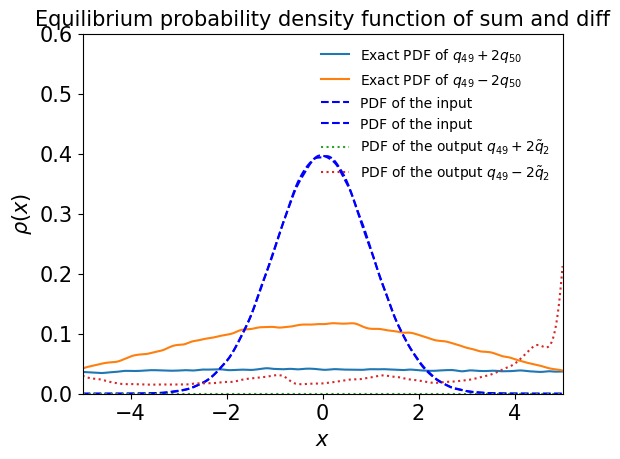

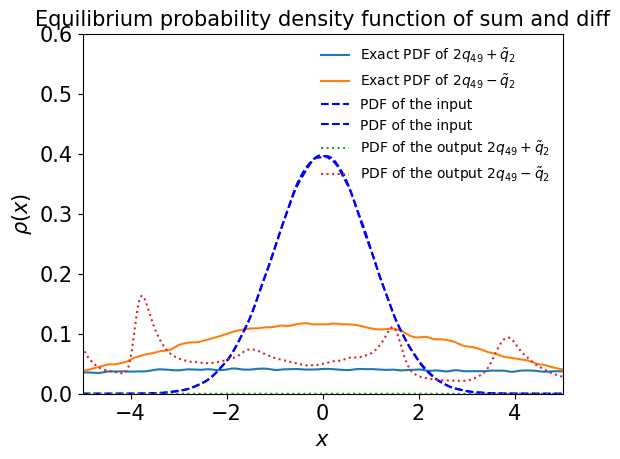

In [137]:
test3(model9)

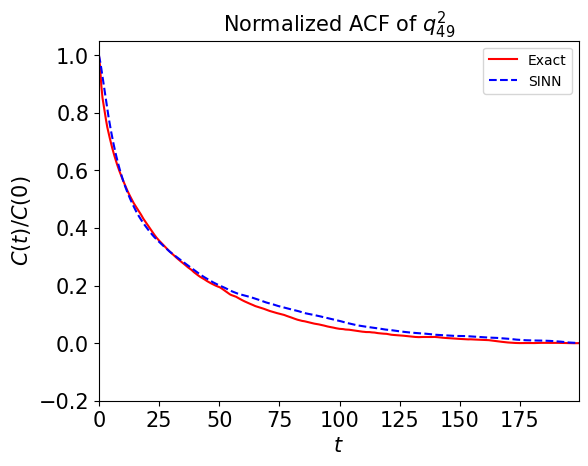

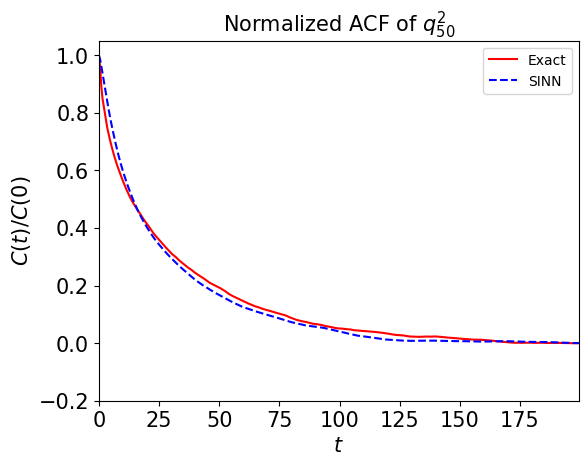

In [138]:
test4(model9)

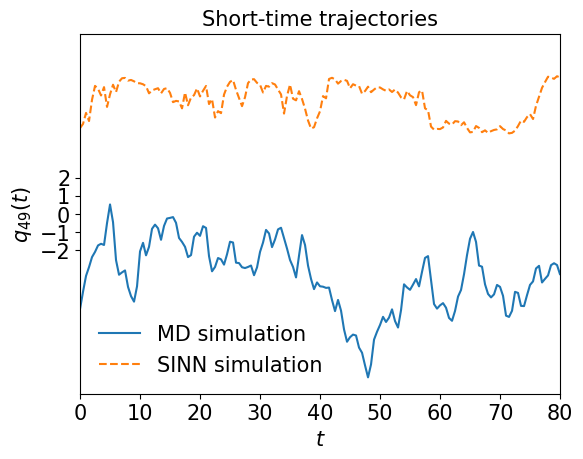

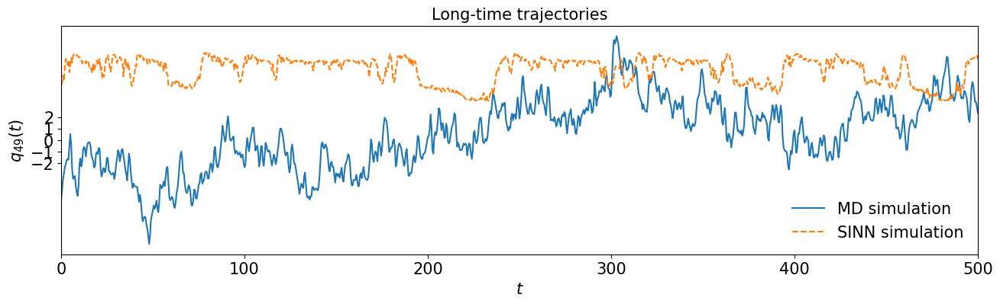

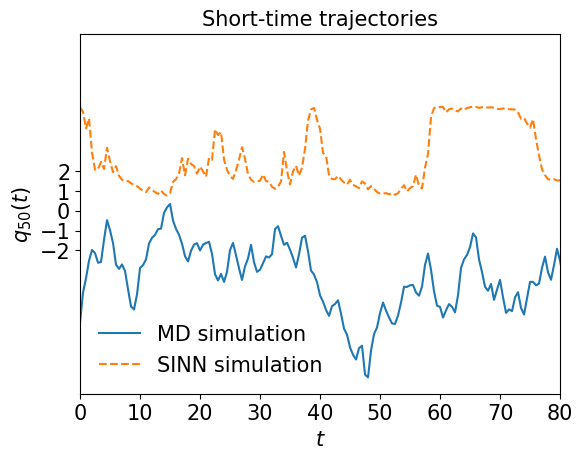

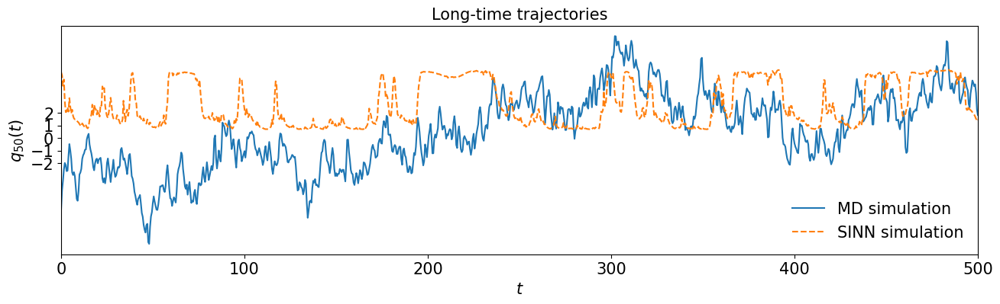

In [139]:
test5(model9)

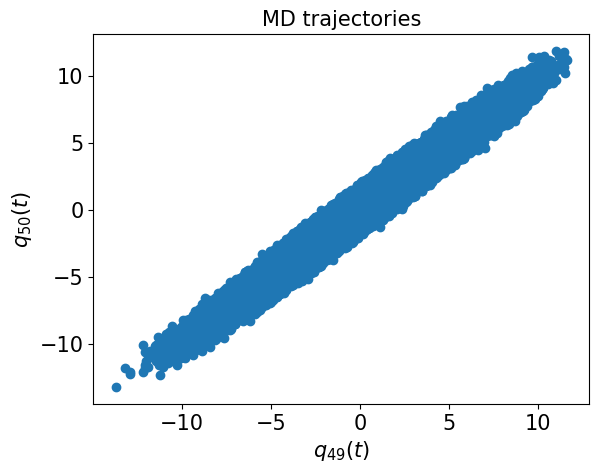

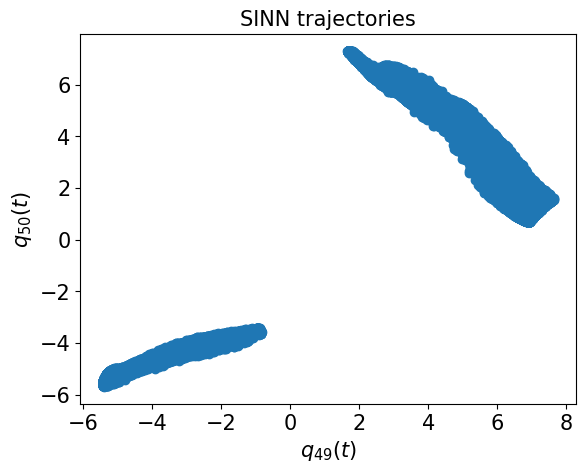

In [140]:
test6(model9)

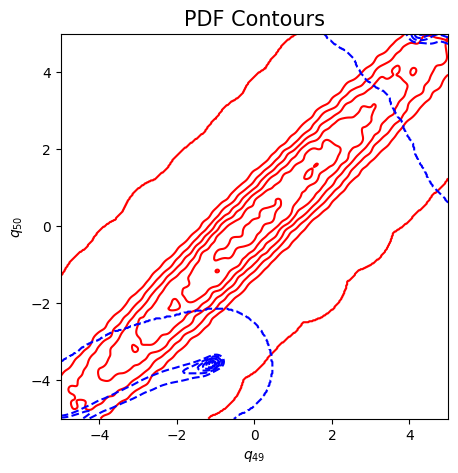

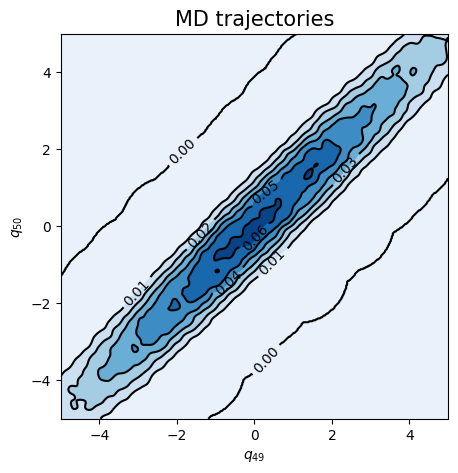

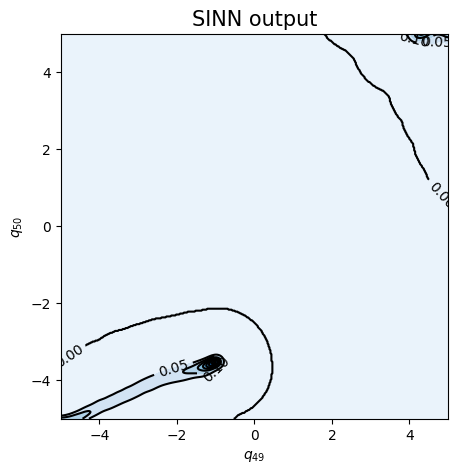

In [141]:
test7(model9)